# `FIFA 19 Player Analysis`

##### Objective
*FIFA 19 is a soccer/football simulation video game in which the user controls models of real-world players. Each player has an number called their Overall that acts as a proxy of how good they are. The overall value ranges from 1-99 and is used in FIFA 19 to compare players and track growth of player attributes like dribbling ability or stamina. Although this number is very important, there is no formula that describes how this number is derived. Here, I will work backwards using the overall and the player stats to find out how it is calculated.*


# Step 1: Importing import packages

In [1]:
# import libraries
import pandas as pd
import numpy as np

# For Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# Pandas Settings
# pd.options.display.float_format = '{:.1f}'.format
pd.set_option('display.max_rows', 40000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# For building model
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.datasets import fetch_mldata
from sklearn import metrics
from RegscorePy import *

# To perform KMeans clustering
from sklearn.cluster import KMeans

# To perform Hierarchical clustering
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree

# Miscellaneous imports
from datetime import datetime
from scipy.stats import norm
import re

# Step 2: Reading Data

##### Reading the main data file

In [272]:
fifa_df = pd.read_csv('data.csv')
fifa_df.head()

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,https://cdn.sofifa.org/teams/2/light/241.png,€110.5M,€565K,2202,Left,5.0,4.0,4.0,Medium/ Medium,Messi,Yes,RF,10.0,"Jul 1, 2004",NaN,2021,5'7,159lbs,88+2,88+2,88+2,92+2,93+2,93+2,93+2,92+2,93+2,93+2,93+2,91+2,84+2,84+2,84+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,47+2,47+2,47+2,59+2,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,https://cdn.sofifa.org/teams/2/light/45.png,€77M,€405K,2228,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,Yes,ST,7.0,"Jul 10, 2018",NaN,2022,6'2,183lbs,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,https://cdn.sofifa.org/teams/2/light/73.png,€118.5M,€290K,2143,Right,5.0,5.0,5.0,High/ Medium,Neymar,Yes,LW,10.0,"Aug 3, 2017",NaN,2022,5'9,150lbs,84+3,84+3,84+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,88+3,81+3,81+3,81+3,88+3,65+3,60+3,60+3,60+3,65+3,60+3,47+3,47+3,47+3,60+3,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,https://cdn.sofifa.org/teams/2/light/11.png,€72M,€260K,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,Yes,GK,1.0,"Jul 1, 2011",NaN,2020,6'4,168lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,https://cdn.sofifa.org/teams/2/light/10.png,€102M,€355K,2281,Right,4.0,5.0,4.0,High/ High,Normal,Yes,RCM,7.0,"Aug 30, 2015",NaN,2023,5'11,154lbs,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


In [3]:
fifa_df.shape

(18207, 89)

# Step 3: Data Preparation

### Handling Duplicate Rows

In [4]:
# removing duplicate rows
fifa_df.drop_duplicates(subset='Name', inplace=True)
fifa_df.shape

(17194, 89)

### Dropping Unnecessary Columns NOT needed for Analysis

In [5]:
# Identifying if any column exists with only null values
fifa_df.isnull().all(axis=0).any()

False

In [6]:
# Dropping all columns with only 0 values
fifa_df.loc[:, (fifa_df != 0).any(axis=0)]
fifa_df.shape

(17194, 89)

In [7]:
#Remove columns which has only one unique value  
fifa_df= fifa_df.loc[:,fifa_df.nunique()!=1]
fifa_df.shape

(17194, 89)

In [8]:
#Remove columns not required for analysis
drop_col = ['Unnamed: 0','ID','Photo','Flag','Club Logo','Real Face','Loaned From','LS', 'ST', 'RS', 'LW', 'LF', 'CF', \
            'RF', 'RW', 'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM','RM', 'LWB', 'LDM', 'CDM', 'RDM', 'RWB', 'LB', \
            'LCB', 'CB', 'RCB', 'RB']
 
fifa_df = fifa_df.drop(drop_col, axis=1)
fifa_df.shape

(17194, 56)

### Handling Null Values

##### Checking null values in Player dataframe

In [9]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(fifa_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(fifa_df.isnull().sum()/fifa_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])
pd.concat([total, percentage], axis = 1)

,Total,Percentage
Release Clause,1473,8.57
Joined,1462,8.50
Contract Valid Until,276,1.61
Club,231,1.34
Position,56,0.33
Jersey Number,56,0.33
Preferred Foot,45,0.26
Crossing,45,0.26
FKAccuracy,45,0.26
GKReflexes,45,0.26


In [10]:
# Filling Nan values in release clause with 0
fifa_df['Release Clause'].fillna(0, inplace = True)

In [11]:
# Filling Nan values in Club clause with 'None'
fifa_df['Club'].fillna('None', inplace = True)

In [12]:
# Filling Nan values in Joined clause with '2019'
fifa_df['Joined'].fillna('2019', inplace = True)

In [13]:
# Deleting rows with Nan values for column Contract Valid Until
fifa_df = fifa_df.loc[~fifa_df['Contract Valid Until'].isnull()]

##### Checking null values in Player dataframe

In [14]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(fifa_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(fifa_df.isnull().sum()/fifa_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])
pd.concat([total, percentage], axis = 1)

,Total,Percentage
Release Clause,0,0.0
GKReflexes,0,0.0
Volleys,0,0.0
ShortPassing,0,0.0
HeadingAccuracy,0,0.0
Finishing,0,0.0
Crossing,0,0.0
Weight,0,0.0
Height,0,0.0
Contract Valid Until,0,0.0


##### No further Null values left

### Changing datatypes

In [15]:
fifa_df.dtypes

Name                         object
Age                           int64
Nationality                  object
Overall                       int64
Potential                     int64
Club                         object
Value                        object
Wage                         object
Special                       int64
Preferred Foot               object
International Reputation    float64
Weak Foot                   float64
Skill Moves                 float64
Work Rate                    object
Body Type                    object
Position                     object
Jersey Number               float64
Joined                       object
Contract Valid Until         object
Height                       object
Weight                       object
Crossing                    float64
Finishing                   float64
HeadingAccuracy             float64
ShortPassing                float64
Volleys                     float64
Dribbling                   float64
Curve                       

### Converting `Jersey Number` from float to object

In [16]:
fifa_df['Jersey Number'] = fifa_df['Jersey Number'].astype(str)

### Convert height (in feet and inches) to centimeters(numeric datatype)

In [17]:
def height_in_ms(ht):
    if str(ht).find('\'') == -1:
        height_in_ms = round(int(ht) * 0.3048, 2)
    else:
        height_ft = str(ht).split('\'')[0]
        height_inch = str(ht).split('\'')[1]
        height_in_inches = int(height_ft) * 12 + int(height_inch)
        height_in_ms = round(height_in_inches * 0.0254, 2)
    return height_in_ms

In [18]:
fifa_df['Height_in_ms'] = fifa_df['Height'].apply(lambda x:height_in_ms(x))

fifa_df = fifa_df.drop('Height', axis=1)

fifa_df.head()

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Weight,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause,Height_in_ms
0,L. Messi,31,Argentina,94,94,FC Barcelona,€110.5M,€565K,2202,Left,5.0,4.0,4.0,Medium/ Medium,Messi,RF,10.0,"Jul 1, 2004",2021,159lbs,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M,1.70
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,€77M,€405K,2228,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,ST,7.0,"Jul 10, 2018",2022,183lbs,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M,1.88
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,€118.5M,€290K,2143,Right,5.0,5.0,5.0,High/ Medium,Neymar,LW,10.0,"Aug 3, 2017",2022,150lbs,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M,1.75
3,De Gea,27,Spain,91,93,Manchester United,€72M,€260K,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,"Jul 1, 2011",2020,168lbs,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M,1.93
4,K. De Bruyne,27,Belgium,91,92,Manchester City,€102M,€355K,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,"Aug 30, 2015",2023,154lbs,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M,1.80


### Convert weight (in pounds) to Kgs(numeric datatype)

In [19]:
def weight_in_kgs(wt):     
        weight_in_lbs = str(wt)[0:-3]
        weight_in_kgs = round(int(weight_in_lbs) * 0.453592, 2)
        return weight_in_kgs

In [20]:
fifa_df['Weight_in_kgs'] = fifa_df['Weight'].apply(lambda x:weight_in_kgs(x))

fifa_df = fifa_df.drop('Weight', axis=1)

fifa_df.head()

,Name,Age,Nationality,Overall,Potential,Club,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause,Height_in_ms,Weight_in_kgs
0,L. Messi,31,Argentina,94,94,FC Barcelona,€110.5M,€565K,2202,Left,5.0,4.0,4.0,Medium/ Medium,Messi,RF,10.0,"Jul 1, 2004",2021,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M,1.70,72.12
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,€77M,€405K,2228,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,ST,7.0,"Jul 10, 2018",2022,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M,1.88,83.01
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,€118.5M,€290K,2143,Right,5.0,5.0,5.0,High/ Medium,Neymar,LW,10.0,"Aug 3, 2017",2022,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M,1.75,68.04
3,De Gea,27,Spain,91,93,Manchester United,€72M,€260K,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,"Jul 1, 2011",2020,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M,1.93,76.20
4,K. De Bruyne,27,Belgium,91,92,Manchester City,€102M,€355K,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,"Aug 30, 2015",2023,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M,1.80,69.85


### Creating a new column 'Wage_in_Th' by slicing out `€` & `K`

In [21]:
fifa_df['Wage_in_Th'] = fifa_df['Wage'].apply(lambda x:x[1:-1])

fifa_df = fifa_df.drop('Wage', axis=1)

fifa_df.head()

,Name,Age,Nationality,Overall,Potential,Club,Value,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause,Height_in_ms,Weight_in_kgs,Wage_in_Th
0,L. Messi,31,Argentina,94,94,FC Barcelona,€110.5M,2202,Left,5.0,4.0,4.0,Medium/ Medium,Messi,RF,10.0,"Jul 1, 2004",2021,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M,1.70,72.12,565
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,€77M,2228,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,ST,7.0,"Jul 10, 2018",2022,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M,1.88,83.01,405
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,€118.5M,2143,Right,5.0,5.0,5.0,High/ Medium,Neymar,LW,10.0,"Aug 3, 2017",2022,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M,1.75,68.04,290
3,De Gea,27,Spain,91,93,Manchester United,€72M,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,"Jul 1, 2011",2020,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M,1.93,76.20,260
4,K. De Bruyne,27,Belgium,91,92,Manchester City,€102M,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,"Aug 30, 2015",2023,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M,1.80,69.85,355


### Creating new column 'Value_in_M' & `Release_Clause_in_M` by expressing the sum in millions

In [22]:
def val_in_m(val):
    if str(val)[-1] == '0':
        val_in_mil = 0 
    elif str(val)[-1] == 'M':
        val_in_mil = str(val)[1:-1]   
    else:
        val_in_mil = round(int(val[1:-1])/1000, 2)
    return val_in_mil

In [23]:
fifa_df['Value_in_M'] = fifa_df['Value'].apply(lambda x:val_in_m(x))
fifa_df['Release_Clause_in_M'] = fifa_df['Release Clause'].apply(lambda x:val_in_m(x))

drop_columns = ['Value', 'Release Clause']
 
fifa_df = fifa_df.drop(drop_columns, axis=1)

fifa_df.head()

,Name,Age,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M
0,L. Messi,31,Argentina,94,94,FC Barcelona,2202,Left,5.0,4.0,4.0,Medium/ Medium,Messi,RF,10.0,"Jul 1, 2004",2021,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,565,110.5,226.5
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,2228,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,ST,7.0,"Jul 10, 2018",2022,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,405,77,127.1
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,2143,Right,5.0,5.0,5.0,High/ Medium,Neymar,LW,10.0,"Aug 3, 2017",2022,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,290,118.5,228.1
3,De Gea,27,Spain,91,93,Manchester United,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,"Jul 1, 2011",2020,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,260,72,138.6
4,K. De Bruyne,27,Belgium,91,92,Manchester City,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,"Aug 30, 2015",2023,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,355,102,196.4


### Converting `Wage`, `Value` & `Release Clause` from object to float

In [24]:
# Int to string

fifa_df[['Wage_in_Th','Value_in_M','Release_Clause_in_M']] = \
fifa_df[['Wage_in_Th','Value_in_M','Release_Clause_in_M']].astype('float64')

fifa_df.dtypes

Name                         object
Age                           int64
Nationality                  object
Overall                       int64
Potential                     int64
Club                         object
Special                       int64
Preferred Foot               object
International Reputation    float64
Weak Foot                   float64
Skill Moves                 float64
Work Rate                    object
Body Type                    object
Position                     object
Jersey Number                object
Joined                       object
Contract Valid Until         object
Crossing                    float64
Finishing                   float64
HeadingAccuracy             float64
ShortPassing                float64
Volleys                     float64
Dribbling                   float64
Curve                       float64
FKAccuracy                  float64
LongPassing                 float64
BallControl                 float64
Acceleration                

### Extracting `Year` from `Joined` & `Contract Valid Until` columns

In [25]:
fifa_df['Joined'] = fifa_df['Joined'].apply(lambda x:x[-4:])
fifa_df['Contract Valid Until'] = fifa_df['Contract Valid Until'].apply(lambda x:x[-4:])

fifa_df.head()

,Name,Age,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M
0,L. Messi,31,Argentina,94,94,FC Barcelona,2202,Left,5.0,4.0,4.0,Medium/ Medium,Messi,RF,10.0,2004,2021,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,565.0,110.5,226.5
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,2228,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,ST,7.0,2018,2022,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,405.0,77.0,127.1
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,2143,Right,5.0,5.0,5.0,High/ Medium,Neymar,LW,10.0,2017,2022,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,290.0,118.5,228.1
3,De Gea,27,Spain,91,93,Manchester United,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,2011,2020,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,260.0,72.0,138.6
4,K. De Bruyne,27,Belgium,91,92,Manchester City,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,2015,2023,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,355.0,102.0,196.4


### Converting `Joined` & `Contract Valid Until` from object to int

In [26]:
# Int to string

fifa_df[['Joined','Contract Valid Until']] = \
fifa_df[['Joined','Contract Valid Until']].astype('int64')

fifa_df.dtypes

Name                         object
Age                           int64
Nationality                  object
Overall                       int64
Potential                     int64
Club                         object
Special                       int64
Preferred Foot               object
International Reputation    float64
Weak Foot                   float64
Skill Moves                 float64
Work Rate                    object
Body Type                    object
Position                     object
Jersey Number                object
Joined                        int64
Contract Valid Until          int64
Crossing                    float64
Finishing                   float64
HeadingAccuracy             float64
ShortPassing                float64
Volleys                     float64
Dribbling                   float64
Curve                       float64
FKAccuracy                  float64
LongPassing                 float64
BallControl                 float64
Acceleration                

### Inspecting if there are any records where `Contract Valid Until` < `Joined`

In [27]:
print(fifa_df.loc[fifa_df['Contract Valid Until'] < fifa_df['Joined']].shape[0])

134


### Dropping records where `Contract Valid Until` < `Joined`

In [28]:
fifa_df = fifa_df.loc[fifa_df['Contract Valid Until'] >= fifa_df['Joined']]

print(fifa_df.loc[fifa_df['Contract Valid Until'] < fifa_df['Joined']].shape[0])

0


In [29]:
print(fifa_df.shape)

(16784, 56)


### Creating a column called `Yrs_left_on_contract`

`'Yrs_left_on_contract' = 'Contract Valid Until' - 'Joined'`

In [30]:
col_index = fifa_df.columns.get_loc('Contract Valid Until') + 1
fifa_df.insert(loc=col_index,column='Yrs_left_on_contract',value=fifa_df['Contract Valid Until'] \
                    - fifa_df['Joined'])

fifa_df.head()

,Name,Age,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M
0,L. Messi,31,Argentina,94,94,FC Barcelona,2202,Left,5.0,4.0,4.0,Medium/ Medium,Messi,RF,10.0,2004,2021,17,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,565.0,110.5,226.5
1,Cristiano Ronaldo,33,Portugal,94,94,Juventus,2228,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,ST,7.0,2018,2022,4,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,405.0,77.0,127.1
2,Neymar Jr,26,Brazil,92,93,Paris Saint-Germain,2143,Right,5.0,5.0,5.0,High/ Medium,Neymar,LW,10.0,2017,2022,5,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,290.0,118.5,228.1
3,De Gea,27,Spain,91,93,Manchester United,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,2011,2020,9,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,260.0,72.0,138.6
4,K. De Bruyne,27,Belgium,91,92,Manchester City,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,2015,2023,8,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,355.0,102.0,196.4


### Creating a column called `Good_Yrs_left`

`'Good_Yrs_left' = 35 - 'Age'`

In [31]:
col_index = fifa_df.columns.get_loc('Age') + 1
fifa_df.insert(loc=col_index,column='Good_Yrs_left',value= 35 - fifa_df['Age'])

fifa_df.head()

,Name,Age,Good_Yrs_left,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M
0,L. Messi,31,4,Argentina,94,94,FC Barcelona,2202,Left,5.0,4.0,4.0,Medium/ Medium,Messi,RF,10.0,2004,2021,17,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,565.0,110.5,226.5
1,Cristiano Ronaldo,33,2,Portugal,94,94,Juventus,2228,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,ST,7.0,2018,2022,4,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,405.0,77.0,127.1
2,Neymar Jr,26,9,Brazil,92,93,Paris Saint-Germain,2143,Right,5.0,5.0,5.0,High/ Medium,Neymar,LW,10.0,2017,2022,5,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,290.0,118.5,228.1
3,De Gea,27,8,Spain,91,93,Manchester United,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,2011,2020,9,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,260.0,72.0,138.6
4,K. De Bruyne,27,8,Belgium,91,92,Manchester City,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,2015,2023,8,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,355.0,102.0,196.4


### Generalizing Body Type values for some of the players

In [32]:
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'C. Ronaldo', 'Lean', fifa_df['Body Type'])
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'Akinfenwa', 'Stocky', fifa_df['Body Type'])
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'Messi', 'Lean', fifa_df['Body Type'])
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'Shaqiri', 'Stocky', fifa_df['Body Type'])
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'Neymar', 'Lean', fifa_df['Body Type'])
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'PLAYER_BODY_TYPE_25', 'Normal', fifa_df['Body Type'])
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'Courtois', 'Lean', fifa_df['Body Type'])
fifa_df.head()

,Name,Age,Good_Yrs_left,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M
0,L. Messi,31,4,Argentina,94,94,FC Barcelona,2202,Left,5.0,4.0,4.0,Medium/ Medium,Lean,RF,10.0,2004,2021,17,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,565.0,110.5,226.5
1,Cristiano Ronaldo,33,2,Portugal,94,94,Juventus,2228,Right,5.0,4.0,5.0,High/ Low,Lean,ST,7.0,2018,2022,4,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,405.0,77.0,127.1
2,Neymar Jr,26,9,Brazil,92,93,Paris Saint-Germain,2143,Right,5.0,5.0,5.0,High/ Medium,Lean,LW,10.0,2017,2022,5,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,290.0,118.5,228.1
3,De Gea,27,8,Spain,91,93,Manchester United,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,2011,2020,9,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,260.0,72.0,138.6
4,K. De Bruyne,27,8,Belgium,91,92,Manchester City,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,2015,2023,8,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,355.0,102.0,196.4


### Bucketing the Age of players into specific bins

In [33]:
# Segmenting the Discount% into various bins

def age_binning(df,cut_points,label_names):
    column_index = df.columns.get_loc('Age') + 1
    df.insert(loc=column_index,column='Age_Group',value=pd.cut(df['Age'],cut_points,labels=label_names, include_lowest=True))
    return df

cut_points = [15,20,25,30,35,40,45]
label_names = ["Below 20","Between 20-25","Between 25-30","Between 30-35","Between 35-40","Above 40"]

fifa_df = age_binning(fifa_df,cut_points,label_names)
fifa_df.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M
0,L. Messi,31,Between 30-35,4,Argentina,94,94,FC Barcelona,2202,Left,5.0,4.0,4.0,Medium/ Medium,Lean,RF,10.0,2004,2021,17,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,565.0,110.5,226.5
1,Cristiano Ronaldo,33,Between 30-35,2,Portugal,94,94,Juventus,2228,Right,5.0,4.0,5.0,High/ Low,Lean,ST,7.0,2018,2022,4,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,405.0,77.0,127.1
2,Neymar Jr,26,Between 25-30,9,Brazil,92,93,Paris Saint-Germain,2143,Right,5.0,5.0,5.0,High/ Medium,Lean,LW,10.0,2017,2022,5,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,290.0,118.5,228.1
3,De Gea,27,Between 25-30,8,Spain,91,93,Manchester United,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,2011,2020,9,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,260.0,72.0,138.6
4,K. De Bruyne,27,Between 25-30,8,Belgium,91,92,Manchester City,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,2015,2023,8,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,355.0,102.0,196.4


### Creating a column called `Is_GK`

In [34]:
def is_gk(pstn):
    if pstn == 'GK':
        is_gk = 1
    else:
        is_gk = 0
    return is_gk

In [35]:
fifa_df['Is_GK'] = fifa_df['Position'].apply(lambda x:is_gk(x))

fifa_df.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M,Is_GK
0,L. Messi,31,Between 30-35,4,Argentina,94,94,FC Barcelona,2202,Left,5.0,4.0,4.0,Medium/ Medium,Lean,RF,10.0,2004,2021,17,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,565.0,110.5,226.5,0
1,Cristiano Ronaldo,33,Between 30-35,2,Portugal,94,94,Juventus,2228,Right,5.0,4.0,5.0,High/ Low,Lean,ST,7.0,2018,2022,4,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,405.0,77.0,127.1,0
2,Neymar Jr,26,Between 25-30,9,Brazil,92,93,Paris Saint-Germain,2143,Right,5.0,5.0,5.0,High/ Medium,Lean,LW,10.0,2017,2022,5,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,290.0,118.5,228.1,0
3,De Gea,27,Between 25-30,8,Spain,91,93,Manchester United,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,2011,2020,9,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,260.0,72.0,138.6,1
4,K. De Bruyne,27,Between 25-30,8,Belgium,91,92,Manchester City,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,2015,2023,8,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,355.0,102.0,196.4,0


## Outlier Detection

In [36]:
# Checking outliers at 25%,50%,75%,90%,95% and 99%

fifa_df.describe(percentiles=[.25,.5,.75,.90,.95,.99]).T

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
Age,16784.0,25.160689,4.671243,16.00,21.00,25.00,28.00,32.00,33.000,36.00,44.00
Good_Yrs_left,16784.0,9.839311,4.671243,-9.00,7.00,10.00,14.00,16.00,17.000,18.00,19.00
Overall,16784.0,66.400739,6.959201,46.00,62.00,66.00,71.00,75.00,78.000,83.00,94.00
Potential,16784.0,71.409318,6.176388,48.00,67.00,71.00,75.00,80.00,82.000,87.00,95.00
Special,16784.0,1601.847831,274.393910,731.00,1461.00,1641.00,1792.00,1916.00,1982.000,2102.00,2346.00
International Reputation,16784.0,1.118982,0.404600,1.00,1.00,1.00,1.00,1.00,2.000,3.00,5.00
Weak Foot,16784.0,2.954957,0.661590,1.00,3.00,3.00,3.00,4.00,4.000,5.00,5.00
Skill Moves,16784.0,2.369697,0.760438,1.00,2.00,2.00,3.00,3.00,4.000,4.00,5.00
Joined,16784.0,2016.609092,2.136277,1998.00,2016.00,2017.00,2018.00,2018.00,2019.000,2019.00,2019.00
Contract Valid Until,16784.0,2020.164144,1.279896,2018.00,2019.00,2020.00,2021.00,2022.00,2023.000,2023.00,2026.00


### Outlier Distribution for some of the Numeric columns

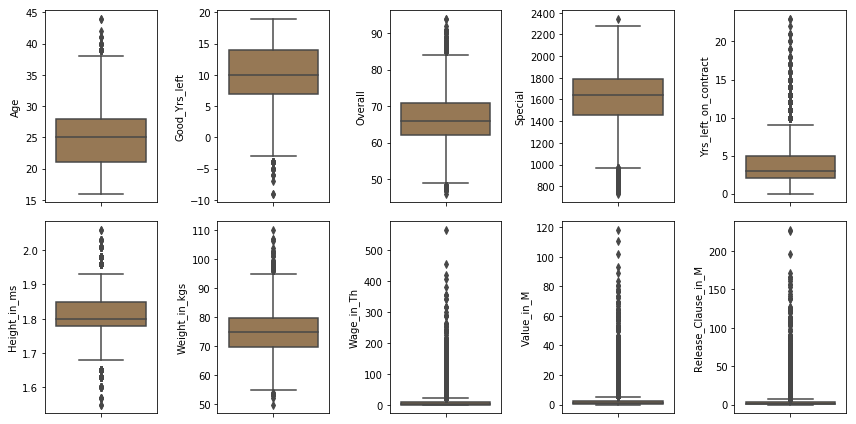

In [37]:
# Function to plot the distribution plot of the numeric variable list

numeric_variables=['Age','Good_Yrs_left', 'Overall','Special','Yrs_left_on_contract','Height_in_ms','Weight_in_kgs', \
                   'Wage_in_Th','Value_in_M','Release_Clause_in_M']

#Function to plot the distribution plot of the numeric variable list
def univariate_continuos(var_list):
    plt.figure(figsize=(12,6))
    for var in var_list:
        plt.subplot(2,5,var_list.index(var)+1)
        sns.boxplot(y=var,palette='cubehelix', data=fifa_df)
    # Automatically adjust subplot params so that the subplotS fits in to the figure area.
    plt.tight_layout()
    # display the plot
    plt.show()
    
univariate_continuos(numeric_variables)    

##### There are significant outliers in the features - `'Yrs_left_on_contract', 'Wage_in_Th', 'Value_in_M', 'Release_Clause_in_M'`

### Skewness for some of the Numeric columns

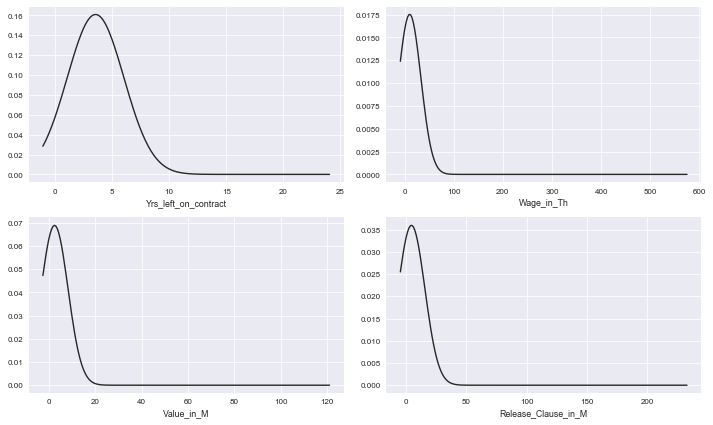

In [38]:
sns.set_style("darkgrid") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

num_col = ['Yrs_left_on_contract', 'Wage_in_Th', 'Value_in_M', 'Release_Clause_in_M']

#Function to plot the distribution plot of the numeric variable list
def distplots(var_list):
    plt.figure(figsize=(10,6))
    for var in var_list:
        plt.subplot(2,2,var_list.index(var)+1)
        sns.distplot(fifa_df[var], fit=norm, kde=False, hist=False)
    # Automatically adjust subplot params so that the subplotS fits in to the figure area.
    plt.tight_layout()
    # display the plot
    plt.show()
    
distplots(num_col)

#### Clearly the columns are left skewed. So, we perform log transformation so that the skewness is reduced to nearly nearly zero.

Skew in 'Yrs_left_on_contract' before log transformation is 1.551205:
Skew in 'Wage_in_Th' before log transformation is 7.681011:
Skew in 'Value_in_M' before log transformation is 6.861803:
Skew in 'Release_Clause_in_M' before log transformation is 7.141701:


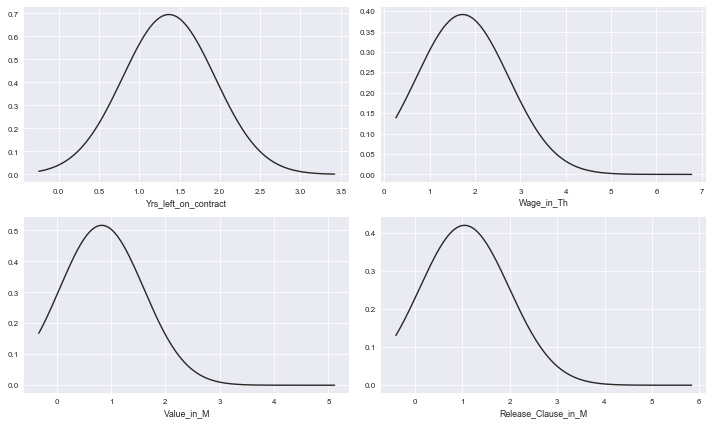

Skew in 'Yrs_left_on_contract' after log transformation is -0.613400:
Skew in 'Wage_in_Th' after log transformation is 1.022400:
Skew in 'Value_in_M' after log transformation is 1.520326:
Skew in 'Release_Clause_in_M' after log transformation is 1.333090:


In [39]:
# Determining the Skewness of data prior to log transformation
print ("Skew in 'Yrs_left_on_contract' before log transformation is %f:" % fifa_df['Yrs_left_on_contract'].skew())
print ("Skew in 'Wage_in_Th' before log transformation is %f:" % fifa_df['Wage_in_Th'].skew())
print ("Skew in 'Value_in_M' before log transformation is %f:" % fifa_df['Value_in_M'].skew())
print ("Skew in 'Release_Clause_in_M' before log transformation is %f:" % fifa_df['Release_Clause_in_M'].skew())

# Performing log transformation on SalePrice
#We use the numpy fuction log1p which  applies log(1+x) to all elements of the column
fifa_df["Yrs_left_on_contract"] = np.log1p(fifa_df["Yrs_left_on_contract"])
fifa_df["Wage_in_Th"] = np.log1p(fifa_df["Wage_in_Th"])
fifa_df["Value_in_M"] = np.log1p(fifa_df["Value_in_M"])
fifa_df["Release_Clause_in_M"] = np.log1p(fifa_df["Release_Clause_in_M"])

# Replotting the skwness on the treated features
distplots(num_col)

# Determining the Skewness of data post log transformation
print ("Skew in 'Yrs_left_on_contract' after log transformation is %f:" % fifa_df['Yrs_left_on_contract'].skew())
print ("Skew in 'Wage_in_Th' after log transformation is %f:" % fifa_df['Wage_in_Th'].skew())
print ("Skew in 'Value_in_M' after log transformation is %f:" % fifa_df['Value_in_M'].skew())
print ("Skew in 'Release_Clause_in_M' after log transformation is %f:" % fifa_df['Release_Clause_in_M'].skew())

#### After the Logarithmic conversion, the data distribution is close to normal.

### Replotting the Outlier Distribution for the Numeric columns

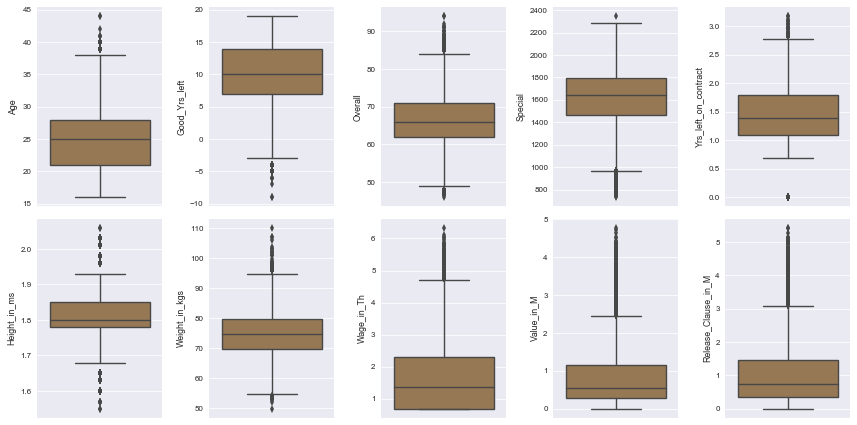

In [40]:
univariate_continuos(numeric_variables)    

##### There are still some outliers present but we will still ignore them.

## EDA & Visualization

In [41]:
fifa_df.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M,Is_GK
0,L. Messi,31,Between 30-35,4,Argentina,94,94,FC Barcelona,2202,Left,5.0,4.0,4.0,Medium/ Medium,Lean,RF,10.0,2004,2021,2.890372,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,6.338594,4.714025,5.427150,0
1,Cristiano Ronaldo,33,Between 30-35,2,Portugal,94,94,Juventus,2228,Right,5.0,4.0,5.0,High/ Low,Lean,ST,7.0,2018,2022,1.609438,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,6.006353,4.356709,4.852811,0
2,Neymar Jr,26,Between 25-30,9,Brazil,92,93,Paris Saint-Germain,2143,Right,5.0,5.0,5.0,High/ Medium,Lean,LW,10.0,2017,2022,1.791759,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,5.673323,4.783316,5.434159,0
3,De Gea,27,Between 25-30,8,Spain,91,93,Manchester United,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,2011,2020,2.302585,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,5.564520,4.290459,4.938781,1
4,K. De Bruyne,27,Between 25-30,8,Belgium,91,92,Manchester City,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,2015,2023,2.197225,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,5.874931,4.634729,5.285232,0


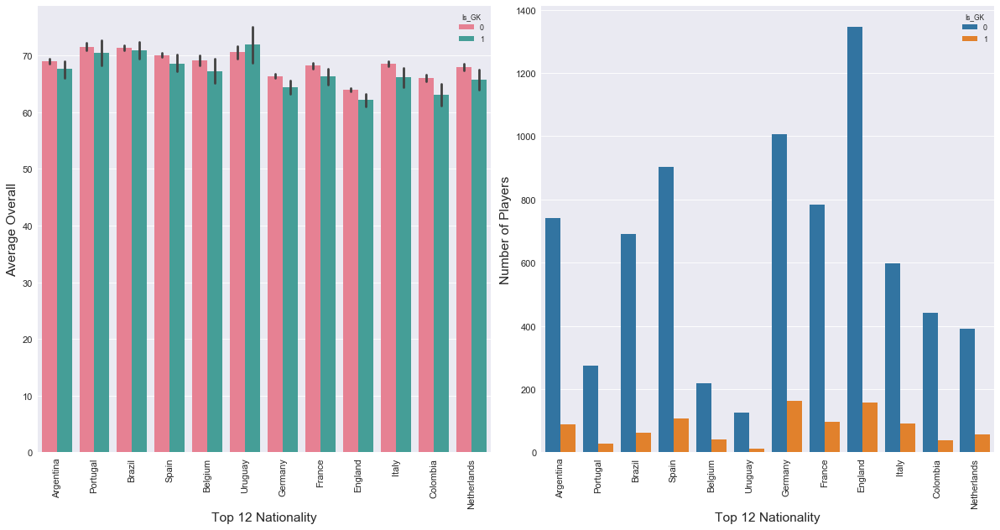

In [42]:
top_nationalities = ['Belgium','France','Brazil','England','Uruguay','Portugal','Spain', \
                     'Argentina','Colombia','Germany','Netherlands','Italy']

top12_nationality = fifa_df.loc[fifa_df['Nationality'].isin(top_nationalities)]

# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(15,8), dpi=80, facecolor='w', edgecolor='k', frameon='True')

# subplot 1
plt.subplot(1, 2, 1)
sns.barplot(x='Nationality', y='Overall', hue ='Is_GK', palette='husl', data=top12_nationality, estimator=np.mean)
plt.xticks(rotation='vertical', fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Top 12 Nationality',fontsize = 14)
plt.ylabel('Average Overall',fontsize = 14)

# subplot 1
plt.subplot(1, 2, 2)
sns.countplot(x="Nationality", hue ='Is_GK', data=top12_nationality)
plt.xticks(rotation='vertical', fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Top 12 Nationality',fontsize = 14)
plt.ylabel('Number of Players',fontsize = 14)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

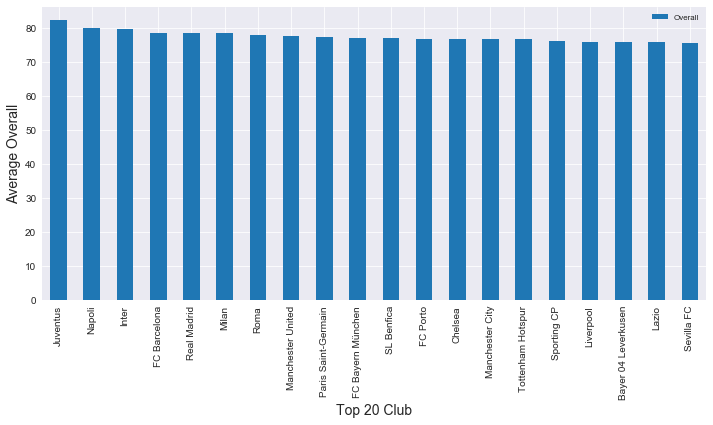

In [43]:
top10_club = pd.DataFrame(fifa_df.groupby('Club')['Overall'].mean().sort_values(ascending=False).head(20))

top10_club.plot(kind='bar',figsize=(10,6))
plt.xticks(rotation='vertical', fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Top 20 Club',fontsize = 14)
plt.ylabel('Average Overall',fontsize = 14)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

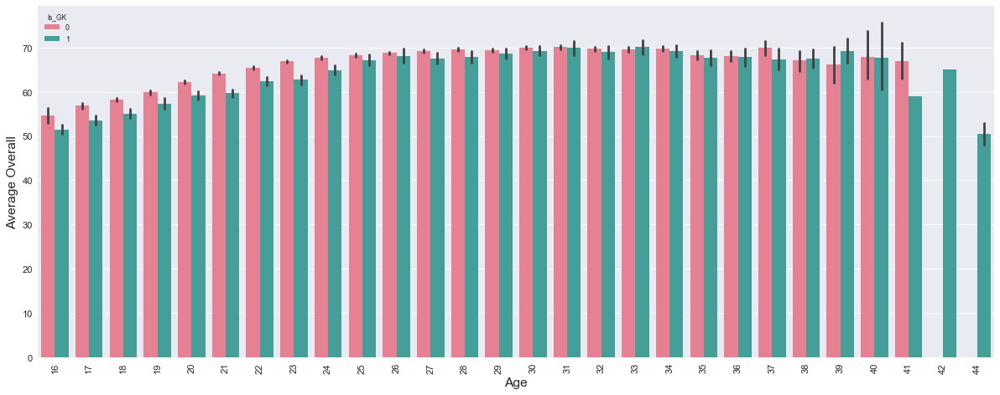

In [44]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(15, 6), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.barplot(x='Age', y='Overall', hue ='Is_GK', palette='husl', data=fifa_df, estimator=np.mean)

plt.xticks(rotation='vertical', fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Age',fontsize = 14)
plt.ylabel('Average Overall',fontsize = 14)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

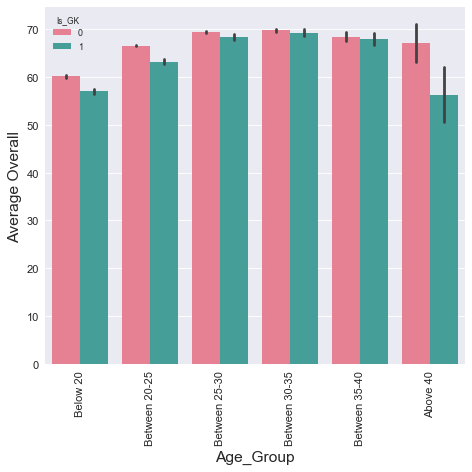

In [45]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(6,6), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.barplot(x='Age_Group', y='Overall', hue ='Is_GK', palette='husl', data=fifa_df, estimator=np.mean)

plt.xticks(rotation='vertical', fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Age_Group',fontsize = 14)
plt.ylabel('Average Overall',fontsize = 14)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

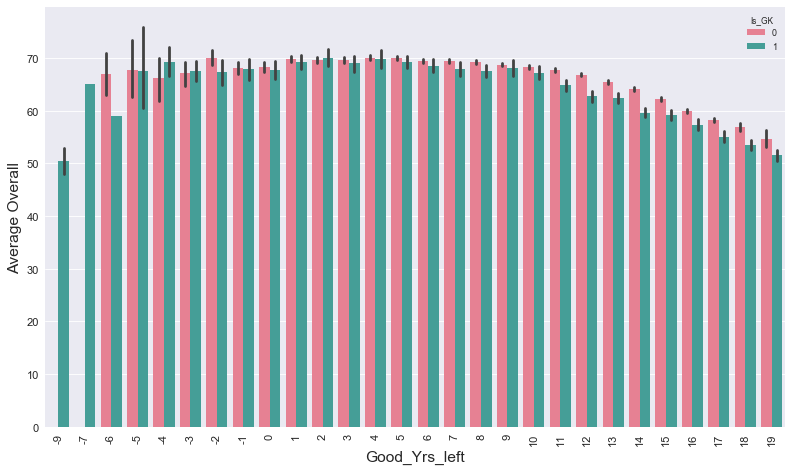

In [46]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10,6), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.barplot(x='Good_Yrs_left', y='Overall', hue ='Is_GK', palette='husl', data=fifa_df, estimator=np.mean)

plt.xticks(rotation='vertical', fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Good_Yrs_left',fontsize = 14)
plt.ylabel('Average Overall',fontsize = 14)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()



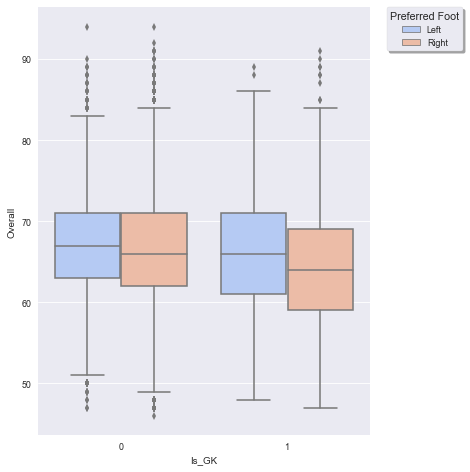

In [47]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(6,6), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.boxplot(x='Is_GK', y='Overall', hue='Preferred Foot', palette='coolwarm', data=fifa_df)
plt.legend(frameon=True, fontsize='small', shadow='True', title='Preferred Foot', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plot legend

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

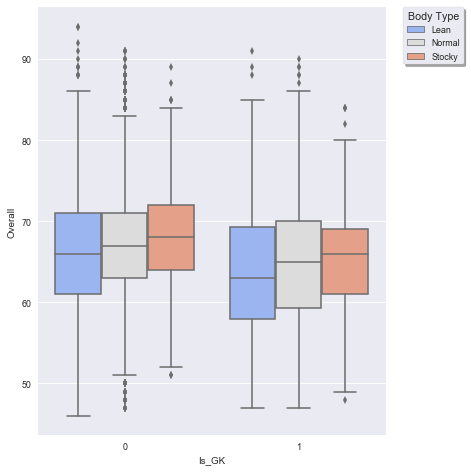

In [48]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(6,6), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.boxplot(x='Is_GK', y='Overall', hue='Body Type', palette='coolwarm', data=fifa_df)
plt.legend(frameon=True, fontsize='small', shadow='True', title='Body Type', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plot legend

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

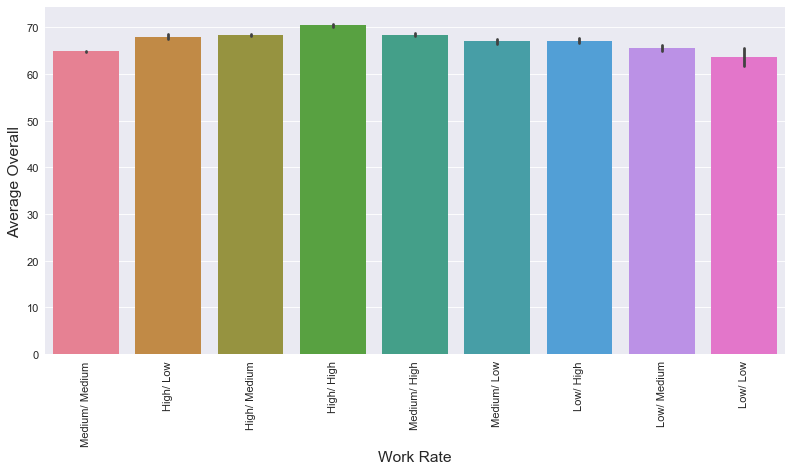

In [49]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10,6), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.barplot(x='Work Rate', y='Overall', palette='husl', data=fifa_df, estimator=np.mean)

plt.xticks(rotation='vertical', fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Work Rate',fontsize = 14)
plt.ylabel('Average Overall',fontsize = 14)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

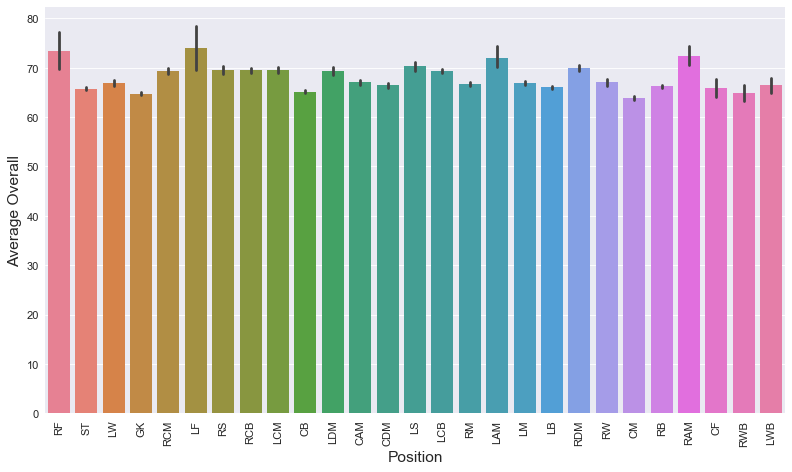

In [50]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10,6), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.barplot(x='Position', y='Overall', palette='husl', data=fifa_df, estimator=np.mean)

plt.xticks(rotation='vertical', fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Position',fontsize = 14)
plt.ylabel('Average Overall',fontsize = 14)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

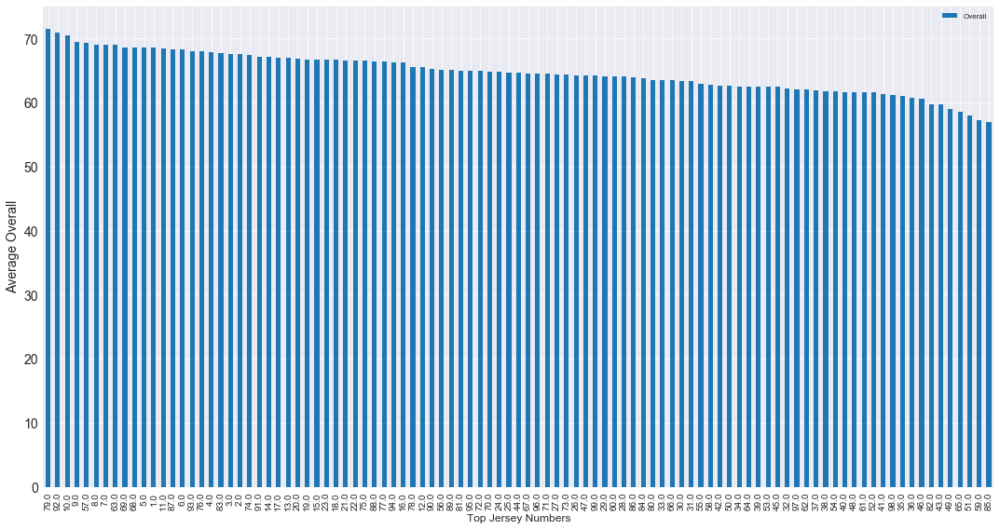

In [51]:
top_jerseys = pd.DataFrame(fifa_df.groupby('Jersey Number')['Overall'].mean().sort_values(ascending=False))

top_jerseys.plot(kind='bar',figsize=(15,8))
plt.xticks(rotation='vertical', fontsize = 10)
plt.yticks(fontsize = 14)
plt.xlabel('Top Jersey Numbers',fontsize = 12)
plt.ylabel('Average Overall',fontsize = 14)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

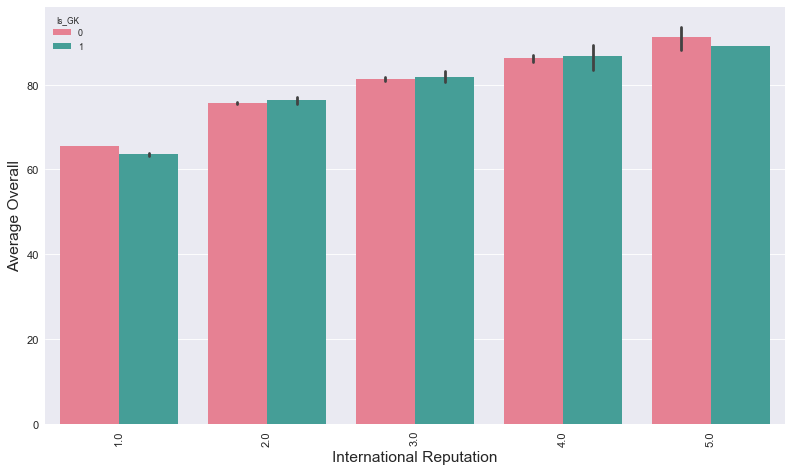

In [52]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10,6), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.barplot(x='International Reputation', y='Overall', hue ='Is_GK', palette='husl', data=fifa_df, estimator=np.mean)

plt.xticks(rotation='vertical', fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('International Reputation',fontsize = 14)
plt.ylabel('Average Overall',fontsize = 14)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

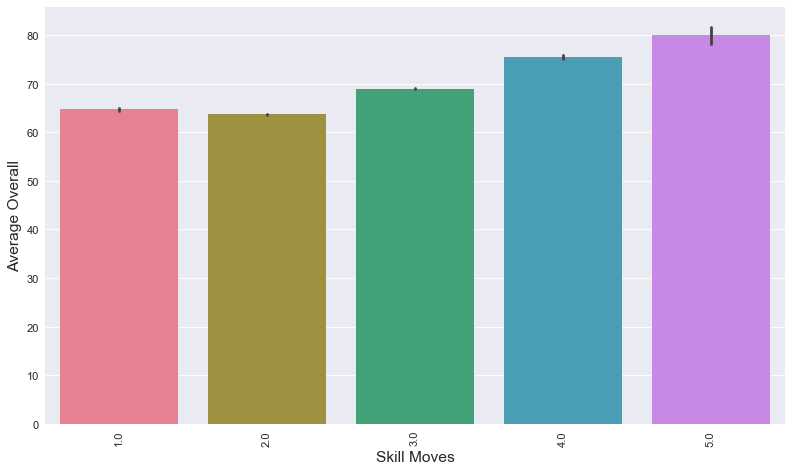

In [53]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10,6), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.barplot(x='Skill Moves', y='Overall', palette='husl', data=fifa_df, estimator=np.mean)

plt.xticks(rotation='vertical', fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Skill Moves',fontsize = 14)
plt.ylabel('Average Overall',fontsize = 14)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

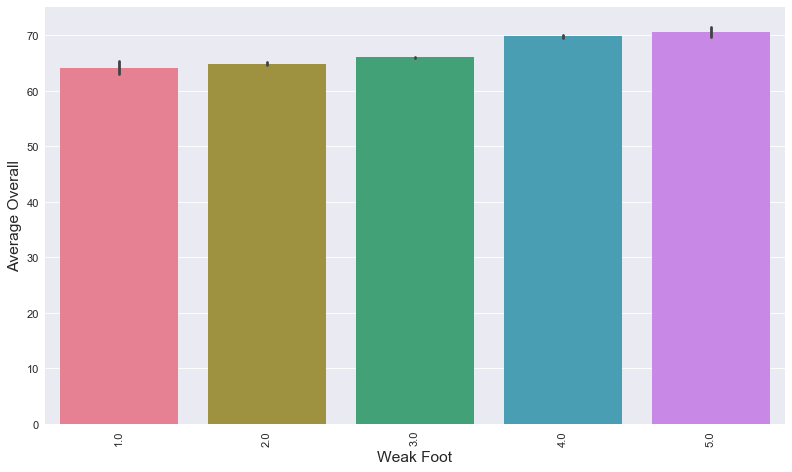

In [54]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10,6), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.barplot(x='Weak Foot', y='Overall', palette='husl', data=fifa_df, estimator=np.mean)

plt.xticks(rotation='vertical', fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Weak Foot',fontsize = 14)
plt.ylabel('Average Overall',fontsize = 14)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

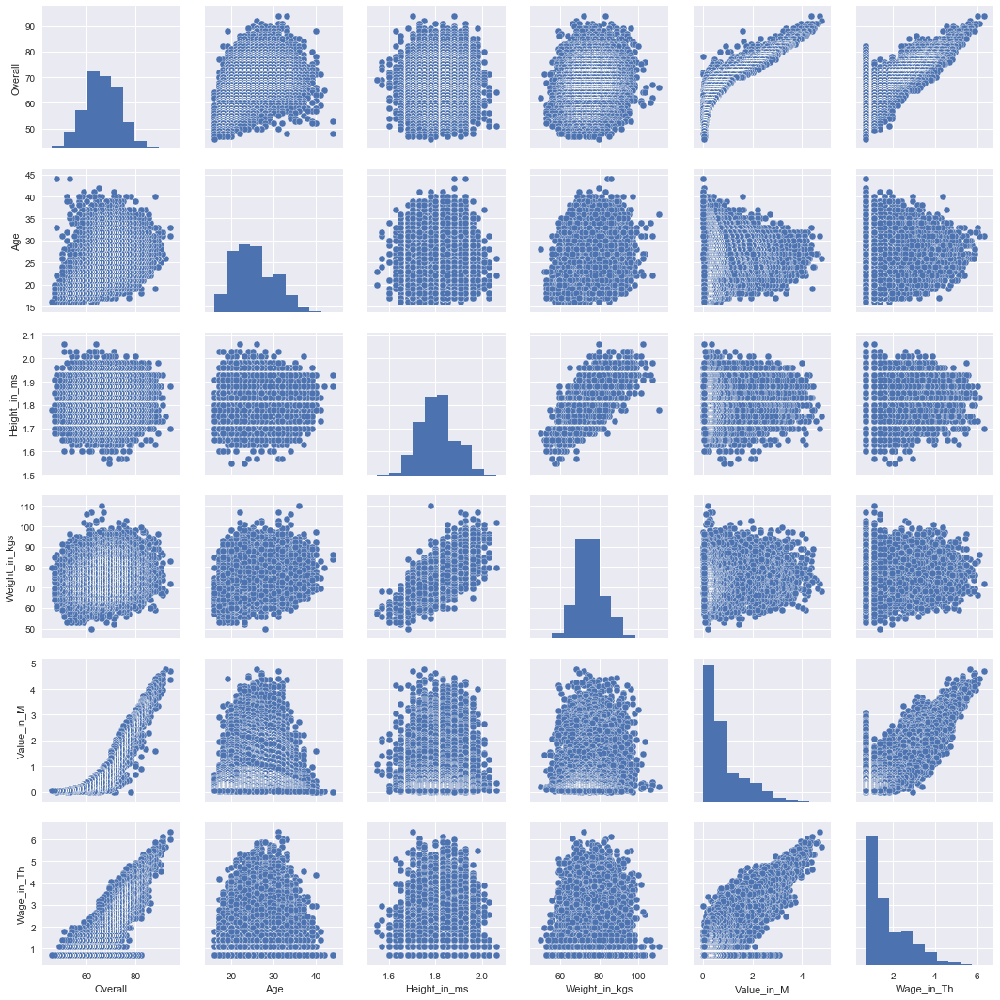

In [55]:
# Plotting a pairmap between highly correlated variables
sns.set()
cols = ['Overall', 'Age', 'Height_in_ms', 'Weight_in_kgs', 'Value_in_M', 'Wage_in_Th']
sns.pairplot(fifa_df[cols], size = 2.5)
plt.show();

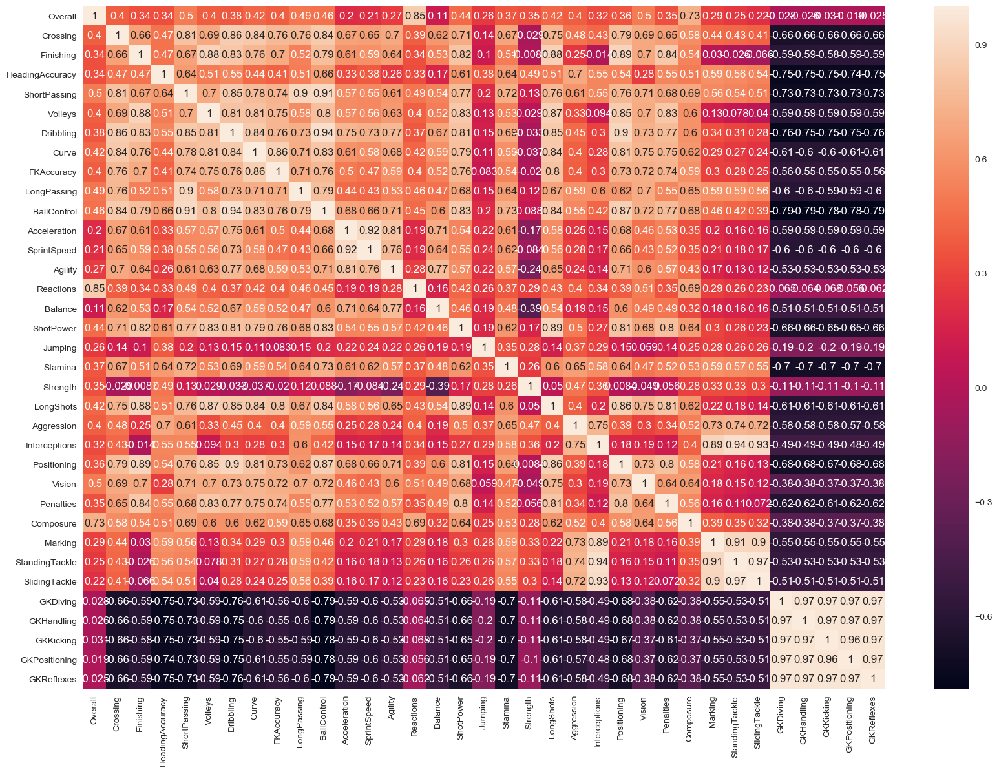

In [56]:
cols1 = ['Overall','Crossing','Finishing','HeadingAccuracy','ShortPassing','Volleys','Dribbling','Curve','FKAccuracy','LongPassing', \
        'BallControl','Acceleration','SprintSpeed','Agility','Reactions','Balance','ShotPower','Jumping','Stamina','Strength', \
        'LongShots','Aggression','Interceptions','Positioning','Vision','Penalties','Composure','Marking','StandingTackle', \
        'SlidingTackle','GKDiving','GKHandling','GKKicking','GKPositioning','GKReflexes']

plt.figure(figsize=(20,14), dpi=100, facecolor='w', edgecolor='k', frameon='True')
players_cor = fifa_df[cols1].corr()
sns.heatmap(players_cor, annot=True)
plt.show()

# Changing Categorical Columns to Numeric

In [57]:
fifa_df.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M,Is_GK
0,L. Messi,31,Between 30-35,4,Argentina,94,94,FC Barcelona,2202,Left,5.0,4.0,4.0,Medium/ Medium,Lean,RF,10.0,2004,2021,2.890372,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,6.338594,4.714025,5.427150,0
1,Cristiano Ronaldo,33,Between 30-35,2,Portugal,94,94,Juventus,2228,Right,5.0,4.0,5.0,High/ Low,Lean,ST,7.0,2018,2022,1.609438,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,6.006353,4.356709,4.852811,0
2,Neymar Jr,26,Between 25-30,9,Brazil,92,93,Paris Saint-Germain,2143,Right,5.0,5.0,5.0,High/ Medium,Lean,LW,10.0,2017,2022,1.791759,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,5.673323,4.783316,5.434159,0
3,De Gea,27,Between 25-30,8,Spain,91,93,Manchester United,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,2011,2020,2.302585,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,5.564520,4.290459,4.938781,1
4,K. De Bruyne,27,Between 25-30,8,Belgium,91,92,Manchester City,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,2015,2023,2.197225,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,5.874931,4.634729,5.285232,0


### Making a copy of original dataframes

In [58]:
fifa_cls = fifa_df.copy()
print(fifa_cls.shape)
print(fifa_df.shape)

(16784, 60)
(16784, 60)


### For categorical variable with multiple levels, creating dummy features (one-hot encoded)

In [59]:
# Creating dummy variables for the remaining categorical variable
dummy_age = pd.get_dummies(fifa_df[['Age_Group']], prefix='Age_Group', drop_first=True)
dummy_preferred_foot = pd.get_dummies(fifa_df[['Preferred Foot']], prefix='Preferred_Foot', drop_first=True)
dummy_work_rate = pd.get_dummies(fifa_df[['Work Rate']], prefix='Work_Rate', drop_first=True)
dummy_body_type = pd.get_dummies(fifa_df[['Body Type']], prefix='Body_Type', drop_first=True)
dummy_position = pd.get_dummies(fifa_df[['Position']], prefix='Position', drop_first=True)

# Adding the results to the original dataframes
fifa_df = pd.concat([fifa_df, dummy_age], axis=1)
fifa_df = pd.concat([fifa_df, dummy_preferred_foot], axis=1)
fifa_df = pd.concat([fifa_df, dummy_work_rate], axis=1)
fifa_df = pd.concat([fifa_df, dummy_body_type], axis=1)
fifa_df = pd.concat([fifa_df, dummy_position], axis=1)

fifa_df.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
0,L. Messi,31,Between 30-35,4,Argentina,94,94,FC Barcelona,2202,Left,5.0,4.0,4.0,Medium/ Medium,Lean,RF,10.0,2004,2021,2.890372,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,6.338594,4.714025,5.427150,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,Cristiano Ronaldo,33,Between 30-35,2,Portugal,94,94,Juventus,2228,Right,5.0,4.0,5.0,High/ Low,Lean,ST,7.0,2018,2022,1.609438,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,6.006353,4.356709,4.852811,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,Neymar Jr,26,Between 25-30,9,Brazil,92,93,Paris Saint-Germain,2143,Right,5.0,5.0,5.0,High/ Medium,Lean,LW,10.0,2017,2022,1.791759,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,5.673323,4.783316,5.434159,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,De Gea,27,Between 25-30,8,Spain,91,93,Manchester United,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,2011,2020,2.302585,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,5.564520,4.290459,4.938781,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,K. De Bruyne,27,Between 25-30,8,Belgium,91,92,Manchester City,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,2015,2023,2.197225,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,5.874931,4.634729,5.285232,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


### Dropping the repeated variable

In [60]:
# removing columns

cols_to_drop = ['Age_Group','Preferred Foot','Work Rate','Body Type', 'Position']
fifa_df = fifa_df.drop(cols_to_drop, axis=1)

print('Shape of final_df: {}'.format(fifa_df.shape))

Shape of final_df: (16784, 97)


# Predicting the `Overall` ratings of a player

## Linear Regression: Additive Model

#### Linear model assumes an additive relationship between the different KPIs. Hence their impacts are also additive towards the dependent Y variable.

#### The equation can be represented as:

						Y = α + β1At + β2Pt + β3Dt + β4Qt + β5Tt + ϵ


### Making a copy of original dataframes

In [61]:
fifa_org_df = fifa_df.copy()
print(fifa_org_df.shape)
print(fifa_df.shape)

(16784, 97)
(16784, 97)


### Dropping columns that won't be considered for prediction purpose

In [62]:
columns_to_drop = ['Name','Age', 'Potential', 'Nationality', 'Club', 'Jersey Number','Joined', 'Contract Valid Until', 'Wage_in_Th', 'Value_in_M', \
                   'Release_Clause_in_M']

fifa_org_df = fifa_org_df.drop(columns_to_drop, axis=1)
fifa_org_df.head()

,Good_Yrs_left,Overall,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
0,4,94,2202,5.0,4.0,4.0,2.890372,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,2,94,2228,5.0,4.0,5.0,1.609438,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,9,92,2143,5.0,5.0,5.0,1.791759,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,8,91,1471,4.0,3.0,1.0,2.302585,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,8,91,2281,4.0,5.0,4.0,2.197225,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [63]:
# Checking for total count and percentage of null values in all columns of the dataframe.

total = pd.DataFrame(fifa_org_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(fifa_org_df.isnull().sum()/fifa_org_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])

pd.concat([total, percentage], axis = 1).head()

,Total,Percentage
Position_ST,0,0.0
Penalties,0,0.0
Jumping,0,0.0
Stamina,0,0.0
Strength,0,0.0


### Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

In [64]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

fifa_org_df[fifa_org_df.columns]=scaler.fit_transform(fifa_org_df[fifa_org_df.columns])

fifa_org_df.head()

,Good_Yrs_left,Overall,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
0,-1.250092,3.965985,2.187257,9.592527,1.579639,2.143964,2.652931,1.849048,2.519018,1.009769,2.111514,2.412429,2.185134,2.468260,2.898743,2.221444,2.234827,1.758400,1.445194,1.852775,3.645040,2.190688,1.700228,0.240341,0.547283,-0.516281,2.416370,-0.464552,-1.200699,2.239645,2.848159,1.676265,3.240657,-0.721508,-0.915581,-0.928840,-0.599982,-0.318769,-0.074801,-0.140270,-0.484851,-1.677211,-0.456555,-0.354098,-0.767132,-0.663656,2.622940,-0.127384,-0.018911,-1.823059,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,32.372828,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
1,-1.678257,3.965985,2.282014,9.592527,1.579639,3.459036,0.421395,1.849048,2.467933,2.099284,1.500683,2.468660,1.710724,1.818827,1.874483,1.569537,2.115398,1.625132,1.785071,1.582616,3.755546,0.428563,2.279321,2.517849,1.551250,1.083375,2.364629,0.398761,-0.862751,2.290684,2.001099,2.311530,3.153417,-0.972386,-0.777241,-1.069616,-0.543535,-0.318769,-0.074801,-0.140270,-0.317951,0.990559,1.082307,-0.354098,-0.767132,-0.663656,2.622940,-0.127384,-0.018911,0.548529,5.030627,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.030890,-0.257015,-0.109539,-0.144868,-0.070497,2.755714
2,-0.179682,3.678587,1.972231,9.592527,3.091194,3.459036,0.739021,1.577629,2.110336,0.551026,1.704294,2.299967,2.132422,2.197663,2.500420,1.634727,2.175112,1.958301,1.717096,2.190474,3.534535,1.415353,1.410682,-0.350124,1.112015,-1.316108,1.795474,-0.004118,-0.524803,1.984452,2.354041,2.057424,3.066178,-1.022562,-1.100033,-0.600362,-0.430642,-0.436844,-0.074801,-0.081625,-0.317951,-0.936164,-1.033098,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,2.163744,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,6.913082,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.030890,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
3,-0.393764,3.534888,-0.476875,7.120874,0.068085,-1.801250,1.628938,-1.787959,-1.669970,-1.800031,-0.603289,-1.692429,-1.979128,-1.428338,-1.369005,-0.125421,-0.989733,-0.507150,-0.458117,-0.240961,3.092512,-1.474532,-1.426871,0.155989,-1.272406,-0.116367,-1.826419,-1.040095,-0.814473,-1.945534,1.012862,-0.547163,0.797948,-1.624670,-1.238373,-1.538870,4.141

### Splitting the Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [65]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

fifa_add_train, fifa_add_test = train_test_split(fifa_org_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [66]:
print(fifa_add_train.shape)
print(fifa_add_test.shape)

(11748, 86)
(5036, 86)


## Dividing the train dataframes into X and Y sets for the model building

In [67]:
y_fifa_add_train = fifa_add_train.pop('Overall')
X_fifa_add_train = fifa_add_train

X_fifa_add_train.head()

,Good_Yrs_left,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
2264,-1.892339,1.487512,-0.294083,1.579639,-0.486178,-2.382432,1.197643,0.373439,0.952426,1.161333,0.556808,0.814617,0.898797,0.793320,1.504346,0.622547,0.492357,0.629489,1.177376,1.876950,1.344868,0.136679,0.746454,1.174763,0.443513,0.708906,1.089412,1.116661,0.657443,1.577569,1.422159,0.710709,1.285518,0.975057,0.901250,-0.430642,-0.259731,-0.256321,-0.492138,-0.262317,-0.491535,-0.456555,-0.354098,-0.767132,-0.663656,2.622940,-0.127384,-0.018911,0.548529,-0.198782,2.163744,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,8.409905,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
11611,-0.607846,-1.005329,-0.294083,0.068085,-0.486178,-1.174889,-1.082271,-1.005862,0.608369,-0.739029,-0.680272,-0.924885,-1.211860,-0.913779,-1.559617,-0.392592,-1.506657,-1.545723,-1.321599,-1.217208,-1.333562,-0.674051,0.493398,-0.017448,1.323323,-1.515971,0.341207,0.585599,-1.333069,-1.316555,-0.547163,-0.161687,0.833937,0.790605,0.760474,-0.599982,-0.200694,-0.437842,-0.668073,-0.317951,0.990559,1.338077,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,0.844705,-0.257279,3.051161,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
12996,0.034401,0.124468,-0.294083,0.068085,0.828893,0.421395,0.329105,0.731035,-0.825202,0.754112,-0.230425,0.392920,0.411722,0.053577,0.852439,0.264262,0.625625,0.425563,0.299358,-0.996197,0.428563,0.136679,-0.265772,0.045300,-0.436298,0.346717,-0.579661,-0.862751,-0.261254,0.448155,0.723367,-0.336167,0.382356,-0.546676,0.150444,-0.148408,-0.318769,-0.135308,-0.081625,-0.151050,-0.195117,0.248580,-0.354098,1.303557,-0.663656,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
1991,0.462565,1.305287,-0.294083,3.091194,2.143964,0.739021,1.794764,1.037547,-0.939888,0.686242,1.512734,1.183603,1.602349,1.305450,0.396104,1.040545,1.558498,1.717096,1.785235,0.771894,1.344868,1.352773,0.999510,0.484536,-0.756229,1.381544,0.283653,0.054537,1.014715,-0.116552,-0.166004,1.059667,0.783761,0.467813,0.338146,-0.204855,-0.200694,-0.619362,-0.257559,-0.

## Dividing into X and Y test sets for the model building for 3 dataframes

In [68]:
y_fifa_add_test = fifa_add_test.pop('Overall')
X_fifa_add_test = fifa_add_test

X_fifa_add_test.head()

,Good_Yrs_left,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
1400,-0.179682,1.381822,-0.294083,0.068085,2.143964,1.007569,1.360494,1.292973,0.378998,0.957723,1.006656,1.447164,1.494111,1.589967,0.722058,1.279402,0.692259,0.493538,1.785235,1.103411,1.415353,1.005317,0.577750,0.547283,-0.916194,1.174578,1.377184,0.247651,1.218870,1.436392,1.231579,1.234146,0.532883,-0.362223,-0.553437,-0.148408,-0.141656,-0.498349,-0.316204,-0.484851,-1.232582,-0.904506,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,-1.823059,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,0.844705,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,3.890818,-0.109539,-0.144868,-0.070497,-0.362882
127,-0.179682,0.751322,4.649222,1.579639,-0.486178,0.739021,-0.050881,-1.056947,1.583198,0.821983,-0.905196,0.392920,-0.129472,-1.539715,1.178392,0.741975,0.159188,0.289612,-0.173421,1.987456,-0.346772,0.542043,0.915158,0.170796,1.163358,0.657165,1.262075,1.937393,-0.924758,0.377566,-0.483636,2.019303,2.038153,1.805094,1.745907,-0.487088,-0.377807,-0.558856,-0.140270,-0.206683,0.990559,0.377172,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,3.119528,-0.221063,-1.080054,0.844705,-0.257279,3.051161,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
17138,1.104811,-2.692734,-0.294083,0.068085,-1.801250,-1.174889,-2.059377,-1.925396,-2.316116,-2.232171,-1.917353,-2.189977,-1.861293,-1.710425,-2.276714,-2.661727,-2.506164,-2.293453,-1.726838,-2.101253,-2.179382,-2.179691,-2.037166,-2.401869,-0.436298,-2.033385,-1.960963,-1.683483,-2.302805,-1.034201,-2.262379,-3.302313,-2.026075,-1.561164,-1.585795,2.222354,2.515033,2.405980,1.970940,2.129926,1.435187,2.492577,2.824075,-0.767132,-0.663656,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,0.844705,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,2.824075,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
7789,0.248483,0.084378,-0.294083,0.068085,0.828893,0.032653,0.926225,0.679950,-0.137088,0.821983,0.669270,0.709193,0.249364,0.281191,1.048011,0.622547,0.292456,0.017711,0.704597,-0.333163,0.710503,0.426225,-0.603180,-0.268440,-0.516281,0.450200,-1.155203,-1.538648,0.657443,0.942273,0.723367,-0.336167,0.131478,-1.284486,-1.304243,-0.035515,-0.554919,-0.377335,-0.49213

### RFE
Recursive feature elimination

In [69]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [70]:
# Running RFE with the output number of the variable equal to 15
lr_0 = LinearRegression()
lr_0.fit(X_fifa_add_train, y_fifa_add_train)

rfe = RFE(lr_0, 20)             # running RFE
rfe = rfe.fit(X_fifa_add_train, y_fifa_add_train)

In [71]:
list(zip(X_fifa_add_train.columns,rfe.support_,rfe.ranking_))

[('Good_Yrs_left', False, 49),
 ('Special', True, 1),
 ('International Reputation', False, 14),
 ('Weak Foot', False, 58),
 ('Skill Moves', True, 1),
 ('Yrs_left_on_contract', False, 30),
 ('Crossing', False, 4),
 ('Finishing', False, 5),
 ('HeadingAccuracy', False, 40),
 ('ShortPassing', False, 18),
 ('Volleys', True, 1),
 ('Dribbling', True, 1),
 ('Curve', True, 1),
 ('FKAccuracy', True, 1),
 ('LongPassing', True, 1),
 ('BallControl', True, 1),
 ('Acceleration', False, 12),
 ('SprintSpeed', True, 1),
 ('Agility', True, 1),
 ('Reactions', True, 1),
 ('Balance', True, 1),
 ('ShotPower', False, 7),
 ('Jumping', False, 6),
 ('Stamina', True, 1),
 ('Strength', False, 13),
 ('LongShots', True, 1),
 ('Aggression', True, 1),
 ('Interceptions', True, 1),
 ('Positioning', True, 1),
 ('Vision', False, 2),
 ('Penalties', True, 1),
 ('Composure', True, 1),
 ('Marking', False, 8),
 ('StandingTackle', False, 3),
 ('SlidingTackle', True, 1),
 ('GKDiving', False, 19),
 ('GKHandling', False, 21),
 ('G

In [72]:
# Selecting 20 features selected by RFE 
col = X_fifa_add_train.columns[rfe.support_]
col

Index(['Special', 'Skill Moves', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'Stamina', 'LongShots', 'Aggression', 'Interceptions', 'Positioning', 'Penalties', 'Composure', 'SlidingTackle'], dtype='object')

In [73]:
# # Selecting features rejected by RFE 
X_fifa_add_train.columns[~rfe.support_]

Index(['Good_Yrs_left', 'International Reputation', 'Weak Foot', 'Yrs_left_on_contract', 'Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Acceleration', 'ShotPower', 'Jumping', 'Strength', 'Vision', 'Marking', 'StandingTackle', 'GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes', 'Height_in_ms', 'Weight_in_kgs', 'Is_GK', 'Age_Group_Between 20-25', 'Age_Group_Between 25-30', 'Age_Group_Between 30-35', 'Age_Group_Between 35-40', 'Age_Group_Above 40', 'Preferred_Foot_Right', 'Work_Rate_High/ Low', 'Work_Rate_High/ Medium', 'Work_Rate_Low/ High', 'Work_Rate_Low/ Low', 'Work_Rate_Low/ Medium', 'Work_Rate_Medium/ High', 'Work_Rate_Medium/ Low', 'Work_Rate_Medium/ Medium', 'Body_Type_Normal', 'Body_Type_Stocky', 'Position_CB', 'Position_CDM', 'Position_CF', 'Position_CM', 'Position_GK', 'Position_LAM', 'Position_LB', 'Position_LCB', 'Position_LCM', 'Position_LDM', 'Position_LF', 'Position_LM', 'Position_LS', 'Position_LW', 'Position_LWB', 'Position_RAM',
       'P

In [74]:
# Creating X_train_rfe dataframe with RFE selected variables
X_train_add_rfe = X_fifa_add_train[col]

In [75]:
X_train_add_rfe.head()

,Special,Skill Moves,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,SprintSpeed,Agility,Reactions,Balance,Stamina,LongShots,Aggression,Interceptions,Positioning,Penalties,Composure,SlidingTackle
2264,1.487512,-0.486178,0.556808,0.814617,0.898797,0.793320,1.504346,0.622547,0.629489,1.177376,1.876950,1.344868,1.174763,0.708906,1.089412,1.116661,0.657443,1.422159,0.710709,0.901250
11611,-1.005329,-0.486178,-0.680272,-0.924885,-1.211860,-0.913779,-1.559617,-0.392592,-1.545723,-1.321599,-1.217208,-1.333562,-0.017448,-1.515971,0.341207,0.585599,-1.333069,-0.547163,-0.161687,0.760474
12996,0.124468,0.828893,-0.230425,0.392920,0.411722,0.053577,0.852439,0.264262,0.425563,0.299358,-0.996197,0.428563,0.045300,0.346717,-0.579661,-0.862751,-0.261254,0.723367,-0.336167,0.150444
1991,1.305287,2.143964,1.512734,1.183603,1.602349,1.305450,0.396104,1.040545,1.717096,1.785235,0.771894,1.344868,0.484536,1.381544,0.283653,0.054537,1.014715,-0.166004,1.059667,0.338146
16044,-0.469586,-0.486178,-0.286656,0.129359,-0.291830,-0.230939,0.200532,-0.153736,0.833415,0.299358,-1.990748,-0.417257,-0.644927,-0.481144,-0.924986,-0.524803,0.096017,0.913947,-1.121323,-0.178034


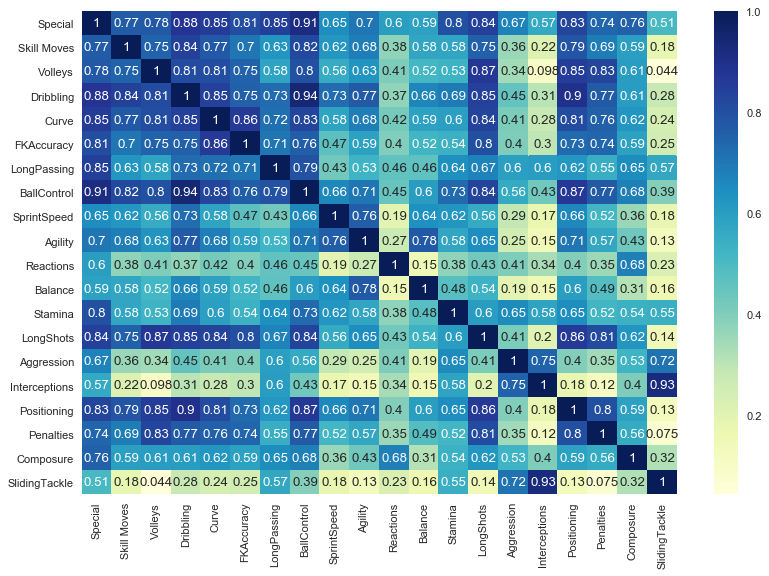

In [76]:
# Inspecting the correlation between RFE chosen features

plt.figure(figsize=(12, 8), dpi=80, facecolor='w', edgecolor='k', frameon='True')

cor = X_train_add_rfe.corr()
sns.heatmap(cor, cmap="YlGnBu", annot=True)

plt.show()

### Building model using statsmodel, for the detailed statistics

In [77]:
# Adding a constant variable 
import statsmodels.api as sm 

X_train_add_new = X_train_add_rfe

X_train_add_lm = sm.add_constant(X_train_add_new)

In [78]:
lr_add_1 = sm.OLS(y_fifa_add_train,X_train_add_lm).fit()   # Running the linear model

In [79]:
#Let's see the summary of our linear model
print(lr_add_1.summary())

                            OLS Regression Results                            
Dep. Variable:                Overall   R-squared:                       0.851
Model:                            OLS   Adj. R-squared:                  0.851
Method:                 Least Squares   F-statistic:                     3354.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:01:19   Log-Likelihood:                -5369.6
No. Observations:               11748   AIC:                         1.078e+04
Df Residuals:                   11727   BIC:                         1.094e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0022      0.004     -0.625

### Checking VIF

Variance Inflation Factor or VIF, gives a basic quantitative idea about how much the feature variables are correlated with each other. It is an extremely important parameter to test our linear model. The formula for calculating `VIF` is:

### $ VIF_i = \frac{1}{1 - {R_i}^2} $

In [80]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_add_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Special,57.31
3,Dribbling,15.79
7,BallControl,14.72
15,Interceptions,9.71
19,SlidingTackle,9.32
16,Positioning,8.41
13,LongShots,8.19
4,Curve,7.13
2,Volleys,6.56
6,LongPassing,5.24


### Dropping the Variable and Updating the Model

As you can notice some of the variable have high VIF values as well as high p-values. Such variables are insignificant and should be dropped.

In [81]:
X_train_add_new = X_train_add_new.drop('Special', axis=1)
X_train_add_new.head()

,Skill Moves,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,SprintSpeed,Agility,Reactions,Balance,Stamina,LongShots,Aggression,Interceptions,Positioning,Penalties,Composure,SlidingTackle
2264,-0.486178,0.556808,0.814617,0.898797,0.793320,1.504346,0.622547,0.629489,1.177376,1.876950,1.344868,1.174763,0.708906,1.089412,1.116661,0.657443,1.422159,0.710709,0.901250
11611,-0.486178,-0.680272,-0.924885,-1.211860,-0.913779,-1.559617,-0.392592,-1.545723,-1.321599,-1.217208,-1.333562,-0.017448,-1.515971,0.341207,0.585599,-1.333069,-0.547163,-0.161687,0.760474
12996,0.828893,-0.230425,0.392920,0.411722,0.053577,0.852439,0.264262,0.425563,0.299358,-0.996197,0.428563,0.045300,0.346717,-0.579661,-0.862751,-0.261254,0.723367,-0.336167,0.150444
1991,2.143964,1.512734,1.183603,1.602349,1.305450,0.396104,1.040545,1.717096,1.785235,0.771894,1.344868,0.484536,1.381544,0.283653,0.054537,1.014715,-0.166004,1.059667,0.338146
16044,-0.486178,-0.286656,0.129359,-0.291830,-0.230939,0.200532,-0.153736,0.833415,0.299358,-1.990748,-0.417257,-0.644927,-0.481144,-0.924986,-0.524803,0.096017,0.913947,-1.121323,-0.178034


In [82]:
import statsmodels.api as sm

X_train_add_lm = sm.add_constant(X_train_add_new)

lr_add_2 = sm.OLS(y_fifa_add_train, X_train_add_lm).fit()

lr_add_2.params

const           -0.001734
Skill Moves      0.110287
Volleys         -0.019512
Dribbling       -0.102532
Curve            0.038250
FKAccuracy      -0.020775
LongPassing      0.076603
BallControl      0.150726
SprintSpeed      0.080564
Agility          0.010623
Reactions        0.651225
Balance         -0.139831
Stamina          0.015254
LongShots        0.036581
Aggression       0.004810
Interceptions   -0.008627
Positioning     -0.197713
Penalties       -0.035929
Composure        0.261928
SlidingTackle   -0.076251
dtype: float64

In [83]:
print(lr_add_2.summary())

                            OLS Regression Results                            
Dep. Variable:                Overall   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.787
Method:                 Least Squares   F-statistic:                     2281.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:01:20   Log-Likelihood:                -7476.7
No. Observations:               11748   AIC:                         1.499e+04
Df Residuals:                   11728   BIC:                         1.514e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0017      0.004     -0.411

In [84]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
X = X_train_add_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,Dribbling,15.64
6,BallControl,14.70
14,Interceptions,9.20
18,SlidingTackle,8.70
15,Positioning,8.04
12,LongShots,7.00
3,Curve,6.60
1,Volleys,6.29
4,FKAccuracy,4.88
8,Agility,4.43


### Dropping the Variable and Updating the Model

As you can notice some of the variable have high VIF values as well as high p-values. Such variables are insignificant and should be dropped.

In [85]:
X_train_add_new = X_train_add_new.drop('Aggression', axis=1)
X_train_add_new.head()

,Skill Moves,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,SprintSpeed,Agility,Reactions,Balance,Stamina,LongShots,Interceptions,Positioning,Penalties,Composure,SlidingTackle
2264,-0.486178,0.556808,0.814617,0.898797,0.793320,1.504346,0.622547,0.629489,1.177376,1.876950,1.344868,1.174763,0.708906,1.116661,0.657443,1.422159,0.710709,0.901250
11611,-0.486178,-0.680272,-0.924885,-1.211860,-0.913779,-1.559617,-0.392592,-1.545723,-1.321599,-1.217208,-1.333562,-0.017448,-1.515971,0.585599,-1.333069,-0.547163,-0.161687,0.760474
12996,0.828893,-0.230425,0.392920,0.411722,0.053577,0.852439,0.264262,0.425563,0.299358,-0.996197,0.428563,0.045300,0.346717,-0.862751,-0.261254,0.723367,-0.336167,0.150444
1991,2.143964,1.512734,1.183603,1.602349,1.305450,0.396104,1.040545,1.717096,1.785235,0.771894,1.344868,0.484536,1.381544,0.054537,1.014715,-0.166004,1.059667,0.338146
16044,-0.486178,-0.286656,0.129359,-0.291830,-0.230939,0.200532,-0.153736,0.833415,0.299358,-1.990748,-0.417257,-0.644927,-0.481144,-0.524803,0.096017,0.913947,-1.121323,-0.178034


In [86]:
import statsmodels.api as sm

X_train_add_lm = sm.add_constant(X_train_add_new)

lr_add_3 = sm.OLS(y_fifa_add_train, X_train_add_lm).fit()

lr_add_3.params

const           -0.001710
Skill Moves      0.110038
Volleys         -0.018943
Dribbling       -0.102995
Curve            0.037892
FKAccuracy      -0.020894
LongPassing      0.076335
BallControl      0.151500
SprintSpeed      0.080524
Agility          0.010380
Reactions        0.651374
Balance         -0.140242
Stamina          0.016216
LongShots        0.036870
Interceptions   -0.007138
Positioning     -0.197323
Penalties       -0.035623
Composure        0.262470
SlidingTackle   -0.074821
dtype: float64

In [87]:
print(lr_add_3.summary())

                            OLS Regression Results                            
Dep. Variable:                Overall   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.787
Method:                 Least Squares   F-statistic:                     2407.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:01:20   Log-Likelihood:                -7476.9
No. Observations:               11748   AIC:                         1.499e+04
Df Residuals:                   11729   BIC:                         1.513e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0017      0.004     -0.405

In [88]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
X = X_train_add_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,Dribbling,15.61
6,BallControl,14.62
13,Interceptions,8.89
17,SlidingTackle,8.42
14,Positioning,8.02
12,LongShots,6.98
3,Curve,6.58
1,Volleys,6.24
4,FKAccuracy,4.87
8,Agility,4.42


### Dropping the Variable and Updating the Model

As you can notice some of the variable have high VIF values as well as high p-values. Such variables are insignificant and should be dropped.

In [89]:
X_train_add_new = X_train_add_new.drop('Interceptions', axis=1)
X_train_add_new.head()

,Skill Moves,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,SprintSpeed,Agility,Reactions,Balance,Stamina,LongShots,Positioning,Penalties,Composure,SlidingTackle
2264,-0.486178,0.556808,0.814617,0.898797,0.793320,1.504346,0.622547,0.629489,1.177376,1.876950,1.344868,1.174763,0.708906,0.657443,1.422159,0.710709,0.901250
11611,-0.486178,-0.680272,-0.924885,-1.211860,-0.913779,-1.559617,-0.392592,-1.545723,-1.321599,-1.217208,-1.333562,-0.017448,-1.515971,-1.333069,-0.547163,-0.161687,0.760474
12996,0.828893,-0.230425,0.392920,0.411722,0.053577,0.852439,0.264262,0.425563,0.299358,-0.996197,0.428563,0.045300,0.346717,-0.261254,0.723367,-0.336167,0.150444
1991,2.143964,1.512734,1.183603,1.602349,1.305450,0.396104,1.040545,1.717096,1.785235,0.771894,1.344868,0.484536,1.381544,1.014715,-0.166004,1.059667,0.338146
16044,-0.486178,-0.286656,0.129359,-0.291830,-0.230939,0.200532,-0.153736,0.833415,0.299358,-1.990748,-0.417257,-0.644927,-0.481144,0.096017,0.913947,-1.121323,-0.178034


In [90]:
import statsmodels.api as sm

X_train_add_lm = sm.add_constant(X_train_add_new)

lr_add_4 = sm.OLS(y_fifa_add_train, X_train_add_lm).fit()

lr_add_4.params

const           -0.001722
Skill Moves      0.110191
Volleys         -0.018645
Dribbling       -0.102283
Curve            0.037936
FKAccuracy      -0.021089
LongPassing      0.075837
BallControl      0.150906
SprintSpeed      0.080870
Agility          0.010405
Reactions        0.650740
Balance         -0.140164
Stamina          0.015328
LongShots        0.036718
Positioning     -0.197355
Penalties       -0.035401
Composure        0.262290
SlidingTackle   -0.080494
dtype: float64

In [91]:
print(lr_add_4.summary())

                            OLS Regression Results                            
Dep. Variable:                Overall   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.787
Method:                 Least Squares   F-statistic:                     2549.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:01:21   Log-Likelihood:                -7477.0
No. Observations:               11748   AIC:                         1.499e+04
Df Residuals:                   11730   BIC:                         1.512e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0017      0.004     -0.408

In [92]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
X = X_train_add_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,Dribbling,15.53
6,BallControl,14.56
13,Positioning,8.02
12,LongShots,6.98
3,Curve,6.58
1,Volleys,6.22
4,FKAccuracy,4.87
8,Agility,4.42
5,LongPassing,4.35
14,Penalties,4.18


### Dropping the Variable and Updating the Model

As you can notice some of the variable have high VIF values as well as high p-values. Such variables are insignificant and should be dropped.

In [93]:
X_train_add_new = X_train_add_new.drop('Agility', axis=1)
X_train_add_new.head()

,Skill Moves,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,SprintSpeed,Reactions,Balance,Stamina,LongShots,Positioning,Penalties,Composure,SlidingTackle
2264,-0.486178,0.556808,0.814617,0.898797,0.793320,1.504346,0.622547,0.629489,1.876950,1.344868,1.174763,0.708906,0.657443,1.422159,0.710709,0.901250
11611,-0.486178,-0.680272,-0.924885,-1.211860,-0.913779,-1.559617,-0.392592,-1.545723,-1.217208,-1.333562,-0.017448,-1.515971,-1.333069,-0.547163,-0.161687,0.760474
12996,0.828893,-0.230425,0.392920,0.411722,0.053577,0.852439,0.264262,0.425563,-0.996197,0.428563,0.045300,0.346717,-0.261254,0.723367,-0.336167,0.150444
1991,2.143964,1.512734,1.183603,1.602349,1.305450,0.396104,1.040545,1.717096,0.771894,1.344868,0.484536,1.381544,1.014715,-0.166004,1.059667,0.338146
16044,-0.486178,-0.286656,0.129359,-0.291830,-0.230939,0.200532,-0.153736,0.833415,-1.990748,-0.417257,-0.644927,-0.481144,0.096017,0.913947,-1.121323,-0.178034


In [94]:
import statsmodels.api as sm

X_train_add_lm = sm.add_constant(X_train_add_new)

lr_add_5 = sm.OLS(y_fifa_add_train, X_train_add_lm).fit()

lr_add_5.params

const           -0.001733
Skill Moves      0.110679
Volleys         -0.018863
Dribbling       -0.100294
Curve            0.038884
FKAccuracy      -0.020807
LongPassing      0.076384
BallControl      0.150937
SprintSpeed      0.084027
Reactions        0.651133
Balance         -0.136261
Stamina          0.016046
LongShots        0.036718
Positioning     -0.197467
Penalties       -0.036289
Composure        0.262360
SlidingTackle   -0.082045
dtype: float64

In [95]:
print(lr_add_5.summary())

                            OLS Regression Results                            
Dep. Variable:                Overall   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.787
Method:                 Least Squares   F-statistic:                     2708.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:01:22   Log-Likelihood:                -7477.7
No. Observations:               11748   AIC:                         1.499e+04
Df Residuals:                   11731   BIC:                         1.511e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0017      0.004     -0.410

In [96]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
X = X_train_add_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,Dribbling,15.36
6,BallControl,14.56
12,Positioning,8.02
11,LongShots,6.98
3,Curve,6.55
1,Volleys,6.22
4,FKAccuracy,4.86
5,LongPassing,4.34
13,Penalties,4.15
0,Skill Moves,3.86


### Dropping the Variable and Updating the Model

As you can notice some of the variable have high VIF values as well as high p-values. Such variables are insignificant and should be dropped.

In [97]:
X_train_add_new = X_train_add_new.drop('Volleys', axis=1)
X_train_add_new.head()

,Skill Moves,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,SprintSpeed,Reactions,Balance,Stamina,LongShots,Positioning,Penalties,Composure,SlidingTackle
2264,-0.486178,0.814617,0.898797,0.793320,1.504346,0.622547,0.629489,1.876950,1.344868,1.174763,0.708906,0.657443,1.422159,0.710709,0.901250
11611,-0.486178,-0.924885,-1.211860,-0.913779,-1.559617,-0.392592,-1.545723,-1.217208,-1.333562,-0.017448,-1.515971,-1.333069,-0.547163,-0.161687,0.760474
12996,0.828893,0.392920,0.411722,0.053577,0.852439,0.264262,0.425563,-0.996197,0.428563,0.045300,0.346717,-0.261254,0.723367,-0.336167,0.150444
1991,2.143964,1.183603,1.602349,1.305450,0.396104,1.040545,1.717096,0.771894,1.344868,0.484536,1.381544,1.014715,-0.166004,1.059667,0.338146
16044,-0.486178,0.129359,-0.291830,-0.230939,0.200532,-0.153736,0.833415,-1.990748,-0.417257,-0.644927,-0.481144,0.096017,0.913947,-1.121323,-0.178034


In [98]:
import statsmodels.api as sm

X_train_add_lm = sm.add_constant(X_train_add_new)

lr_add_6 = sm.OLS(y_fifa_add_train, X_train_add_lm).fit()

lr_add_6.params

const           -0.001778
Skill Moves      0.109778
Dribbling       -0.100665
Curve            0.036288
FKAccuracy      -0.021155
LongPassing      0.077356
BallControl      0.149095
SprintSpeed      0.083988
Reactions        0.650965
Balance         -0.135887
Stamina          0.016542
LongShots        0.031039
Positioning     -0.201045
Penalties       -0.040330
Composure        0.261125
SlidingTackle   -0.080023
dtype: float64

In [99]:
print(lr_add_6.summary())

                            OLS Regression Results                            
Dep. Variable:                Overall   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.787
Method:                 Least Squares   F-statistic:                     2888.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:01:23   Log-Likelihood:                -7479.4
No. Observations:               11748   AIC:                         1.499e+04
Df Residuals:                   11732   BIC:                         1.511e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0018      0.004     -0.421

In [100]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
X = X_train_add_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Dribbling,15.36
5,BallControl,14.50
11,Positioning,7.80
2,Curve,6.43
10,LongShots,6.42
3,FKAccuracy,4.86
4,LongPassing,4.33
12,Penalties,3.87
0,Skill Moves,3.84
9,Stamina,3.23


### Dropping the Variable and Updating the Model

As you can notice some of the variable have high VIF values as well as high p-values. Such variables are insignificant and should be dropped.

In [101]:
X_train_add_new = X_train_add_new.drop('Dribbling', axis=1)
X_train_add_new.head()

,Skill Moves,Curve,FKAccuracy,LongPassing,BallControl,SprintSpeed,Reactions,Balance,Stamina,LongShots,Positioning,Penalties,Composure,SlidingTackle
2264,-0.486178,0.898797,0.793320,1.504346,0.622547,0.629489,1.876950,1.344868,1.174763,0.708906,0.657443,1.422159,0.710709,0.901250
11611,-0.486178,-1.211860,-0.913779,-1.559617,-0.392592,-1.545723,-1.217208,-1.333562,-0.017448,-1.515971,-1.333069,-0.547163,-0.161687,0.760474
12996,0.828893,0.411722,0.053577,0.852439,0.264262,0.425563,-0.996197,0.428563,0.045300,0.346717,-0.261254,0.723367,-0.336167,0.150444
1991,2.143964,1.602349,1.305450,0.396104,1.040545,1.717096,0.771894,1.344868,0.484536,1.381544,1.014715,-0.166004,1.059667,0.338146
16044,-0.486178,-0.291830,-0.230939,0.200532,-0.153736,0.833415,-1.990748,-0.417257,-0.644927,-0.481144,0.096017,0.913947,-1.121323,-0.178034


In [102]:
import statsmodels.api as sm

X_train_add_lm = sm.add_constant(X_train_add_new)

lr_add_7 = sm.OLS(y_fifa_add_train, X_train_add_lm).fit()

lr_add_7.params

const           -0.001728
Skill Moves      0.099229
Curve            0.027832
FKAccuracy      -0.018896
LongPassing      0.072763
BallControl      0.097641
SprintSpeed      0.073165
Reactions        0.654227
Balance         -0.141117
Stamina          0.018848
LongShots        0.025592
Positioning     -0.222061
Penalties       -0.038880
Composure        0.265257
SlidingTackle   -0.079320
dtype: float64

In [103]:
print(lr_add_7.summary())

                            OLS Regression Results                            
Dep. Variable:                Overall   R-squared:                       0.786
Model:                            OLS   Adj. R-squared:                  0.786
Method:                 Least Squares   F-statistic:                     3082.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:01:24   Log-Likelihood:                -7497.9
No. Observations:               11748   AIC:                         1.503e+04
Df Residuals:                   11733   BIC:                         1.514e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0017      0.004     -0.409

In [104]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
X = X_train_add_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,BallControl,10.49
10,Positioning,7.13
9,LongShots,6.38
1,Curve,6.32
2,FKAccuracy,4.85
3,LongPassing,4.29
11,Penalties,3.86
0,Skill Moves,3.68
8,Stamina,3.23
12,Composure,3.01


### Dropping the Variable and Updating the Model

As you can notice some of the variable have high VIF values as well as high p-values. Such variables are insignificant and should be dropped.

In [105]:
X_train_add_new = X_train_add_new.drop('BallControl', axis=1)
X_train_add_new.head()

,Skill Moves,Curve,FKAccuracy,LongPassing,SprintSpeed,Reactions,Balance,Stamina,LongShots,Positioning,Penalties,Composure,SlidingTackle
2264,-0.486178,0.898797,0.793320,1.504346,0.629489,1.876950,1.344868,1.174763,0.708906,0.657443,1.422159,0.710709,0.901250
11611,-0.486178,-1.211860,-0.913779,-1.559617,-1.545723,-1.217208,-1.333562,-0.017448,-1.515971,-1.333069,-0.547163,-0.161687,0.760474
12996,0.828893,0.411722,0.053577,0.852439,0.425563,-0.996197,0.428563,0.045300,0.346717,-0.261254,0.723367,-0.336167,0.150444
1991,2.143964,1.602349,1.305450,0.396104,1.717096,0.771894,1.344868,0.484536,1.381544,1.014715,-0.166004,1.059667,0.338146
16044,-0.486178,-0.291830,-0.230939,0.200532,0.833415,-1.990748,-0.417257,-0.644927,-0.481144,0.096017,0.913947,-1.121323,-0.178034


In [106]:
import statsmodels.api as sm

X_train_add_lm = sm.add_constant(X_train_add_new)

lr_add_8 = sm.OLS(y_fifa_add_train, X_train_add_lm).fit()

lr_add_8.params

const           -0.001831
Skill Moves      0.116170
Curve            0.033235
FKAccuracy      -0.025441
LongPassing      0.091912
SprintSpeed      0.080858
Reactions        0.653037
Balance         -0.139037
Stamina          0.022619
LongShots        0.035635
Positioning     -0.195080
Penalties       -0.026049
Composure        0.271511
SlidingTackle   -0.065938
dtype: float64

In [107]:
print(lr_add_8.summary())

                            OLS Regression Results                            
Dep. Variable:                Overall   R-squared:                       0.785
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     3301.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:01:25   Log-Likelihood:                -7523.4
No. Observations:               11748   AIC:                         1.507e+04
Df Residuals:                   11734   BIC:                         1.518e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0018      0.004     -0.432

In [108]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
X = X_train_add_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,Positioning,6.32
1,Curve,6.29
8,LongShots,6.26
2,FKAccuracy,4.81
3,LongPassing,3.89
10,Penalties,3.68
0,Skill Moves,3.36
7,Stamina,3.21
11,Composure,2.96
4,SprintSpeed,2.60


### Dropping the Variable and Updating the Model

As you can notice some of the variable have high VIF values as well as high p-values. Such variables are insignificant and should be dropped.

In [109]:
X_train_add_new = X_train_add_new.drop('Curve', axis=1)
X_train_add_new.head()

,Skill Moves,FKAccuracy,LongPassing,SprintSpeed,Reactions,Balance,Stamina,LongShots,Positioning,Penalties,Composure,SlidingTackle
2264,-0.486178,0.793320,1.504346,0.629489,1.876950,1.344868,1.174763,0.708906,0.657443,1.422159,0.710709,0.901250
11611,-0.486178,-0.913779,-1.559617,-1.545723,-1.217208,-1.333562,-0.017448,-1.515971,-1.333069,-0.547163,-0.161687,0.760474
12996,0.828893,0.053577,0.852439,0.425563,-0.996197,0.428563,0.045300,0.346717,-0.261254,0.723367,-0.336167,0.150444
1991,2.143964,1.305450,0.396104,1.717096,0.771894,1.344868,0.484536,1.381544,1.014715,-0.166004,1.059667,0.338146
16044,-0.486178,-0.230939,0.200532,0.833415,-1.990748,-0.417257,-0.644927,-0.481144,0.096017,0.913947,-1.121323,-0.178034


In [110]:
import statsmodels.api as sm

X_train_add_lm = sm.add_constant(X_train_add_new)

lr_add_9 = sm.OLS(y_fifa_add_train, X_train_add_lm).fit()

lr_add_9.params

const           -0.001705
Skill Moves      0.119693
FKAccuracy      -0.011623
LongPassing      0.095268
SprintSpeed      0.082679
Reactions        0.653123
Balance         -0.137128
Stamina          0.021471
LongShots        0.039880
Positioning     -0.189719
Penalties       -0.025332
Composure        0.272821
SlidingTackle   -0.065822
dtype: float64

In [111]:
print(lr_add_9.summary())

                            OLS Regression Results                            
Dep. Variable:                Overall   R-squared:                       0.785
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     3573.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:01:25   Log-Likelihood:                -7528.2
No. Observations:               11748   AIC:                         1.508e+04
Df Residuals:                   11735   BIC:                         1.518e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0017      0.004     -0.402

In [112]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
X = X_train_add_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,LongShots,6.16
8,Positioning,6.16
2,LongPassing,3.83
1,FKAccuracy,3.72
9,Penalties,3.68
0,Skill Moves,3.29
6,Stamina,3.20
10,Composure,2.95
3,SprintSpeed,2.58
11,SlidingTackle,2.41


### Dropping the Variable and Updating the Model

As you can notice some of the variable have high VIF values as well as high p-values. Such variables are insignificant and should be dropped.

In [113]:
X_train_add_new = X_train_add_new.drop('FKAccuracy', axis=1)
X_train_add_new.head()

,Skill Moves,LongPassing,SprintSpeed,Reactions,Balance,Stamina,LongShots,Positioning,Penalties,Composure,SlidingTackle
2264,-0.486178,1.504346,0.629489,1.876950,1.344868,1.174763,0.708906,0.657443,1.422159,0.710709,0.901250
11611,-0.486178,-1.559617,-1.545723,-1.217208,-1.333562,-0.017448,-1.515971,-1.333069,-0.547163,-0.161687,0.760474
12996,0.828893,0.852439,0.425563,-0.996197,0.428563,0.045300,0.346717,-0.261254,0.723367,-0.336167,0.150444
1991,2.143964,0.396104,1.717096,0.771894,1.344868,0.484536,1.381544,1.014715,-0.166004,1.059667,0.338146
16044,-0.486178,0.200532,0.833415,-1.990748,-0.417257,-0.644927,-0.481144,0.096017,0.913947,-1.121323,-0.178034


In [114]:
import statsmodels.api as sm

X_train_add_lm = sm.add_constant(X_train_add_new)

lr_add_10 = sm.OLS(y_fifa_add_train, X_train_add_lm).fit()

lr_add_10.params

const           -0.001691
Skill Moves      0.118302
LongPassing      0.092396
SprintSpeed      0.083548
Reactions        0.652986
Balance         -0.138239
Stamina          0.022210
LongShots        0.035442
Positioning     -0.189510
Penalties       -0.028130
Composure        0.272762
SlidingTackle   -0.066363
dtype: float64

In [115]:
print(lr_add_10.summary())

                            OLS Regression Results                            
Dep. Variable:                Overall   R-squared:                       0.785
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     3897.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:01:26   Log-Likelihood:                -7529.2
No. Observations:               11748   AIC:                         1.508e+04
Df Residuals:                   11736   BIC:                         1.517e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0017      0.004     -0.399

In [116]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
X = X_train_add_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,Positioning,6.15
6,LongShots,5.62
1,LongPassing,3.60
8,Penalties,3.46
0,Skill Moves,3.24
5,Stamina,3.19
9,Composure,2.95
2,SprintSpeed,2.56
10,SlidingTackle,2.41
4,Balance,1.99


### Dropping the Variable and Updating the Model

As you can notice some of the variable have high VIF values as well as high p-values. Such variables are insignificant and should be dropped.

In [117]:
X_train_add_new = X_train_add_new.drop('Positioning', axis=1)
X_train_add_new.head()

,Skill Moves,LongPassing,SprintSpeed,Reactions,Balance,Stamina,LongShots,Penalties,Composure,SlidingTackle
2264,-0.486178,1.504346,0.629489,1.876950,1.344868,1.174763,0.708906,1.422159,0.710709,0.901250
11611,-0.486178,-1.559617,-1.545723,-1.217208,-1.333562,-0.017448,-1.515971,-0.547163,-0.161687,0.760474
12996,0.828893,0.852439,0.425563,-0.996197,0.428563,0.045300,0.346717,0.723367,-0.336167,0.150444
1991,2.143964,0.396104,1.717096,0.771894,1.344868,0.484536,1.381544,-0.166004,1.059667,0.338146
16044,-0.486178,0.200532,0.833415,-1.990748,-0.417257,-0.644927,-0.481144,0.913947,-1.121323,-0.178034


In [118]:
import statsmodels.api as sm

X_train_add_lm = sm.add_constant(X_train_add_new)

lr_add_11 = sm.OLS(y_fifa_add_train, X_train_add_lm).fit()

lr_add_11.params

const           -0.000628
Skill Moves      0.087958
LongPassing      0.086924
SprintSpeed      0.060783
Reactions        0.649514
Balance         -0.148613
Stamina         -0.005316
LongShots       -0.035084
Penalties       -0.067146
Composure        0.270123
SlidingTackle   -0.046962
dtype: float64

In [119]:
print(lr_add_11.summary())

                            OLS Regression Results                            
Dep. Variable:                Overall   R-squared:                       0.779
Model:                            OLS   Adj. R-squared:                  0.779
Method:                 Least Squares   F-statistic:                     4139.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:01:27   Log-Likelihood:                -7690.6
No. Observations:               11748   AIC:                         1.540e+04
Df Residuals:                   11737   BIC:                         1.548e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0006      0.004     -0.146

In [120]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
X = X_train_add_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,LongShots,4.77
1,LongPassing,3.60
7,Penalties,3.20
0,Skill Moves,3.08
5,Stamina,3.06
8,Composure,2.95
2,SprintSpeed,2.47
9,SlidingTackle,2.34
4,Balance,1.97
3,Reactions,1.92


### Dropping the Variable and Updating the Model

As you can notice some of the variable have high VIF values as well as high p-values. Such variables are insignificant and should be dropped.

In [121]:
X_train_add_new = X_train_add_new.drop('Stamina', axis=1)
X_train_add_new.head()

,Skill Moves,LongPassing,SprintSpeed,Reactions,Balance,LongShots,Penalties,Composure,SlidingTackle
2264,-0.486178,1.504346,0.629489,1.876950,1.344868,0.708906,1.422159,0.710709,0.901250
11611,-0.486178,-1.559617,-1.545723,-1.217208,-1.333562,-1.515971,-0.547163,-0.161687,0.760474
12996,0.828893,0.852439,0.425563,-0.996197,0.428563,0.346717,0.723367,-0.336167,0.150444
1991,2.143964,0.396104,1.717096,0.771894,1.344868,1.381544,-0.166004,1.059667,0.338146
16044,-0.486178,0.200532,0.833415,-1.990748,-0.417257,-0.481144,0.913947,-1.121323,-0.178034


In [122]:
import statsmodels.api as sm

X_train_add_lm = sm.add_constant(X_train_add_new)

lr_add_12 = sm.OLS(y_fifa_add_train, X_train_add_lm).fit()

lr_add_12.params

const           -0.000636
Skill Moves      0.087918
LongPassing      0.086932
SprintSpeed      0.058935
Reactions        0.649234
Balance         -0.148662
LongShots       -0.036323
Penalties       -0.067470
Composure        0.269812
SlidingTackle   -0.049172
dtype: float64

In [123]:
print(lr_add_12.summary())

                            OLS Regression Results                            
Dep. Variable:                Overall   R-squared:                       0.779
Model:                            OLS   Adj. R-squared:                  0.779
Method:                 Least Squares   F-statistic:                     4599.
Date:                Fri, 01 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:01:27   Log-Likelihood:                -7690.8
No. Observations:               11748   AIC:                         1.540e+04
Df Residuals:                   11738   BIC:                         1.548e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0006      0.004     -0.148

In [124]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
X = X_train_add_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,LongShots,4.60
1,LongPassing,3.60
6,Penalties,3.19
0,Skill Moves,3.08
7,Composure,2.94
2,SprintSpeed,2.10
4,Balance,1.97
3,Reactions,1.91
8,SlidingTackle,1.82


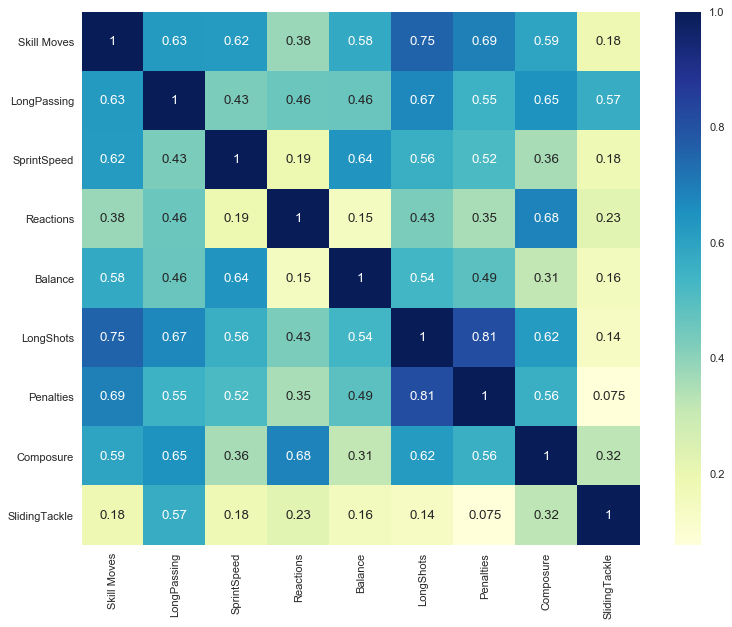

In [125]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 8), dpi=80, facecolor='w', edgecolor='k', frameon='True')

cor = X_train_add_new.corr()
sns.heatmap(cor, annot=True, cmap="YlGnBu")

plt.tight_layout()
plt.show()

### Making Predictions Using the Final Model

Now that we have fitted the model and checked the normality of error terms, it's time to go ahead and make predictions using the final, i.e. eleventh model.

In [126]:
# Dicing the X_test dataframe with only the columns that were cosen by our model
X_fifa_add_test = X_fifa_add_test[['Skill Moves','LongPassing','SprintSpeed','Reactions','Balance','LongShots','Penalties', \
                                   'Composure','SlidingTackle']]
X_fifa_add_test.head()

,Skill Moves,LongPassing,SprintSpeed,Reactions,Balance,LongShots,Penalties,Composure,SlidingTackle
1400,2.143964,0.722058,0.493538,1.103411,1.415353,1.174578,1.231579,1.234146,-0.553437
127,-0.486178,1.178392,0.289612,1.987456,-0.346772,0.657165,-0.483636,2.019303,1.745907
17138,-1.801250,-2.276714,-2.293453,-2.101253,-2.179382,-2.033385,-2.262379,-3.302313,-1.585795
7789,0.828893,1.048011,0.017711,-0.333163,0.710503,0.450200,0.723367,-0.336167,-1.304243
8830,0.828893,0.917630,0.221637,0.550882,0.851473,1.071096,0.278682,-0.597885,-0.741138


In [127]:
# Adding constant variable to test dataframe
X_test_add_m12 = sm.add_constant(X_fifa_add_test)
X_test_add_m12.head()

,const,Skill Moves,LongPassing,SprintSpeed,Reactions,Balance,LongShots,Penalties,Composure,SlidingTackle
1400,1.0,2.143964,0.722058,0.493538,1.103411,1.415353,1.174578,1.231579,1.234146,-0.553437
127,1.0,-0.486178,1.178392,0.289612,1.987456,-0.346772,0.657165,-0.483636,2.019303,1.745907
17138,1.0,-1.801250,-2.276714,-2.293453,-2.101253,-2.179382,-2.033385,-2.262379,-3.302313,-1.585795
7789,1.0,0.828893,1.048011,0.017711,-0.333163,0.710503,0.450200,0.723367,-0.336167,-1.304243
8830,1.0,0.828893,0.917630,0.221637,0.550882,0.851473,1.071096,0.278682,-0.597885,-0.741138


In [128]:
# Making predictions using the eleventh model

y_add_pred_m12 = lr_add_12.predict(X_test_add_m12)

## Step 9: Model Evaluation

#### Plotting the actual and predicted price values from the test dataset so check the likeness

Text(0,0.5,'Views')

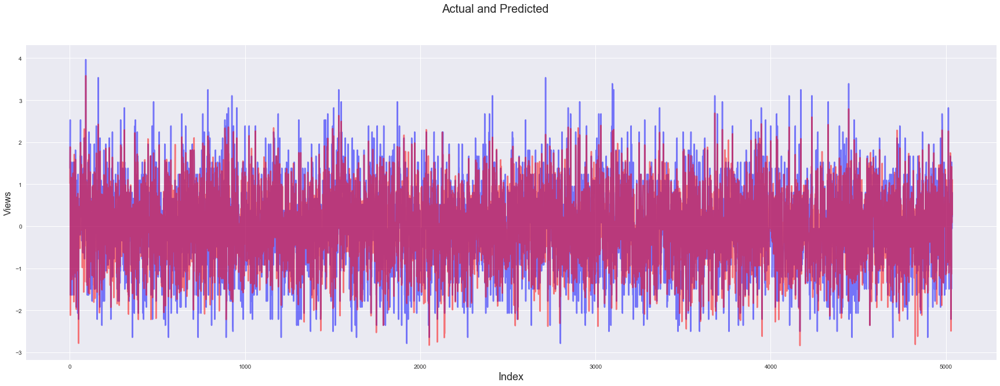

In [129]:
#Actual vs Predicted
c = [i for i in range(1,5037,1)]
fig = plt.figure(figsize=(30,10))
plt.plot(c,y_fifa_add_test, color="blue", alpha = 0.5, linewidth=2.5, linestyle="-")
plt.plot(c,y_add_pred_m12, color="red",  alpha = 0.5, linewidth=2.5, linestyle="-")
fig.suptitle('Actual and Predicted', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                               # X-label
plt.ylabel('Views', fontsize=16)                               # Y-label

#### Drawing a scatter plot with actual and predicted price values from the test dataset to check the spread

Text(0,0.5,'y_pred')

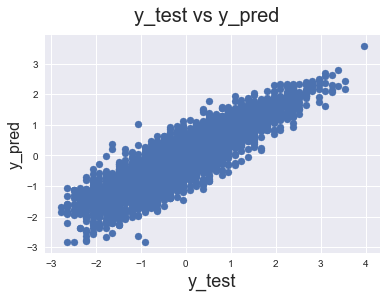

In [130]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_fifa_add_test,y_add_pred_m12)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

#### Drawing a scatter plot of the error terms to check the spread to ensure that the error terms have constant variance (homoscedasticity). The variance doesn't increase (or decrease) or follow a pattern as the error values change.

Text(0,0.5,'ytest-ypred')

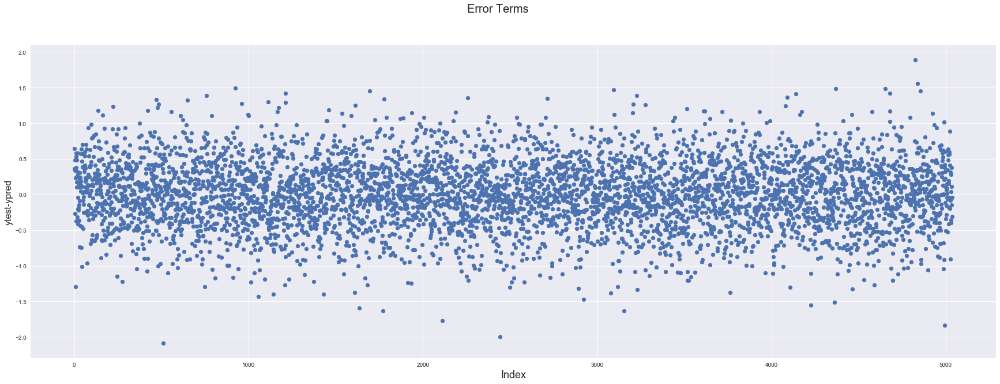

In [131]:
# Error terms
fig = plt.figure(figsize=(30,10))
c = [i for i in range(1,5037,1)]
plt.scatter(c,y_fifa_add_test - y_add_pred_m12)

fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                      # X-label
plt.ylabel('ytest-ypred', fontsize=16)                # Y-label

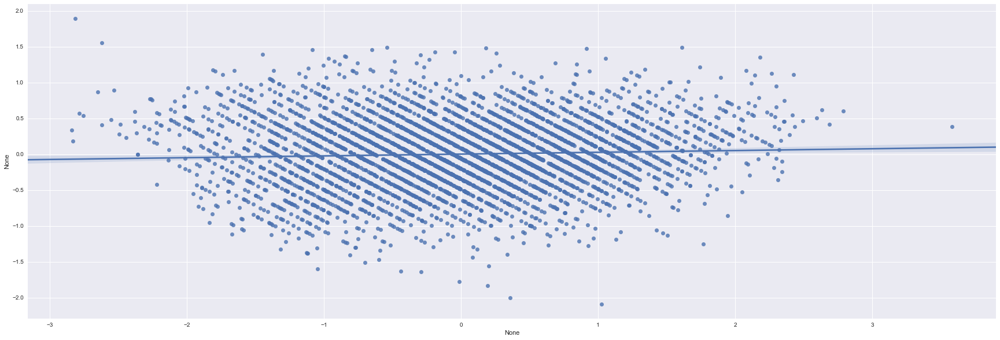

In [132]:
fig = plt.figure(figsize=(30,10))
sns.regplot(y_add_pred_m12, (y_fifa_add_test - y_add_pred_m12))
plt.show()

#### Plotting the distribution of the error terms

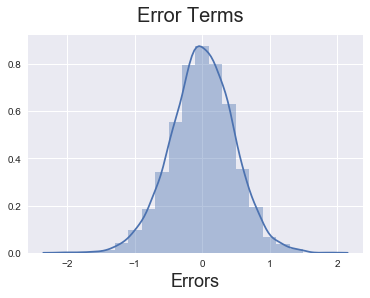

In [133]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_fifa_add_test-y_add_pred_m12), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label
plt.show()

#### Plotting a line for the scatter plot including actual and predicted prices from test dataset. Overall we have a pretty linear spread

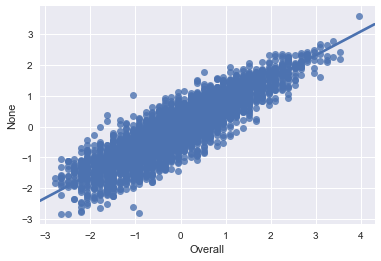

In [134]:
sns.regplot(y_fifa_add_test, y_add_pred_m12)
plt.show()

#### Testing the r2 score and mse score of the model on the test dataset

In [135]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

print('R2 Score: {}'.format(r2_score(y_fifa_add_test, y_add_pred_m12)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_fifa_add_test, y_add_pred_m12)))

R2 Score: 0.7911028685786146
Mean Squared Error: 0.21788717755075132


## Building Linear Regression model using K-fold Cross Validation

*We will use GridSearchCV method and 5 fold cross validation method for our linear regression.*

In [136]:
y_fifa_lr = fifa_org_df.pop('Overall')
X_fifa_lr = fifa_org_df

In [137]:
# Make cross validated predictions
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

lr_model_cv = LinearRegression().fit(X_fifa_lr, y_fifa_lr)
lr_predictions_cv = cross_val_predict(lr_model_cv, X_fifa_lr, y_fifa_lr, cv=10)
accuracy = metrics.r2_score(y_fifa_lr, lr_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_fifa_lr, lr_predictions_cv)))

Cross-Predicted Accuracy: 0.8819695081315111
Mean Squared Error: 0.11803049186848887


## Step 9: Cross Validation Model Evaluation

Text(0,0.5,'Views')

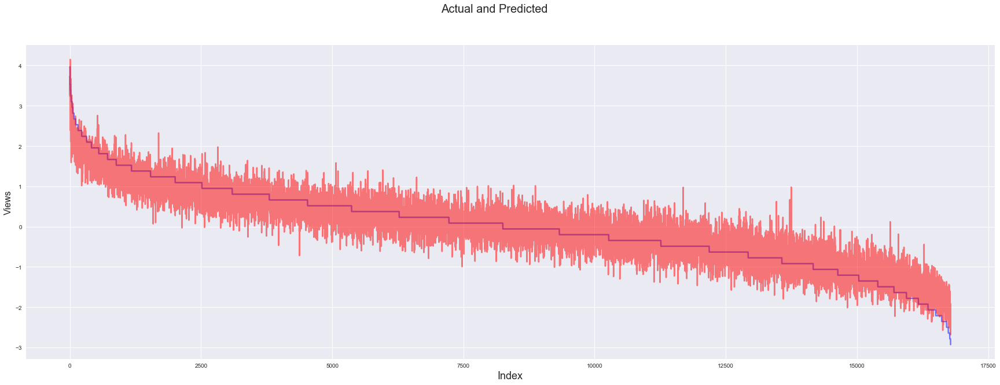

In [138]:
#Actual vs Predicted
c = [i for i in range(1,16785,1)]
fig = plt.figure(figsize=(30,10))
plt.plot(c,y_fifa_lr, color="blue", alpha = 0.5, linewidth=2.5, linestyle="-")
plt.plot(c,lr_predictions_cv, color="red",  alpha = 0.5, linewidth=2.5, linestyle="-")
fig.suptitle('Actual and Predicted', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                               # X-label
plt.ylabel('Views', fontsize=16)                               # Y-label

#### Drawing a scatter plot with actual and predicted price values from the test dataset to check the spread

Text(0,0.5,'y_pred')

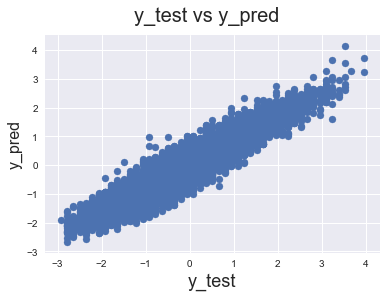

In [139]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_fifa_lr,lr_predictions_cv)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

#### Drawing a scatter plot of the error terms to check the spread to ensure that the error terms have constant variance (homoscedasticity). The variance doesn't increase (or decrease) or follow a pattern as the error values change.

Text(0,0.5,'ytest-ypred')

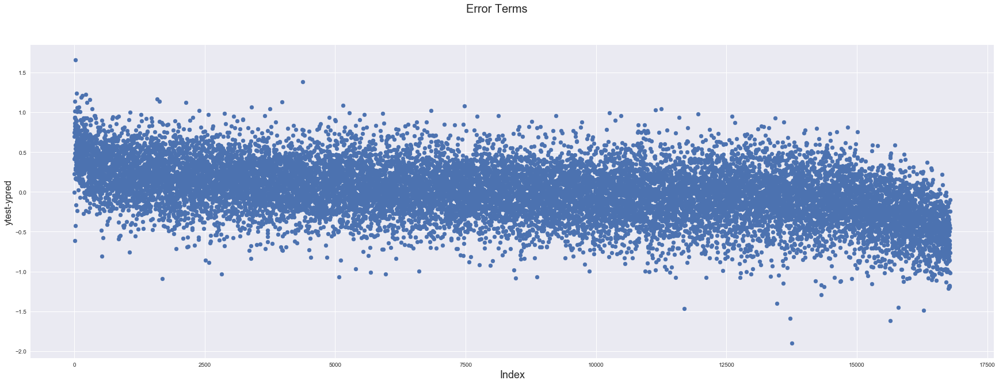

In [140]:
# Error terms
fig = plt.figure(figsize=(30,10))
c = [i for i in range(1,16785,1)]
plt.scatter(c,y_fifa_lr - lr_predictions_cv)

fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                      # X-label
plt.ylabel('ytest-ypred', fontsize=16)                # Y-label

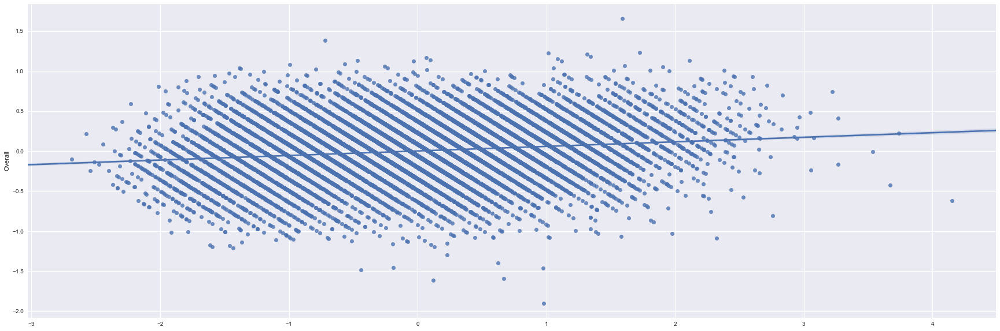

In [141]:
fig = plt.figure(figsize=(30,10))
sns.regplot(lr_predictions_cv, (y_fifa_lr - lr_predictions_cv))
plt.show()

#### Plotting the distribution of the error terms

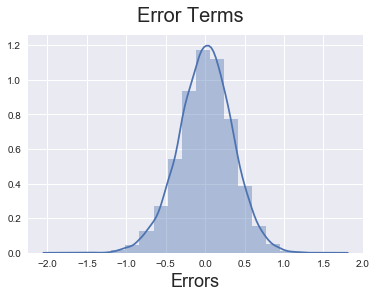

In [142]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_fifa_lr-lr_predictions_cv), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label
plt.show()

#### Plotting a line for the scatter plot including actual and predicted prices from test dataset. Overall we have a pretty linear spread

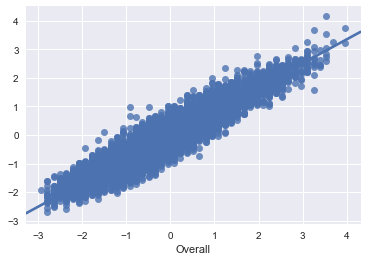

In [143]:
sns.regplot(y_fifa_lr, lr_predictions_cv)
plt.show()

## Lasso Regression

### Making a copy of original dataframes

In [144]:
fifa_rlr_df = fifa_df.copy()
print(fifa_rlr_df.shape)
print(fifa_df.shape)

(16784, 97)
(16784, 97)


### Dropping columns that won't be considered for prediction purpose

In [145]:
columns_to_drop = ['Name','Age', 'Potential', 'Nationality', 'Club', 'Jersey Number','Joined', 'Contract Valid Until', 'Wage_in_Th', 'Value_in_M', \
                   'Release_Clause_in_M']

fifa_rlr_df = fifa_rlr_df.drop(columns_to_drop, axis=1)
fifa_rlr_df.head()

,Good_Yrs_left,Overall,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
0,4,94,2202,5.0,4.0,4.0,2.890372,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,2,94,2228,5.0,4.0,5.0,1.609438,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,9,92,2143,5.0,5.0,5.0,1.791759,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,8,91,1471,4.0,3.0,1.0,2.302585,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,8,91,2281,4.0,5.0,4.0,2.197225,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


### Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

In [146]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

fifa_rlr_df[fifa_rlr_df.columns]=scaler.fit_transform(fifa_rlr_df[fifa_rlr_df.columns])

fifa_rlr_df.head()

,Good_Yrs_left,Overall,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
0,-1.250092,3.965985,2.187257,9.592527,1.579639,2.143964,2.652931,1.849048,2.519018,1.009769,2.111514,2.412429,2.185134,2.468260,2.898743,2.221444,2.234827,1.758400,1.445194,1.852775,3.645040,2.190688,1.700228,0.240341,0.547283,-0.516281,2.416370,-0.464552,-1.200699,2.239645,2.848159,1.676265,3.240657,-0.721508,-0.915581,-0.928840,-0.599982,-0.318769,-0.074801,-0.140270,-0.484851,-1.677211,-0.456555,-0.354098,-0.767132,-0.663656,2.622940,-0.127384,-0.018911,-1.823059,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,32.372828,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
1,-1.678257,3.965985,2.282014,9.592527,1.579639,3.459036,0.421395,1.849048,2.467933,2.099284,1.500683,2.468660,1.710724,1.818827,1.874483,1.569537,2.115398,1.625132,1.785071,1.582616,3.755546,0.428563,2.279321,2.517849,1.551250,1.083375,2.364629,0.398761,-0.862751,2.290684,2.001099,2.311530,3.153417,-0.972386,-0.777241,-1.069616,-0.543535,-0.318769,-0.074801,-0.140270,-0.317951,0.990559,1.082307,-0.354098,-0.767132,-0.663656,2.622940,-0.127384,-0.018911,0.548529,5.030627,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.030890,-0.257015,-0.109539,-0.144868,-0.070497,2.755714
2,-0.179682,3.678587,1.972231,9.592527,3.091194,3.459036,0.739021,1.577629,2.110336,0.551026,1.704294,2.299967,2.132422,2.197663,2.500420,1.634727,2.175112,1.958301,1.717096,2.190474,3.534535,1.415353,1.410682,-0.350124,1.112015,-1.316108,1.795474,-0.004118,-0.524803,1.984452,2.354041,2.057424,3.066178,-1.022562,-1.100033,-0.600362,-0.430642,-0.436844,-0.074801,-0.081625,-0.317951,-0.936164,-1.033098,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,2.163744,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,6.913082,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.030890,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
3,-0.393764,3.534888,-0.476875,7.120874,0.068085,-1.801250,1.628938,-1.787959,-1.669970,-1.800031,-0.603289,-1.692429,-1.979128,-1.428338,-1.369005,-0.125421,-0.989733,-0.507150,-0.458117,-0.240961,3.092512,-1.474532,-1.426871,0.155989,-1.272406,-0.116367,-1.826419,-1.040095,-0.814473,-1.945534,1.012862,-0.547163,0.797948,-1.624670,-1.238373,-1.538870,4.141

### Splitting the Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [147]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

fifa_rlr_train, fifa_rlr_test = train_test_split(fifa_rlr_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [148]:
print(fifa_rlr_train.shape)
print(fifa_rlr_test.shape)

(11748, 86)
(5036, 86)


## Dividing the train dataframes into X and Y sets for the model building

In [149]:
y_fifa_rlr_train = fifa_rlr_train.pop('Overall')
X_fifa_rlr_train = fifa_rlr_train

X_fifa_rlr_train.head()

,Good_Yrs_left,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
2264,-1.892339,1.487512,-0.294083,1.579639,-0.486178,-2.382432,1.197643,0.373439,0.952426,1.161333,0.556808,0.814617,0.898797,0.793320,1.504346,0.622547,0.492357,0.629489,1.177376,1.876950,1.344868,0.136679,0.746454,1.174763,0.443513,0.708906,1.089412,1.116661,0.657443,1.577569,1.422159,0.710709,1.285518,0.975057,0.901250,-0.430642,-0.259731,-0.256321,-0.492138,-0.262317,-0.491535,-0.456555,-0.354098,-0.767132,-0.663656,2.622940,-0.127384,-0.018911,0.548529,-0.198782,2.163744,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,8.409905,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
11611,-0.607846,-1.005329,-0.294083,0.068085,-0.486178,-1.174889,-1.082271,-1.005862,0.608369,-0.739029,-0.680272,-0.924885,-1.211860,-0.913779,-1.559617,-0.392592,-1.506657,-1.545723,-1.321599,-1.217208,-1.333562,-0.674051,0.493398,-0.017448,1.323323,-1.515971,0.341207,0.585599,-1.333069,-1.316555,-0.547163,-0.161687,0.833937,0.790605,0.760474,-0.599982,-0.200694,-0.437842,-0.668073,-0.317951,0.990559,1.338077,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,0.844705,-0.257279,3.051161,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
12996,0.034401,0.124468,-0.294083,0.068085,0.828893,0.421395,0.329105,0.731035,-0.825202,0.754112,-0.230425,0.392920,0.411722,0.053577,0.852439,0.264262,0.625625,0.425563,0.299358,-0.996197,0.428563,0.136679,-0.265772,0.045300,-0.436298,0.346717,-0.579661,-0.862751,-0.261254,0.448155,0.723367,-0.336167,0.382356,-0.546676,0.150444,-0.148408,-0.318769,-0.135308,-0.081625,-0.151050,-0.195117,0.248580,-0.354098,1.303557,-0.663656,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
1991,0.462565,1.305287,-0.294083,3.091194,2.143964,0.739021,1.794764,1.037547,-0.939888,0.686242,1.512734,1.183603,1.602349,1.305450,0.396104,1.040545,1.558498,1.717096,1.785235,0.771894,1.344868,1.352773,0.999510,0.484536,-0.756229,1.381544,0.283653,0.054537,1.014715,-0.116552,-0.166004,1.059667,0.783761,0.467813,0.338146,-0.204855,-0.200694,-0.619362,-0.257559,-0.

## Dividing into X and Y test sets for the model building for 3 dataframes

In [150]:
y_fifa_rlr_test = fifa_rlr_test.pop('Overall')
X_fifa_rlr_test = fifa_rlr_test

X_fifa_rlr_test.head()

,Good_Yrs_left,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
1400,-0.179682,1.381822,-0.294083,0.068085,2.143964,1.007569,1.360494,1.292973,0.378998,0.957723,1.006656,1.447164,1.494111,1.589967,0.722058,1.279402,0.692259,0.493538,1.785235,1.103411,1.415353,1.005317,0.577750,0.547283,-0.916194,1.174578,1.377184,0.247651,1.218870,1.436392,1.231579,1.234146,0.532883,-0.362223,-0.553437,-0.148408,-0.141656,-0.498349,-0.316204,-0.484851,-1.232582,-0.904506,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,-1.823059,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,0.844705,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,3.890818,-0.109539,-0.144868,-0.070497,-0.362882
127,-0.179682,0.751322,4.649222,1.579639,-0.486178,0.739021,-0.050881,-1.056947,1.583198,0.821983,-0.905196,0.392920,-0.129472,-1.539715,1.178392,0.741975,0.159188,0.289612,-0.173421,1.987456,-0.346772,0.542043,0.915158,0.170796,1.163358,0.657165,1.262075,1.937393,-0.924758,0.377566,-0.483636,2.019303,2.038153,1.805094,1.745907,-0.487088,-0.377807,-0.558856,-0.140270,-0.206683,0.990559,0.377172,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,3.119528,-0.221063,-1.080054,0.844705,-0.257279,3.051161,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
17138,1.104811,-2.692734,-0.294083,0.068085,-1.801250,-1.174889,-2.059377,-1.925396,-2.316116,-2.232171,-1.917353,-2.189977,-1.861293,-1.710425,-2.276714,-2.661727,-2.506164,-2.293453,-1.726838,-2.101253,-2.179382,-2.179691,-2.037166,-2.401869,-0.436298,-2.033385,-1.960963,-1.683483,-2.302805,-1.034201,-2.262379,-3.302313,-2.026075,-1.561164,-1.585795,2.222354,2.515033,2.405980,1.970940,2.129926,1.435187,2.492577,2.824075,-0.767132,-0.663656,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,0.844705,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,2.824075,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
7789,0.248483,0.084378,-0.294083,0.068085,0.828893,0.032653,0.926225,0.679950,-0.137088,0.821983,0.669270,0.709193,0.249364,0.281191,1.048011,0.622547,0.292456,0.017711,0.704597,-0.333163,0.710503,0.426225,-0.603180,-0.268440,-0.516281,0.450200,-1.155203,-1.538648,0.657443,0.942273,0.723367,-0.336167,0.131478,-1.284486,-1.304243,-0.035515,-0.554919,-0.377335,-0.49213

## Step 6: Model Building - Lasso

*We will use GridSearchCV method and 5 fold cross validation method to determine the optimal value of alpha for our lasso regression.*

In [151]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

lasso = Lasso()

# cross validation
folds = 5
model_cv_lasso = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv_lasso.fit(X_fifa_rlr_train, y_fifa_rlr_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:   35.3s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='r2', verbose=1)

*Capturing the output of GridSearchCV method into a dataframe*

In [152]:
cv_results_lasso = pd.DataFrame(model_cv_lasso.cv_results_)
cv_results_lasso.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,2.722928,0.055816,0.001596,0.000489,0.0001,{'alpha': 0.0001},0.889201,0.901858,0.900842,0.895588,0.901116,0.897721,0.004807,1,0.901603,0.898702,0.898877,0.900258,0.898886,0.899665,0.001119
1,2.577589,0.042212,0.001391,0.000480,0.001,{'alpha': 0.001},0.889526,0.901277,0.900095,0.895316,0.900444,0.897331,0.004425,2,0.900955,0.898163,0.898365,0.899702,0.898292,0.899095,0.001084
2,0.652859,0.009704,0.001590,0.000484,0.01,{'alpha': 0.01},0.883675,0.891941,0.891831,0.889338,0.891242,0.889605,0.003109,3,0.892471,0.889838,0.890121,0.891398,0.890003,0.890766,0.001016
3,0.244364,0.005426,0.001579,0.000475,0.05,{'alpha': 0.05},0.810436,0.812689,0.820699,0.819626,0.811702,0.815030,0.004264,4,0.818750,0.814252,0.815375,0.815514,0.815922,0.815963,0.001499
4,0.050862,0.002749,0.001603,0.000495,0.1,{'alpha': 0.1},0.758029,0.758203,0.766280,0.765520,0.758300,0.761266,0.003792,5,0.765109,0.761311,0.759229,0.760401,0.763307,0.761871,0.002098


*Plotting mean test and train R2 scores with all the given values of alpha*

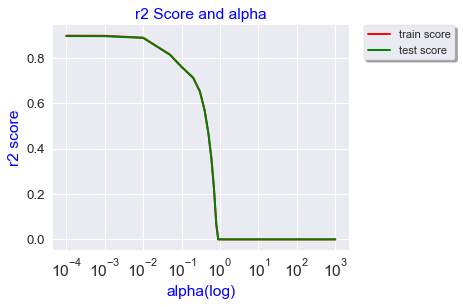

In [153]:
# plotting mean test and train scoes with alpha 

cv_results_lasso['param_alpha'] = cv_results_lasso['param_alpha'].astype('float32')

# plotting
plt.figure(figsize=(6,4), dpi=80, facecolor='w', edgecolor='k', frameon='True')
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_train_score'],color='r')
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_test_score'],color='g')
plt.xlabel('alpha(log)',size = 14,color='b')
plt.ylabel('r2 score',size = 14,color='b')
plt.xscale('log')
plt.title("r2 Score and alpha",size = 14,color='b')
plt.legend(['train score', 'test score'], frameon=True,shadow='True',bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(size = 14)
plt.yticks(size = 12)
plt.tight_layout()
plt.show()

*Clearly from the plot above, we can see that the optimal value of alpha is .001 at which point, the mean test R2 score is maximum. After this point, if we increase alpha, the model accuracy diminishes rapidly.*

*We will use this value of alpha for further prediction of prices and evaluation of our lasso model.*

In [154]:
lasso_alpha =.001

lasso = Lasso(alpha=lasso_alpha)
        
lasso.fit(X_fifa_rlr_train, y_fifa_rlr_train) 
#lasso.coef_

np.round_(lasso.coef_, decimals=3, out=None)

array([-0.007,  0.058,  0.081,  0.005,  0.117,  0.015,  0.   ,  0.043,
        0.141,  0.186, -0.017,  0.057, -0.003, -0.008, -0.024,  0.325,
        0.047,  0.021,  0.   ,  0.31 , -0.036,  0.048, -0.001,  0.054,
        0.034,  0.   ,  0.016,  0.   , -0.015,  0.003,  0.   ,  0.118,
        0.08 ,  0.049, -0.   ,  0.188,  0.181,  0.093,  0.206,  0.22 ,
       -0.014,  0.022, -0.   ,  0.04 ,  0.031, -0.   , -0.011, -0.01 ,
       -0.01 ,  0.014,  0.009,  0.014,  0.   ,  0.01 ,  0.012,  0.011,
       -0.   , -0.001,  0.001,  0.114, -0.037, -0.004, -0.092, -0.   ,
        0.   , -0.014,  0.079, -0.02 , -0.014,  0.   ,  0.01 ,  0.009,
        0.006, -0.005,  0.004, -0.007,  0.088, -0.026, -0.011, -0.   ,
        0.007,  0.007,  0.011, -0.008,  0.009])

In [155]:
# predict and evaluate
y_train_pred_lasso = lasso.predict(X_fifa_rlr_train)
print(metrics.r2_score(y_true=y_fifa_rlr_train, y_pred=y_train_pred_lasso))
y_test_pred_lasso = lasso.predict(X_fifa_rlr_test)
print(metrics.r2_score(y_true=y_fifa_rlr_test, y_pred=y_test_pred_lasso))

0.8989453816147246
0.9017588579736039


## Determining Feature Importance for Lasso

*Capturing the feature coefficients as obtained from our lasso model*

In [156]:
# lasso model parameters
lasso_model_parameters = list(lasso.coef_)
lasso_model_parameters.insert(0, lasso.intercept_)
lasso_model_parameters = [round(x, 3) for x in lasso_model_parameters]
cols = X_fifa_rlr_train.columns
cols = cols.insert(0, "constant")
lasso_coef = list(zip(cols, lasso_model_parameters))
lasso_coef

[('constant', -0.001),
 ('Good_Yrs_left', -0.007),
 ('Special', 0.058),
 ('International Reputation', 0.081),
 ('Weak Foot', 0.005),
 ('Skill Moves', 0.117),
 ('Yrs_left_on_contract', 0.015),
 ('Crossing', 0.0),
 ('Finishing', 0.043),
 ('HeadingAccuracy', 0.141),
 ('ShortPassing', 0.186),
 ('Volleys', -0.017),
 ('Dribbling', 0.057),
 ('Curve', -0.003),
 ('FKAccuracy', -0.008),
 ('LongPassing', -0.024),
 ('BallControl', 0.325),
 ('Acceleration', 0.047),
 ('SprintSpeed', 0.021),
 ('Agility', 0.0),
 ('Reactions', 0.31),
 ('Balance', -0.036),
 ('ShotPower', 0.048),
 ('Jumping', -0.001),
 ('Stamina', 0.054),
 ('Strength', 0.034),
 ('LongShots', 0.0),
 ('Aggression', 0.016),
 ('Interceptions', 0.0),
 ('Positioning', -0.015),
 ('Vision', 0.003),
 ('Penalties', 0.0),
 ('Composure', 0.118),
 ('Marking', 0.08),
 ('StandingTackle', 0.049),
 ('SlidingTackle', -0.0),
 ('GKDiving', 0.188),
 ('GKHandling', 0.181),
 ('GKKicking', 0.093),
 ('GKPositioning', 0.206),
 ('GKReflexes', 0.22),
 ('Height_in_m

#### Selecting the coefficients of the selected features from our final model excluding the intercept. 

#### Also lasso model results in feature selection by making the coefficients of these redundant features 0. Thus we filter the features with coefficient value = 0 and keep only those that are significant in predicting the Dependent variable.

In [157]:
lasso_coef_df = pd.DataFrame(lasso_coef)
col_rename = {0:'Features',1: 'Coefficients'}
lasso_coef_df = lasso_coef_df.rename(columns=col_rename)
lasso_coef_df = lasso_coef_df.iloc[1:,:]
lasso_coef_df = lasso_coef_df.loc[lasso_coef_df['Coefficients']!=0.0]
lasso_coef_df = lasso_coef_df.sort_values(by=['Coefficients'], ascending = False)
lasso_coef_df

,Features,Coefficients
16,BallControl,0.325
20,Reactions,0.310
40,GKReflexes,0.220
39,GKPositioning,0.206
36,GKDiving,0.188
10,ShortPassing,0.186
37,GKHandling,0.181
9,HeadingAccuracy,0.141
32,Composure,0.118
5,Skill Moves,0.117


### Plotting the Features in descending order of Importance based on coefficients for Lasso

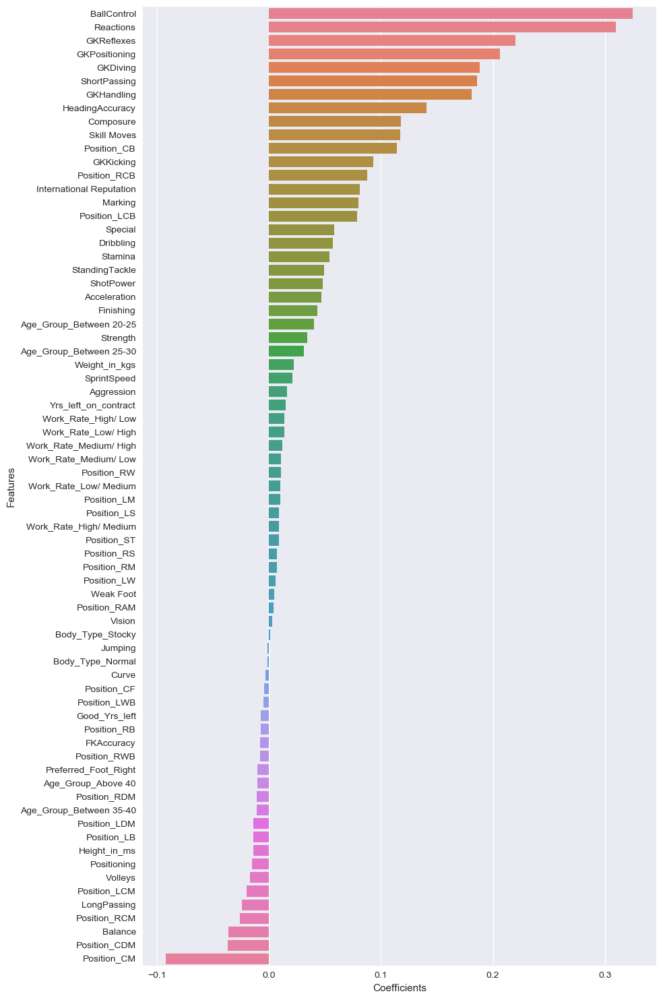

In [158]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=lasso_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

#### We have already said that lasso model results in feature selection by making the coefficients of these redundant features 0. Ridge model doesnt do feature selection. So we will use the selected features from lasso and create our Ridge model based on those. 

In [159]:
features = np.array(lasso_coef_df['Features'])
features

array(['BallControl', 'Reactions', 'GKReflexes', 'GKPositioning',
       'GKDiving', 'ShortPassing', 'GKHandling', 'HeadingAccuracy',
       'Composure', 'Skill Moves', 'Position_CB', 'GKKicking',
       'Position_RCB', 'International Reputation', 'Marking',
       'Position_LCB', 'Special', 'Dribbling', 'Stamina',
       'StandingTackle', 'ShotPower', 'Acceleration', 'Finishing',
       'Age_Group_Between 20-25', 'Strength', 'Age_Group_Between 25-30',
       'Weight_in_kgs', 'SprintSpeed', 'Aggression',
       'Yrs_left_on_contract', 'Work_Rate_High/ Low',
       'Work_Rate_Low/ High', 'Work_Rate_Medium/ High',
       'Work_Rate_Medium/ Low', 'Position_RW', 'Work_Rate_Low/ Medium',
       'Position_LM', 'Position_LS', 'Work_Rate_High/ Medium',
       'Position_ST', 'Position_RS', 'Position_RM', 'Position_LW',
       'Weak Foot', 'Position_RAM', 'Vision', 'Body_Type_Stocky',
       'Jumping', 'Body_Type_Normal', 'Curve', 'Position_CF',
       'Position_LWB', 'Good_Yrs_left', 'Position_

## Model Building - Ridge

In [160]:
# Using features selected by lasso for our ridge model
X_train_ridge = X_fifa_rlr_train[features]
X_test_ridge = X_fifa_rlr_test[features]
print(X_train_ridge.shape)
print(X_test_ridge.shape)

(11748, 71)
(5036, 71)


*We will use GridSearchCV method and 5 fold cross validation method to determine the optimal value of alpha for our ridge regression.*

In [161]:
# list of alphas to tune
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}


ridge = Ridge()

# cross validation
folds = 5
model_cv_ridge = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'r2', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv_ridge.fit(X_train_ridge, y_fifa_rlr_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:    3.5s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
       scoring='r2', verbose=1)

*Capturing the output of GridSearchCV method into a dataframe*

In [162]:
cv_results_ridge = pd.DataFrame(model_cv_ridge.cv_results_)
cv_results_ridge.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.087169,1.374399e-01,0.001594,0.000491,0.0001,{'alpha': 0.0001},0.889467,0.901541,0.900387,0.895416,0.901062,0.897574,0.004609,24,0.90117,0.898383,0.898587,0.899917,0.898497,0.899311,0.001084
1,0.016952,6.632323e-06,0.001396,0.000489,0.001,{'alpha': 0.001},0.889467,0.901541,0.900387,0.895416,0.901062,0.897574,0.004609,23,0.90117,0.898383,0.898587,0.899917,0.898497,0.899311,0.001084
2,0.016955,6.143617e-07,0.001197,0.000400,0.01,{'alpha': 0.01},0.889467,0.901541,0.900387,0.895416,0.901062,0.897574,0.004609,22,0.90117,0.898383,0.898587,0.899917,0.898497,0.899311,0.001084
3,0.017155,3.987600e-04,0.001596,0.000486,0.05,{'alpha': 0.05},0.889467,0.901541,0.900387,0.895416,0.901062,0.897574,0.004609,21,0.90117,0.898383,0.898587,0.899917,0.898497,0.899311,0.001084
4,0.018152,1.162958e-03,0.001396,0.000489,0.1,{'alpha': 0.1},0.889467,0.901541,0.900387,0.895416,0.901062,0.897575,0.004609,20,0.90117,0.898383,0.898587,0.899917,0.898497,0.899311,0.001084


 *Plotting mean test and train R2 scores with all the given values of alpha*

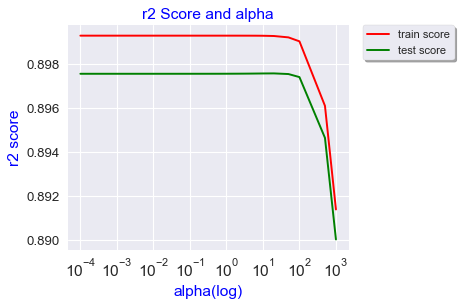

In [163]:
# plotting mean test and train scoes with alpha 
cv_results_ridge['param_alpha'] = cv_results_ridge['param_alpha'].astype('float32')

# plotting
plt.figure(figsize=(6,4), dpi=80, facecolor='w', edgecolor='k', frameon='True')
plt.plot(cv_results_ridge['param_alpha'], cv_results_ridge['mean_train_score'],color='r')
plt.plot(cv_results_ridge['param_alpha'], cv_results_ridge['mean_test_score'],color='g')
plt.xlabel('alpha(log)',size = 14,color='b')
plt.ylabel('r2 score',size = 14,color='b')
plt.xscale('log')
plt.title("r2 Score and alpha",size = 14,color='b')
plt.legend(['train score', 'test score'], frameon=True,shadow='True',bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(size = 14)
plt.yticks(size = 12)
plt.tight_layout()
plt.show()

In [164]:
ridge_alpha = .01
ridge = Ridge(alpha=ridge_alpha)

ridge.fit(X_train_ridge, y_fifa_rlr_train)

np.round_(ridge.coef_, decimals=3, out=None)

array([ 0.329,  0.303,  0.226,  0.21 ,  0.191,  0.197,  0.187,  0.143,
        0.117,  0.118,  0.115,  0.097,  0.089,  0.082,  0.084,  0.079,
        0.066,  0.068,  0.057,  0.06 ,  0.053,  0.05 ,  0.052,  0.041,
        0.033,  0.032,  0.024,  0.02 ,  0.017,  0.015,  0.016,  0.016,
        0.013,  0.013,  0.013,  0.012,  0.012,  0.012,  0.011,  0.017,
        0.009,  0.009,  0.008,  0.007,  0.005,  0.009,  0.   , -0.005,
       -0.003, -0.008, -0.004, -0.007, -0.01 , -0.01 , -0.01 , -0.01 ,
       -0.012, -0.011, -0.013, -0.013, -0.016, -0.017, -0.024, -0.03 ,
       -0.026, -0.022, -0.039, -0.028, -0.041, -0.04 , -0.092])

In [165]:
# predict and evaluate
y_train_pred_ridge = ridge.predict(X_train_ridge)
print(metrics.r2_score(y_true=y_fifa_rlr_train, y_pred=y_train_pred_ridge))
y_test_pred_ridge = ridge.predict(X_test_ridge)
print(metrics.r2_score(y_true=y_fifa_rlr_test, y_pred=y_test_pred_ridge))

0.8991658480619589
0.9014185854323913


## Determining Feature Importance for Ridge

*Capturing the feature coefficients as obtained from our ridge model*

In [166]:
# ridge model parameters
ridge_model_parameters = list(ridge.coef_)
ridge_model_parameters.insert(0, ridge.intercept_)
ridge_model_parameters = [round(x, 3) for x in ridge_model_parameters]
cols = X_fifa_rlr_train.columns
cols = cols.insert(0, "constant")
ridge_coef = list(zip(cols, ridge_model_parameters))
ridge_coef

[('constant', -0.001),
 ('Good_Yrs_left', 0.329),
 ('Special', 0.303),
 ('International Reputation', 0.226),
 ('Weak Foot', 0.21),
 ('Skill Moves', 0.191),
 ('Yrs_left_on_contract', 0.197),
 ('Crossing', 0.187),
 ('Finishing', 0.143),
 ('HeadingAccuracy', 0.117),
 ('ShortPassing', 0.118),
 ('Volleys', 0.115),
 ('Dribbling', 0.097),
 ('Curve', 0.089),
 ('FKAccuracy', 0.082),
 ('LongPassing', 0.084),
 ('BallControl', 0.079),
 ('Acceleration', 0.066),
 ('SprintSpeed', 0.068),
 ('Agility', 0.057),
 ('Reactions', 0.06),
 ('Balance', 0.053),
 ('ShotPower', 0.05),
 ('Jumping', 0.052),
 ('Stamina', 0.041),
 ('Strength', 0.033),
 ('LongShots', 0.032),
 ('Aggression', 0.024),
 ('Interceptions', 0.02),
 ('Positioning', 0.017),
 ('Vision', 0.015),
 ('Penalties', 0.016),
 ('Composure', 0.016),
 ('Marking', 0.013),
 ('StandingTackle', 0.013),
 ('SlidingTackle', 0.013),
 ('GKDiving', 0.012),
 ('GKHandling', 0.012),
 ('GKKicking', 0.012),
 ('GKPositioning', 0.011),
 ('GKReflexes', 0.017),
 ('Height_in

#### Selecting the coefficients of the selected features from our final model excluding the intercept

In [167]:
ridge_coef_df = pd.DataFrame(ridge_coef)
col_rename = {0:'Features',1: 'Coefficients'}
ridge_coef_df = ridge_coef_df.rename(columns=col_rename)
ridge_coef_df = ridge_coef_df.iloc[1:,:]
ridge_coef_df = ridge_coef_df.sort_values(by=['Coefficients'], ascending = False)
ridge_coef_df

,Features,Coefficients
1,Good_Yrs_left,0.329
2,Special,0.303
3,International Reputation,0.226
4,Weak Foot,0.210
6,Yrs_left_on_contract,0.197
5,Skill Moves,0.191
7,Crossing,0.187
8,Finishing,0.143
10,ShortPassing,0.118
9,HeadingAccuracy,0.117


### Plotting the Features in descending order of Importance based on coefficients for Ridge

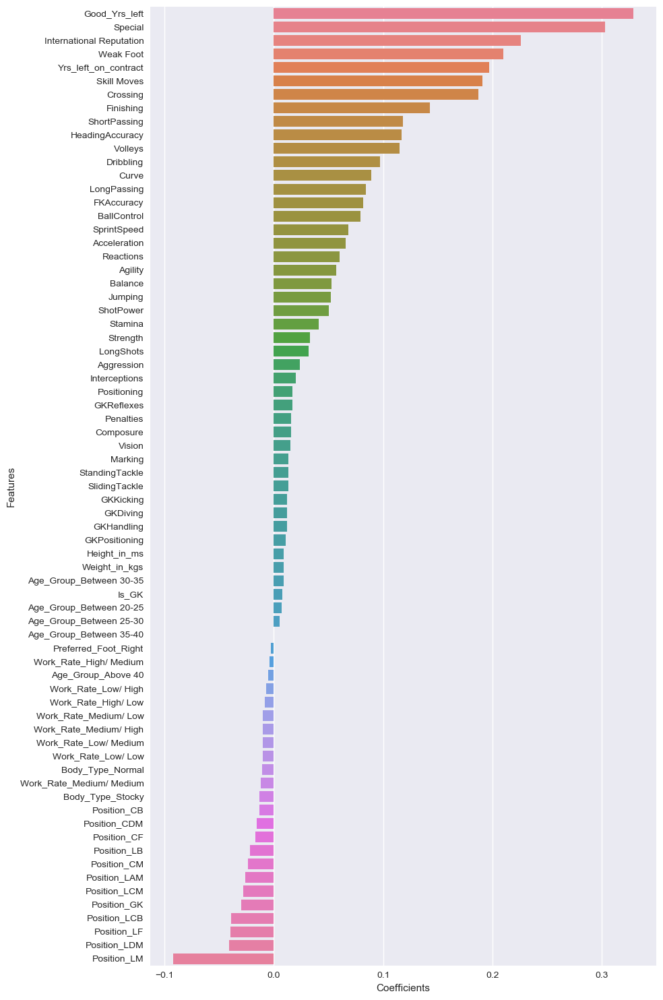

In [168]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=ridge_coef_df, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

## Step 10: Residual Analysis of the test data for both Lasso & Ridge

So, now to check if the error terms are also normally distributed (which is infact, one of the major assumptions of linear regression), let us plot the histogram of the error terms and see what it looks like.

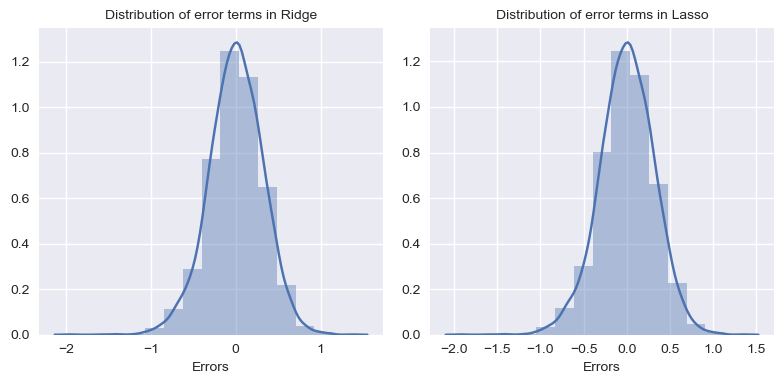

In [169]:
# Plot the histogram of the error terms
plt.figure(figsize=(8,4), dpi=100, facecolor='w', edgecolor='k', frameon='True')

# subplot 1
plt.subplot(1, 2, 1)
sns.distplot((y_fifa_rlr_test - y_test_pred_ridge), bins = 15) 
plt.xlabel('Errors', fontsize = 10)                         # X-label
plt.title("Distribution of error terms in Ridge", fontsize = 10)

# subplot 2
plt.subplot(1, 2, 2)
sns.distplot((y_fifa_rlr_test - y_test_pred_lasso), bins = 15) 
plt.xlabel('Errors', fontsize = 10)                         # X-label
plt.title("Distribution of error terms in Lasso", fontsize = 10)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

#### The above plots show that the error terms are normally distributed with mean value at 0.

*Now let us look at the variance of the error terms*

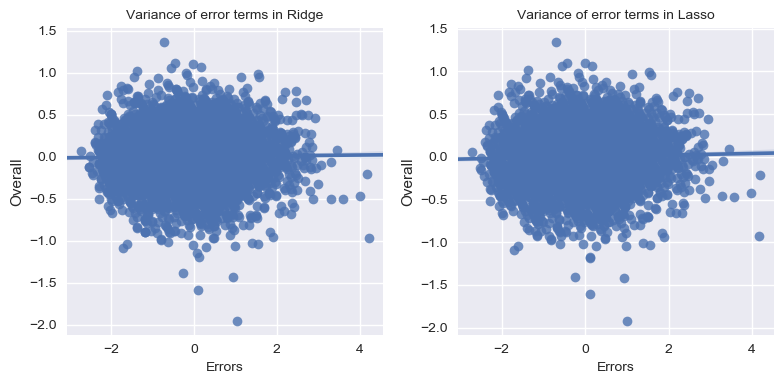

In [170]:
# Plot the histogram of the error terms
plt.figure(figsize=(8,4), dpi=100, facecolor='w', edgecolor='k', frameon='True')

# subplot 1
plt.subplot(1, 2, 1)
sns.regplot(y_test_pred_ridge, (y_fifa_rlr_test-y_test_pred_ridge))
plt.xlabel('Errors', fontsize = 10)                         # X-label
plt.title("Variance of error terms in Ridge", fontsize = 10)

# subplot 2
plt.subplot(1, 2, 2)
sns.regplot(y_test_pred_lasso, (y_fifa_rlr_test-y_test_pred_lasso))
plt.xlabel('Errors', fontsize = 10)                         # X-label
plt.title("Variance of error terms in Lasso", fontsize = 10)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

#### The above plots show that the error terms have a constant variance.

## Step 11: Model Evaluation on test data for both Lasso & Ridge

#### Plotting the best fit line on test data

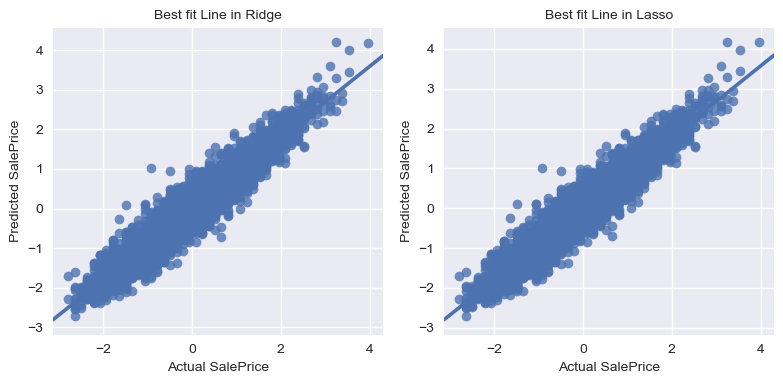

In [171]:
# Plot the histogram of the error terms
plt.figure(figsize=(8,4), dpi=100, facecolor='w', edgecolor='k', frameon='True')

# subplot 1
plt.subplot(1, 2, 1)
sns.regplot(y_fifa_rlr_test, y_test_pred_ridge)
plt.xlabel('Actual SalePrice', fontsize = 10)                         # X-label
plt.ylabel('Predicted SalePrice', fontsize = 10) 
plt.title("Best fit Line in Ridge", fontsize = 10)

# subplot 2
plt.subplot(1, 2, 2)
sns.regplot(y_fifa_rlr_test, y_test_pred_lasso)
plt.xlabel('Actual SalePrice', fontsize = 10)                         # X-label
plt.ylabel('Predicted SalePrice', fontsize = 10)                         # Y-label
plt.title("Best fit Line in Lasso", fontsize = 10)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

*The above plot confirms that line that has been plotted based on beta coefficients represent the data points pretty well.*

#### Plotting the actual and predicted price values from the test dataset so check the likeness

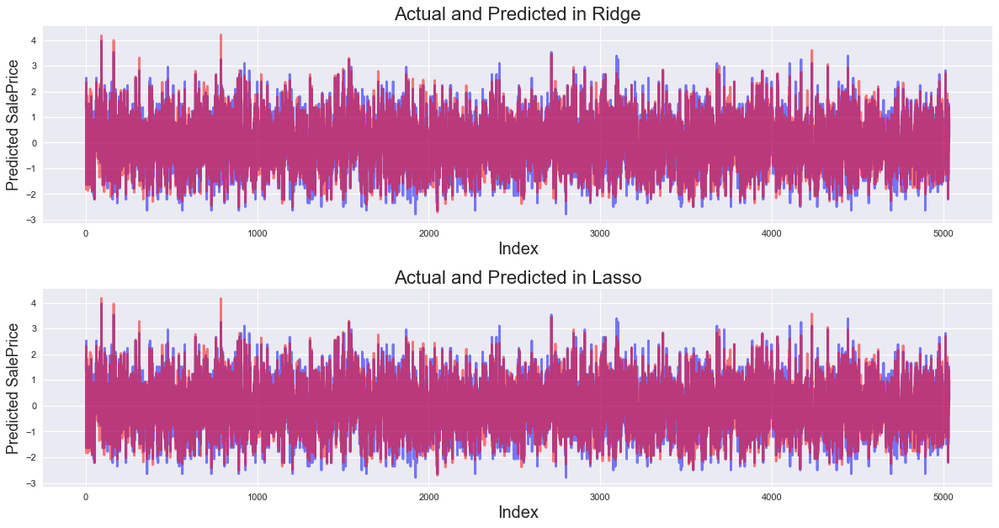

In [172]:
#Actual vs Predicted
c = [i for i in range(1,5037,1)]
fig = plt.figure(figsize=(15,8), dpi=80, facecolor='w', edgecolor='k', frameon='True')

# subplot 1
plt.subplot(2, 1, 1)
plt.plot(c,y_fifa_rlr_test, color="blue", linewidth=2.5, linestyle="-", alpha=.5)
plt.plot(c,y_test_pred_ridge, color="red",  linewidth=2.5, linestyle="-", alpha=.5)
plt.title('Actual and Predicted in Ridge', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                               # X-label
plt.ylabel('Predicted SalePrice', fontsize=16)                               # Y-label

# subplot 2
plt.subplot(2, 1, 2)
plt.plot(c,y_fifa_rlr_test, color="blue", linewidth=2.5, linestyle="-", alpha=.5)
plt.plot(c,y_test_pred_lasso, color="red",  linewidth=2.5, linestyle="-", alpha=.5)
plt.title('Actual and Predicted in Lasso', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                               # X-label
plt.ylabel('Predicted SalePrice', fontsize=16)                               # Y-label

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

#### Determining the r2 score, adjusted r2 score, rmse, aic, bic of the Lasso model on the test dataset

In [173]:
from sklearn.metrics import r2_score
r2_lasso = r2_score(y_true=y_fifa_rlr_test, y_pred=y_test_pred_lasso)
print ("R2 score on test data with Lasso regularization is %f" % r2_lasso)

# Looking at the RMSE (helps in model comparison)
from sklearn.metrics import mean_squared_error
rmse_lasso = np.sqrt(mean_squared_error(y_fifa_rlr_test, y_test_pred_lasso))
print ("RMSE score on test data with Lasso regularization is %f" % rmse_lasso)

from RegscorePy import *
aic_lasso = aic.aic(y_fifa_rlr_test, y_test_pred_lasso, 85)
print ("AIC score on test data with Lasso regularization is %f" % aic_lasso)

from RegscorePy import *
bic_lasso = bic.bic(y_fifa_rlr_test, y_test_pred_lasso, 85)
print ("BIC score on test data with Lasso regularization is %f" % bic_lasso)

R2 score on test data with Lasso regularization is 0.901759
RMSE score on test data with Lasso regularization is 0.320108
AIC score on test data with Lasso regularization is -11302.988669
BIC score on test data with Lasso regularization is -10748.417441


#### Determining the r2 score, adjusted r2 score, rmse, aic, bic of the Ridge model on the test dataset

In [174]:
from sklearn.metrics import r2_score
r2_ridge = r2_score(y_true=y_fifa_rlr_test, y_pred=y_test_pred_ridge)
print ("R2 score on test data with Ridge regularization is %f" % r2_ridge)

# Looking at the RMSE (helps in model comparison)
from sklearn.metrics import mean_squared_error
rmse_ridge = np.sqrt(mean_squared_error(y_fifa_rlr_test, y_test_pred_ridge))
print ("RMSE score on test data with Ridge regularization is %f" % rmse_ridge)

from RegscorePy import *
aic_ridge = aic.aic(y_fifa_rlr_test, y_test_pred_ridge, 71)
print ("AIC score on test data with Ridge regularization is %f" % aic_ridge)

from RegscorePy import *
bic_ridge = bic.bic(y_fifa_rlr_test, y_test_pred_ridge, 71)
print ("BIC score on test data with Ridge regularization is %f" % bic_ridge)

R2 score on test data with Ridge regularization is 0.901419
RMSE score on test data with Ridge regularization is 0.320662
AIC score on test data with Ridge regularization is -11313.575886
BIC score on test data with Ridge regularization is -10850.345801


## Decision Tree

### Making a copy of original dataframes

In [175]:
fifa_dt_df = fifa_df.copy()
print(fifa_dt_df.shape)
print(fifa_dt_df.shape)

(16784, 97)
(16784, 97)


### Dropping columns that won't be considered for prediction purpose

In [176]:
columns_to_drop = ['Name','Age', 'Potential', 'Nationality', 'Club', 'Jersey Number','Joined', 'Contract Valid Until', 'Wage_in_Th', 'Value_in_M', \
                   'Release_Clause_in_M']

fifa_dt_df = fifa_dt_df.drop(columns_to_drop, axis=1)
fifa_dt_df.head()

,Good_Yrs_left,Overall,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
0,4,94,2202,5.0,4.0,4.0,2.890372,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,2,94,2228,5.0,4.0,5.0,1.609438,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,9,92,2143,5.0,5.0,5.0,1.791759,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,8,91,1471,4.0,3.0,1.0,2.302585,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,8,91,2281,4.0,5.0,4.0,2.197225,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


### Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

In [177]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

fifa_dt_df[fifa_dt_df.columns]=scaler.fit_transform(fifa_dt_df[fifa_dt_df.columns])

fifa_dt_df.head()

,Good_Yrs_left,Overall,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
0,-1.250092,3.965985,2.187257,9.592527,1.579639,2.143964,2.652931,1.849048,2.519018,1.009769,2.111514,2.412429,2.185134,2.468260,2.898743,2.221444,2.234827,1.758400,1.445194,1.852775,3.645040,2.190688,1.700228,0.240341,0.547283,-0.516281,2.416370,-0.464552,-1.200699,2.239645,2.848159,1.676265,3.240657,-0.721508,-0.915581,-0.928840,-0.599982,-0.318769,-0.074801,-0.140270,-0.484851,-1.677211,-0.456555,-0.354098,-0.767132,-0.663656,2.622940,-0.127384,-0.018911,-1.823059,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,32.372828,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
1,-1.678257,3.965985,2.282014,9.592527,1.579639,3.459036,0.421395,1.849048,2.467933,2.099284,1.500683,2.468660,1.710724,1.818827,1.874483,1.569537,2.115398,1.625132,1.785071,1.582616,3.755546,0.428563,2.279321,2.517849,1.551250,1.083375,2.364629,0.398761,-0.862751,2.290684,2.001099,2.311530,3.153417,-0.972386,-0.777241,-1.069616,-0.543535,-0.318769,-0.074801,-0.140270,-0.317951,0.990559,1.082307,-0.354098,-0.767132,-0.663656,2.622940,-0.127384,-0.018911,0.548529,5.030627,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.030890,-0.257015,-0.109539,-0.144868,-0.070497,2.755714
2,-0.179682,3.678587,1.972231,9.592527,3.091194,3.459036,0.739021,1.577629,2.110336,0.551026,1.704294,2.299967,2.132422,2.197663,2.500420,1.634727,2.175112,1.958301,1.717096,2.190474,3.534535,1.415353,1.410682,-0.350124,1.112015,-1.316108,1.795474,-0.004118,-0.524803,1.984452,2.354041,2.057424,3.066178,-1.022562,-1.100033,-0.600362,-0.430642,-0.436844,-0.074801,-0.081625,-0.317951,-0.936164,-1.033098,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,2.163744,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,6.913082,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.030890,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
3,-0.393764,3.534888,-0.476875,7.120874,0.068085,-1.801250,1.628938,-1.787959,-1.669970,-1.800031,-0.603289,-1.692429,-1.979128,-1.428338,-1.369005,-0.125421,-0.989733,-0.507150,-0.458117,-0.240961,3.092512,-1.474532,-1.426871,0.155989,-1.272406,-0.116367,-1.826419,-1.040095,-0.814473,-1.945534,1.012862,-0.547163,0.797948,-1.624670,-1.238373,-1.538870,4.141

### Splitting the Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [178]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

fifa_dt_train, fifa_dt_test = train_test_split(fifa_dt_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [179]:
print(fifa_dt_train.shape)
print(fifa_dt_test.shape)

(11748, 86)
(5036, 86)


## Dividing the train dataframes into X and Y sets for the model building

In [180]:
y_fifa_dt_train = fifa_dt_train.pop('Overall')
X_fifa_dt_train = fifa_dt_train

X_fifa_dt_train.head()

,Good_Yrs_left,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
2264,-1.892339,1.487512,-0.294083,1.579639,-0.486178,-2.382432,1.197643,0.373439,0.952426,1.161333,0.556808,0.814617,0.898797,0.793320,1.504346,0.622547,0.492357,0.629489,1.177376,1.876950,1.344868,0.136679,0.746454,1.174763,0.443513,0.708906,1.089412,1.116661,0.657443,1.577569,1.422159,0.710709,1.285518,0.975057,0.901250,-0.430642,-0.259731,-0.256321,-0.492138,-0.262317,-0.491535,-0.456555,-0.354098,-0.767132,-0.663656,2.622940,-0.127384,-0.018911,0.548529,-0.198782,2.163744,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,8.409905,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
11611,-0.607846,-1.005329,-0.294083,0.068085,-0.486178,-1.174889,-1.082271,-1.005862,0.608369,-0.739029,-0.680272,-0.924885,-1.211860,-0.913779,-1.559617,-0.392592,-1.506657,-1.545723,-1.321599,-1.217208,-1.333562,-0.674051,0.493398,-0.017448,1.323323,-1.515971,0.341207,0.585599,-1.333069,-1.316555,-0.547163,-0.161687,0.833937,0.790605,0.760474,-0.599982,-0.200694,-0.437842,-0.668073,-0.317951,0.990559,1.338077,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,0.844705,-0.257279,3.051161,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
12996,0.034401,0.124468,-0.294083,0.068085,0.828893,0.421395,0.329105,0.731035,-0.825202,0.754112,-0.230425,0.392920,0.411722,0.053577,0.852439,0.264262,0.625625,0.425563,0.299358,-0.996197,0.428563,0.136679,-0.265772,0.045300,-0.436298,0.346717,-0.579661,-0.862751,-0.261254,0.448155,0.723367,-0.336167,0.382356,-0.546676,0.150444,-0.148408,-0.318769,-0.135308,-0.081625,-0.151050,-0.195117,0.248580,-0.354098,1.303557,-0.663656,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
1991,0.462565,1.305287,-0.294083,3.091194,2.143964,0.739021,1.794764,1.037547,-0.939888,0.686242,1.512734,1.183603,1.602349,1.305450,0.396104,1.040545,1.558498,1.717096,1.785235,0.771894,1.344868,1.352773,0.999510,0.484536,-0.756229,1.381544,0.283653,0.054537,1.014715,-0.116552,-0.166004,1.059667,0.783761,0.467813,0.338146,-0.204855,-0.200694,-0.619362,-0.257559,-0.

## Dividing into X and Y test sets for the model building for 3 dataframes

In [181]:
y_fifa_dt_test = fifa_dt_test.pop('Overall')
X_fifa_dt_test = fifa_dt_test

X_fifa_dt_test.head()

,Good_Yrs_left,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
1400,-0.179682,1.381822,-0.294083,0.068085,2.143964,1.007569,1.360494,1.292973,0.378998,0.957723,1.006656,1.447164,1.494111,1.589967,0.722058,1.279402,0.692259,0.493538,1.785235,1.103411,1.415353,1.005317,0.577750,0.547283,-0.916194,1.174578,1.377184,0.247651,1.218870,1.436392,1.231579,1.234146,0.532883,-0.362223,-0.553437,-0.148408,-0.141656,-0.498349,-0.316204,-0.484851,-1.232582,-0.904506,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,-1.823059,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,0.844705,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,3.890818,-0.109539,-0.144868,-0.070497,-0.362882
127,-0.179682,0.751322,4.649222,1.579639,-0.486178,0.739021,-0.050881,-1.056947,1.583198,0.821983,-0.905196,0.392920,-0.129472,-1.539715,1.178392,0.741975,0.159188,0.289612,-0.173421,1.987456,-0.346772,0.542043,0.915158,0.170796,1.163358,0.657165,1.262075,1.937393,-0.924758,0.377566,-0.483636,2.019303,2.038153,1.805094,1.745907,-0.487088,-0.377807,-0.558856,-0.140270,-0.206683,0.990559,0.377172,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,3.119528,-0.221063,-1.080054,0.844705,-0.257279,3.051161,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
17138,1.104811,-2.692734,-0.294083,0.068085,-1.801250,-1.174889,-2.059377,-1.925396,-2.316116,-2.232171,-1.917353,-2.189977,-1.861293,-1.710425,-2.276714,-2.661727,-2.506164,-2.293453,-1.726838,-2.101253,-2.179382,-2.179691,-2.037166,-2.401869,-0.436298,-2.033385,-1.960963,-1.683483,-2.302805,-1.034201,-2.262379,-3.302313,-2.026075,-1.561164,-1.585795,2.222354,2.515033,2.405980,1.970940,2.129926,1.435187,2.492577,2.824075,-0.767132,-0.663656,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,0.844705,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,2.824075,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
7789,0.248483,0.084378,-0.294083,0.068085,0.828893,0.032653,0.926225,0.679950,-0.137088,0.821983,0.669270,0.709193,0.249364,0.281191,1.048011,0.622547,0.292456,0.017711,0.704597,-0.333163,0.710503,0.426225,-0.603180,-0.268440,-0.516281,0.450200,-1.155203,-1.538648,0.657443,0.942273,0.723367,-0.336167,0.131478,-1.284486,-1.304243,-0.035515,-0.554919,-0.377335,-0.49213

In [182]:
# Importing decision tree classifier from sklearn library
from sklearn.tree import DecisionTreeRegressor

# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
dt_default = DecisionTreeRegressor(max_depth=5)
dt_default.fit(X_fifa_dt_train, y_fifa_dt_train)

DecisionTreeRegressor(criterion='mse', max_depth=5, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=None, splitter='best')

In [183]:
# Making predictions
y_pred_default = dt_default.predict(X_fifa_dt_test)

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

print('R2 Score: {}'.format(r2_score(y_fifa_dt_test, y_pred_default)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_fifa_dt_test, y_pred_default)))

R2 Score: 0.8348122585820106
Mean Squared Error: 0.17229672087236916


### Plotting the Decision Tree

To visualise decision trees in python, you need to install certain external libraries. You can read about the process in detail here: http://scikit-learn.org/stable/modules/tree.html

We need the ```graphviz``` library to plot a tree.

In [184]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

# Putting features
features = list(X_fifa_dt_train.columns)
features

['Good_Yrs_left',
 'Special',
 'International Reputation',
 'Weak Foot',
 'Skill Moves',
 'Yrs_left_on_contract',
 'Crossing',
 'Finishing',
 'HeadingAccuracy',
 'ShortPassing',
 'Volleys',
 'Dribbling',
 'Curve',
 'FKAccuracy',
 'LongPassing',
 'BallControl',
 'Acceleration',
 'SprintSpeed',
 'Agility',
 'Reactions',
 'Balance',
 'ShotPower',
 'Jumping',
 'Stamina',
 'Strength',
 'LongShots',
 'Aggression',
 'Interceptions',
 'Positioning',
 'Vision',
 'Penalties',
 'Composure',
 'Marking',
 'StandingTackle',
 'SlidingTackle',
 'GKDiving',
 'GKHandling',
 'GKKicking',
 'GKPositioning',
 'GKReflexes',
 'Height_in_ms',
 'Weight_in_kgs',
 'Is_GK',
 'Age_Group_Between 20-25',
 'Age_Group_Between 25-30',
 'Age_Group_Between 30-35',
 'Age_Group_Between 35-40',
 'Age_Group_Above 40',
 'Preferred_Foot_Right',
 'Work_Rate_High/ Low',
 'Work_Rate_High/ Medium',
 'Work_Rate_Low/ High',
 'Work_Rate_Low/ Low',
 'Work_Rate_Low/ Medium',
 'Work_Rate_Medium/ High',
 'Work_Rate_Medium/ Low',
 'Work_Ra

**Note**:<br>
Python requires library pydot and an external software graphviz to visualize the decision tree. If you are on wondows, you'll need to specify the path for the pydot library to access dot file from graphviz.

Please read the downloadable instructions to install graphviz. For Mac users, one way is to:
- Install the python graphviz module: ```pip install graphviz```
- Then install the Graphviz software on Mac, you do this using homebrew:
    - Install homebrew: https://docs.brew.sh/Installation
    - ```brew install graphviz```

In [185]:
# If you're on windows:
# Specifing path for dot file.
# import os
# os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/graphviz-2.38/release/bin/'

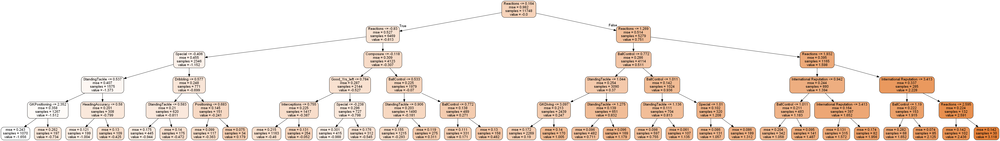

In [186]:
# plotting tree with max_depth=3
dot_data = StringIO()  
export_graphviz(dt_default, out_file=dot_data,
                feature_names=features, filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Tuning max_depth

Let's first try to find the optimum values for max_depth and understand how the value of max_depth affects the decision tree.

Here, we are creating a dataframe with max_depth in range 1 to 80 and checking the accuracy score corresponding to each max_depth. 

To reiterate, a grid search scheme consists of:

    - an estimator (classifier such as SVC() or decision tree)
    - a parameter space
    - a method for searching or sampling candidates (optional) 
    - a cross-validation scheme, and
    - a score function (accuracy, roc_auc etc.)

In [187]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(1, 40)}

# instantiate the model
dtree = DecisionTreeRegressor(random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring= 'r2')
tree.fit(X_fifa_dt_train, y_fifa_dt_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=100, splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': range(1, 40)}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='r2', verbose=0)

In [188]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.036303,0.005109,0.002594,0.000800,1,{'max_depth': 1},0.459741,0.469558,0.485366,0.456402,0.471314,0.468477,0.010165,39,0.471368,0.469098,0.464807,0.472218,0.468672,0.469233,0.002584
1,0.052660,0.003420,0.001796,0.000399,2,{'max_depth': 2},0.635657,0.658256,0.665872,0.637681,0.660800,0.651654,0.012494,38,0.659171,0.653235,0.651749,0.658232,0.653195,0.655117,0.002991
2,0.071408,0.000489,0.001596,0.000489,3,{'max_depth': 3},0.715814,0.731388,0.728221,0.714045,0.729890,0.723872,0.007391,37,0.730726,0.728622,0.727468,0.732442,0.727354,0.729322,0.001975
3,0.092772,0.001099,0.001992,0.000003,4,{'max_depth': 4},0.766730,0.781095,0.787138,0.771981,0.775232,0.776436,0.007096,36,0.784176,0.782443,0.779162,0.789404,0.782178,0.783473,0.003376
4,0.115127,0.000798,0.001785,0.000410,5,{'max_depth': 5},0.816060,0.822656,0.828595,0.816702,0.823720,0.821547,0.004674,35,0.833514,0.829923,0.828608,0.834058,0.831730,0.831567,0.002073


Now let's visualize how train and test score changes with max_depth.

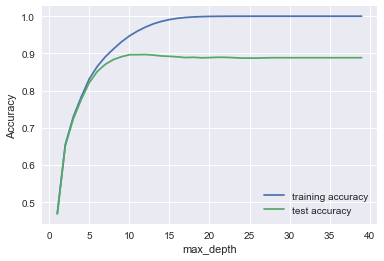

In [189]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


You can see that as we increase the value of max_depth, both training and test score increase till about max-depth = 10, after which the test score gradually reduces. 

### Tuning min_samples_leaf

The hyperparameter **min_samples_leaf** indicates the minimum number of samples required to be at a leaf.<br>

So if the values of min_samples_leaf is less, say 5, then the will be constructed even if a leaf has 5, 6 etc. observations (and is likely to overfit).<br>

Let's see what will be the optimum value for min_samples_leaf.

In [190]:
# GridSearchCV to find optimal max_depth
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(5, 200, 20)}

# instantiate the model
dtree = DecisionTreeRegressor(random_state = 100, max_depth = 10)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring= 'r2')
tree.fit(X_fifa_dt_train, y_fifa_dt_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeRegressor(criterion='mse', max_depth=10, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=100, splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_leaf': range(5, 200, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='r2', verbose=0)

In [191]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.240003,0.013561,0.001996,0.000631,5,{'min_samples_leaf': 5},0.894848,0.901070,0.897741,0.898833,0.902534,0.899005,0.002669,1,0.944390,0.942299,0.942904,0.944218,0.943377,0.943437,0.000788
1,0.200266,0.001323,0.001600,0.000495,25,{'min_samples_leaf': 25},0.893985,0.896701,0.897126,0.895842,0.901265,0.896984,0.002397,2,0.925000,0.920732,0.921189,0.925386,0.923411,0.923143,0.001907
2,0.184109,0.000797,0.001794,0.000398,45,{'min_samples_leaf': 45},0.885841,0.883563,0.893447,0.884505,0.889804,0.887432,0.003685,3,0.909373,0.904162,0.906238,0.912782,0.907009,0.907913,0.002951
3,0.172751,0.001585,0.001800,0.000388,65,{'min_samples_leaf': 65},0.874641,0.879860,0.879018,0.869053,0.887032,0.877921,0.005955,4,0.896704,0.893808,0.895011,0.896516,0.895876,0.895583,0.001067
4,0.164775,0.002027,0.001991,0.000005,85,{'min_samples_leaf': 85},0.864139,0.868001,0.875156,0.860498,0.875008,0.868561,0.005830,5,0.885611,0.881774,0.884649,0.888419,0.884371,0.884965,0.002144


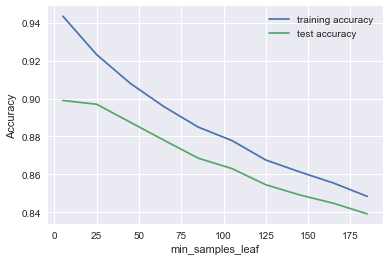

In [192]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


You can see that at low values of min_samples_leaf, the tree gets a bit overfitted. At values > 100, however, the model becomes more stable and the training and test accuracy start to converge.

### Tuning min_samples_split

The hyperparameter **min_samples_split** is the minimum no. of samples required to split an internal node. Its default value is 2, which means that even if a node is having 2 samples it can be furthur divided into leaf nodes.

In [193]:
# GridSearchCV to find optimal min_samples_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(5, 100, 10)}

# instantiate the model
dtree = DecisionTreeRegressor(max_depth=10, random_state = 100)

# fit tree on training data
tree = GridSearchCV(dtree, parameters, 
                    cv=n_folds, 
                   scoring= 'r2')
tree.fit(X_fifa_dt_train, y_fifa_dt_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeRegressor(criterion='mse', max_depth=10, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=100, splitter='best'),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_split': range(5, 100, 10)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='r2', verbose=0)

In [194]:
# scores of GridSearch CV
scores = tree.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.238384,0.013965,0.001993,0.000002,5,{'min_samples_split': 5},0.893759,0.896817,0.896964,0.896802,0.899858,0.896839,0.001930,5,0.947308,0.945202,0.946132,0.947177,0.946261,0.946416,0.000769
1,0.227591,0.002631,0.001818,0.000397,15,{'min_samples_split': 15},0.896484,0.896265,0.897119,0.898047,0.898969,0.897377,0.001008,4,0.943505,0.941988,0.942124,0.943696,0.942149,0.942693,0.000746
2,0.220012,0.001353,0.001426,0.000489,25,{'min_samples_split': 25},0.898394,0.898092,0.897081,0.896898,0.900872,0.898267,0.001422,2,0.938801,0.936747,0.938135,0.939388,0.937762,0.938167,0.000903
3,0.214426,0.000632,0.001602,0.000493,35,{'min_samples_split': 35},0.896629,0.899859,0.896547,0.898749,0.900890,0.898534,0.001728,1,0.935152,0.933486,0.933906,0.935197,0.934123,0.934373,0.000686
4,0.209793,0.000937,0.001779,0.000391,45,{'min_samples_split': 45},0.894483,0.899304,0.896941,0.899123,0.900332,0.898036,0.002092,3,0.932206,0.929165,0.929638,0.931741,0.930746,0.930699,0.001169


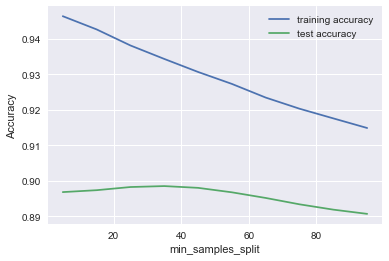

In [195]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


## Grid Search to Find Optimal Hyperparameters

We can now use GridSearchCV to find multiple optimal hyperparameters together. Note that this time, we'll also specify the criterion (gini/entropy or IG).

In [196]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(25, 125, 50),
    'min_samples_split': range(25, 75, 25)
}

n_folds = 5

# Instantiate the grid search model
dtree = DecisionTreeRegressor(random_state = 100)
grid_search = GridSearchCV(estimator = dtree, param_grid = param_grid, 
                          cv = n_folds, verbose = 1, n_jobs = -1)

# Fit the grid search to the data
grid_search.fit(X_fifa_dt_train, y_fifa_dt_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    6.3s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=DecisionTreeRegressor(criterion='mse', max_depth=None, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           presort=False, random_state=100, splitter='best'),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': range(5, 15, 5), 'min_samples_leaf': range(25, 125, 50), 'min_samples_split': range(25, 75, 25)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [197]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.199266,0.006776,0.003589,0.000488,5,25,25,"{'max_depth': 5, 'min_samples_leaf': 25, 'min_...",0.815684,0.822656,0.828595,0.817045,0.822700,0.821336,0.004619,5,0.833108,0.829923,0.828608,0.833985,0.831565,0.831438,0.001980
1,0.174730,0.000976,0.002793,0.000400,5,25,50,"{'max_depth': 5, 'min_samples_leaf': 25, 'min_...",0.815684,0.822656,0.828595,0.817045,0.822700,0.821336,0.004619,5,0.833108,0.829923,0.828608,0.833985,0.831565,0.831438,0.001980
2,0.176924,0.003816,0.002794,0.000401,5,75,25,"{'max_depth': 5, 'min_samples_leaf': 75, 'min_...",0.813921,0.821040,0.827041,0.818734,0.823476,0.820842,0.004422,7,0.831835,0.827867,0.826718,0.831968,0.829969,0.829671,0.002099
3,0.204652,0.019650,0.003393,0.000487,5,75,50,"{'max_depth': 5, 'min_samples_leaf': 75, 'min_...",0.813921,0.821040,0.827041,0.818734,0.823476,0.820842,0.004422,7,0.831835,0.827867,0.826718,0.831968,0.829969,0.829671,0.002099
4,0.315555,0.003764,0.003392,0.000487,10,25,25,"{'max_depth': 10, 'min_samples_leaf': 25, 'min...",0.893985,0.896701,0.897126,0.895842,0.901265,0.896984,0.002397,1,0.925000,0.920732,0.921189,0.925386,0.923411,0.923143,0.001907
5,0.316752,0.008430,0.002992,0.000631,10,25,50,"{'max_depth': 10, 'min_samples_leaf': 25, 'min...",0.893985,0.896701,0.897126,0.895842,0.901265,0.896984,0.002397,1,0.925000,0.920732,0.921189,0.925386,0.923411,0.923143,0.001907
6,0.262697,0.003490,0.002992,0.000630,10,75,25,"{'max_depth': 10, 'min_samples_leaf': 75, 'min...",0.870769,0.874639,0.878446,0.864380,0.880445,0.873736,0.005733,3,0.892473,0.888279,0.890908,0.892260,0.888556,0.890495,0.001782
7,0.256513,0.003179,0.002994,0.001096,10,75,50,"{'max_depth': 10, 'min_samples_leaf': 75, 'min...",0.870769,0.874639,0.878446,0.864380,0.880445,0.873736,0.005733,3,0.892473,0.888279,0.890908,0.892260,0.888556,0.890495,0.001782


In [198]:
# printing the optimal accuracy score and hyperparameters
print("best accuracy", grid_search.best_score_)
print(grid_search.best_estimator_)

best accuracy 0.8969835485582234
DecisionTreeRegressor(criterion='mse', max_depth=10, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=25,
           min_samples_split=25, min_weight_fraction_leaf=0.0,
           presort=False, random_state=100, splitter='best')


<hr>

**Running the model with best parameters obtained from grid search.**

In [199]:
# model with optimal hyperparameters
clf_gini = DecisionTreeRegressor(random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=25,
                                  min_samples_split=25)
clf_gini.fit(X_fifa_dt_train, y_fifa_dt_train)

DecisionTreeRegressor(criterion='mse', max_depth=10, max_features=None,
           max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=25,
           min_samples_split=25, min_weight_fraction_leaf=0.0,
           presort=False, random_state=100, splitter='best')

In [200]:
# accuracy score
clf_gini.score(X_fifa_dt_test, y_fifa_dt_test)

0.905358299683527

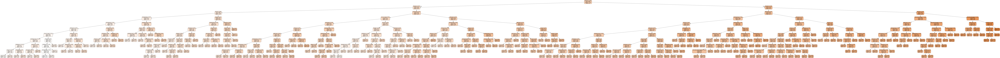

In [201]:
# plotting the tree
dot_data = StringIO()  
export_graphviz(clf_gini, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

You can see that this tree is too complex to understand. Let's try reducing the max_depth and see how the tree looks.

In [202]:
# Making predictions
y_pred_dt = clf_gini.predict(X_fifa_dt_test)

## Model Evaluation: Decision Trees

#### Plotting the actual and predicted price values from the test dataset so check the likeness

Text(0,0.5,'Views')

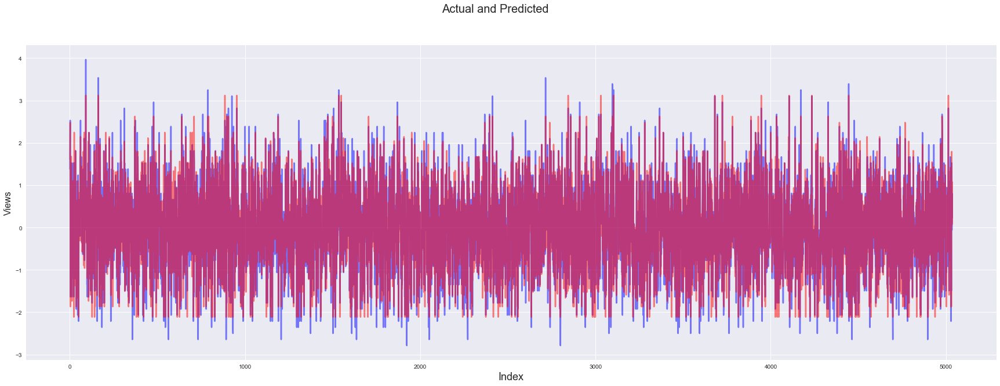

In [203]:
#Actual vs Predicted
c = [i for i in range(1,5037,1)]
fig = plt.figure(figsize=(30,10))
plt.plot(c,y_fifa_dt_test, color="blue", alpha = 0.5, linewidth=2.5, linestyle="-")
plt.plot(c,y_pred_dt, color="red",  alpha = 0.5, linewidth=2.5, linestyle="-")
fig.suptitle('Actual and Predicted', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                               # X-label
plt.ylabel('Views', fontsize=16)                               # Y-label

#### Drawing a scatter plot with actual and predicted price values from the test dataset to check the spread

Text(0,0.5,'y_pred')

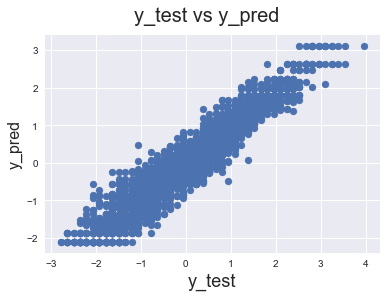

In [204]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_fifa_dt_test,y_pred_dt)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

#### Drawing a scatter plot of the error terms to check the spread to ensure that the error terms have constant variance (homoscedasticity). The variance doesn't increase (or decrease) or follow a pattern as the error values change.

Text(0,0.5,'ytest-ypred')

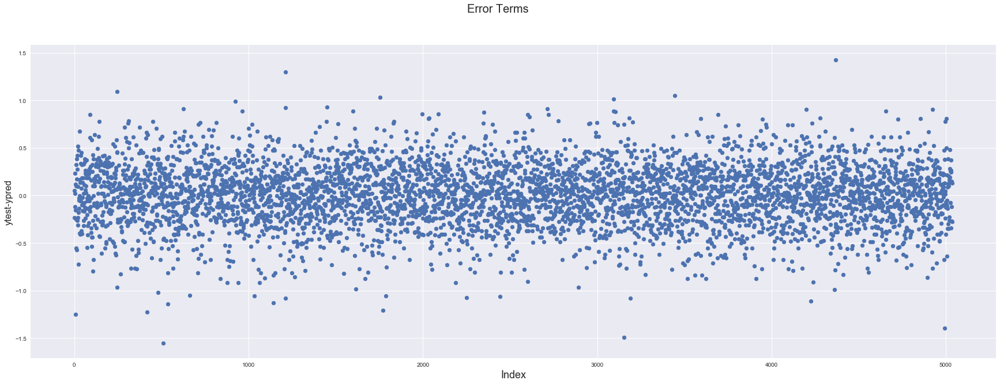

In [205]:
# Error terms
fig = plt.figure(figsize=(30,10))
c = [i for i in range(1,5037,1)]
plt.scatter(c,y_fifa_dt_test - y_pred_dt)

fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                      # X-label
plt.ylabel('ytest-ypred', fontsize=16)                # Y-label

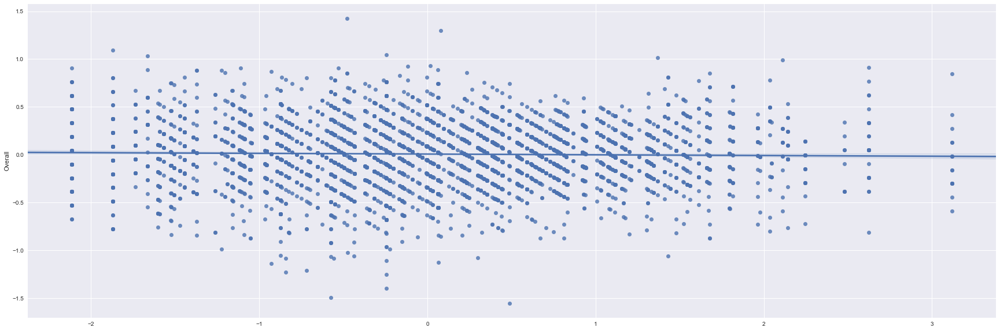

In [206]:
fig = plt.figure(figsize=(30,10))
sns.regplot(y_pred_dt, (y_fifa_dt_test - y_pred_dt))
plt.show()

#### Plotting the distribution of the error terms

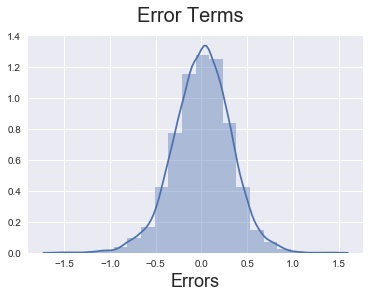

In [207]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_fifa_dt_test-y_pred_dt), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label
plt.show()

#### Plotting a line for the scatter plot including actual and predicted prices from test dataset. Overall we have a pretty linear spread

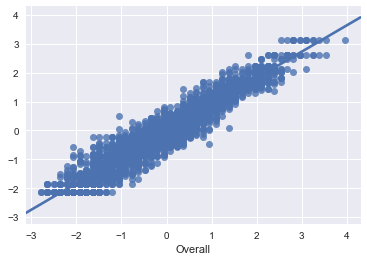

In [208]:
sns.regplot(y_fifa_dt_test, y_pred_dt)
plt.show()

#### Testing the r2 score and mse score of the model on the test dataset

In [209]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

print('R2 Score: {}'.format(r2_score(y_fifa_dt_test, y_pred_dt)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_fifa_dt_test, y_pred_dt)))

R2 Score: 0.905358299683527
Mean Squared Error: 0.09871467750777022


## Random Forest

### Making a copy of original dataframes

In [210]:
fifa_rf_df = fifa_df.copy()
print(fifa_rf_df.shape)
print(fifa_df.shape)

(16784, 97)
(16784, 97)


### Dropping columns that won't be considered for prediction purpose

In [211]:
columns_to_drop = ['Name','Age', 'Potential', 'Nationality', 'Club', 'Jersey Number','Joined', 'Contract Valid Until', 'Wage_in_Th', 'Value_in_M', \
                   'Release_Clause_in_M']

fifa_rf_df = fifa_rf_df.drop(columns_to_drop, axis=1)
fifa_rf_df.head()

,Good_Yrs_left,Overall,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
0,4,94,2202,5.0,4.0,4.0,2.890372,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,2,94,2228,5.0,4.0,5.0,1.609438,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,9,92,2143,5.0,5.0,5.0,1.791759,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,8,91,1471,4.0,3.0,1.0,2.302585,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,8,91,2281,4.0,5.0,4.0,2.197225,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


### Rescaling the Features of the 3 Dataframes

We will use Standard scaling.

In [212]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

fifa_rf_df[fifa_rf_df.columns]=scaler.fit_transform(fifa_rf_df[fifa_rf_df.columns])

fifa_rf_df.head()

,Good_Yrs_left,Overall,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
0,-1.250092,3.965985,2.187257,9.592527,1.579639,2.143964,2.652931,1.849048,2.519018,1.009769,2.111514,2.412429,2.185134,2.468260,2.898743,2.221444,2.234827,1.758400,1.445194,1.852775,3.645040,2.190688,1.700228,0.240341,0.547283,-0.516281,2.416370,-0.464552,-1.200699,2.239645,2.848159,1.676265,3.240657,-0.721508,-0.915581,-0.928840,-0.599982,-0.318769,-0.074801,-0.140270,-0.484851,-1.677211,-0.456555,-0.354098,-0.767132,-0.663656,2.622940,-0.127384,-0.018911,-1.823059,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,32.372828,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
1,-1.678257,3.965985,2.282014,9.592527,1.579639,3.459036,0.421395,1.849048,2.467933,2.099284,1.500683,2.468660,1.710724,1.818827,1.874483,1.569537,2.115398,1.625132,1.785071,1.582616,3.755546,0.428563,2.279321,2.517849,1.551250,1.083375,2.364629,0.398761,-0.862751,2.290684,2.001099,2.311530,3.153417,-0.972386,-0.777241,-1.069616,-0.543535,-0.318769,-0.074801,-0.140270,-0.317951,0.990559,1.082307,-0.354098,-0.767132,-0.663656,2.622940,-0.127384,-0.018911,0.548529,5.030627,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.030890,-0.257015,-0.109539,-0.144868,-0.070497,2.755714
2,-0.179682,3.678587,1.972231,9.592527,3.091194,3.459036,0.739021,1.577629,2.110336,0.551026,1.704294,2.299967,2.132422,2.197663,2.500420,1.634727,2.175112,1.958301,1.717096,2.190474,3.534535,1.415353,1.410682,-0.350124,1.112015,-1.316108,1.795474,-0.004118,-0.524803,1.984452,2.354041,2.057424,3.066178,-1.022562,-1.100033,-0.600362,-0.430642,-0.436844,-0.074801,-0.081625,-0.317951,-0.936164,-1.033098,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,2.163744,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,6.913082,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.030890,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
3,-0.393764,3.534888,-0.476875,7.120874,0.068085,-1.801250,1.628938,-1.787959,-1.669970,-1.800031,-0.603289,-1.692429,-1.979128,-1.428338,-1.369005,-0.125421,-0.989733,-0.507150,-0.458117,-0.240961,3.092512,-1.474532,-1.426871,0.155989,-1.272406,-0.116367,-1.826419,-1.040095,-0.814473,-1.945534,1.012862,-0.547163,0.797948,-1.624670,-1.238373,-1.538870,4.141

### Splitting the Dataframes into Training and Testing Sets

As you know, the first basic step for regression is performing a train-test split.

In [213]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

fifa_rf_train, fifa_rf_test = train_test_split(fifa_rf_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [214]:
print(fifa_rf_train.shape)
print(fifa_rf_test.shape)

(11748, 86)
(5036, 86)


## Dividing the train dataframes into X and Y sets for the model building

In [215]:
y_fifa_rf_train = fifa_rf_train.pop('Overall')
X_fifa_rf_train = fifa_rf_train

X_fifa_rf_train.head()

,Good_Yrs_left,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
2264,-1.892339,1.487512,-0.294083,1.579639,-0.486178,-2.382432,1.197643,0.373439,0.952426,1.161333,0.556808,0.814617,0.898797,0.793320,1.504346,0.622547,0.492357,0.629489,1.177376,1.876950,1.344868,0.136679,0.746454,1.174763,0.443513,0.708906,1.089412,1.116661,0.657443,1.577569,1.422159,0.710709,1.285518,0.975057,0.901250,-0.430642,-0.259731,-0.256321,-0.492138,-0.262317,-0.491535,-0.456555,-0.354098,-0.767132,-0.663656,2.622940,-0.127384,-0.018911,0.548529,-0.198782,2.163744,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,8.409905,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
11611,-0.607846,-1.005329,-0.294083,0.068085,-0.486178,-1.174889,-1.082271,-1.005862,0.608369,-0.739029,-0.680272,-0.924885,-1.211860,-0.913779,-1.559617,-0.392592,-1.506657,-1.545723,-1.321599,-1.217208,-1.333562,-0.674051,0.493398,-0.017448,1.323323,-1.515971,0.341207,0.585599,-1.333069,-1.316555,-0.547163,-0.161687,0.833937,0.790605,0.760474,-0.599982,-0.200694,-0.437842,-0.668073,-0.317951,0.990559,1.338077,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,0.844705,-0.257279,3.051161,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
12996,0.034401,0.124468,-0.294083,0.068085,0.828893,0.421395,0.329105,0.731035,-0.825202,0.754112,-0.230425,0.392920,0.411722,0.053577,0.852439,0.264262,0.625625,0.425563,0.299358,-0.996197,0.428563,0.136679,-0.265772,0.045300,-0.436298,0.346717,-0.579661,-0.862751,-0.261254,0.448155,0.723367,-0.336167,0.382356,-0.546676,0.150444,-0.148408,-0.318769,-0.135308,-0.081625,-0.151050,-0.195117,0.248580,-0.354098,1.303557,-0.663656,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,-1.183845,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
1991,0.462565,1.305287,-0.294083,3.091194,2.143964,0.739021,1.794764,1.037547,-0.939888,0.686242,1.512734,1.183603,1.602349,1.305450,0.396104,1.040545,1.558498,1.717096,1.785235,0.771894,1.344868,1.352773,0.999510,0.484536,-0.756229,1.381544,0.283653,0.054537,1.014715,-0.116552,-0.166004,1.059667,0.783761,0.467813,0.338146,-0.204855,-0.200694,-0.619362,-0.257559,-0.

## Dividing into X and Y test sets for the model building for 3 dataframes

In [216]:
y_fifa_rf_test = fifa_rf_test.pop('Overall')
X_fifa_rf_test = fifa_rf_test

X_fifa_rf_test.head()

,Good_Yrs_left,Special,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Is_GK,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position_CB,Position_CDM,Position_CF,Position_CM,Position_GK,Position_LAM,Position_LB,Position_LCB,Position_LCM,Position_LDM,Position_LF,Position_LM,Position_LS,Position_LW,Position_LWB,Position_RAM,Position_RB,Position_RCB,Position_RCM,Position_RDM,Position_RF,Position_RM,Position_RS,Position_RW,Position_RWB,Position_ST
1400,-0.179682,1.381822,-0.294083,0.068085,2.143964,1.007569,1.360494,1.292973,0.378998,0.957723,1.006656,1.447164,1.494111,1.589967,0.722058,1.279402,0.692259,0.493538,1.785235,1.103411,1.415353,1.005317,0.577750,0.547283,-0.916194,1.174578,1.377184,0.247651,1.218870,1.436392,1.231579,1.234146,0.532883,-0.362223,-0.553437,-0.148408,-0.141656,-0.498349,-0.316204,-0.484851,-1.232582,-0.904506,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,-1.823059,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,-1.080054,0.844705,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,3.890818,-0.109539,-0.144868,-0.070497,-0.362882
127,-0.179682,0.751322,4.649222,1.579639,-0.486178,0.739021,-0.050881,-1.056947,1.583198,0.821983,-0.905196,0.392920,-0.129472,-1.539715,1.178392,0.741975,0.159188,0.289612,-0.173421,1.987456,-0.346772,0.542043,0.915158,0.170796,1.163358,0.657165,1.262075,1.937393,-0.924758,0.377566,-0.483636,2.019303,2.038153,1.805094,1.745907,-0.487088,-0.377807,-0.558856,-0.140270,-0.206683,0.990559,0.377172,-0.354098,-0.767132,1.506805,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,3.119528,-0.221063,-1.080054,0.844705,-0.257279,3.051161,-0.235086,-0.065638,-0.28806,-0.354098,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
17138,1.104811,-2.692734,-0.294083,0.068085,-1.801250,-1.174889,-2.059377,-1.925396,-2.316116,-2.232171,-1.917353,-2.189977,-1.861293,-1.710425,-2.276714,-2.661727,-2.506164,-2.293453,-1.726838,-2.101253,-2.179382,-2.179691,-2.037166,-2.401869,-0.436298,-2.033385,-1.960963,-1.683483,-2.302805,-1.034201,-2.262379,-3.302313,-2.026075,-1.561164,-1.585795,2.222354,2.515033,2.405980,1.970940,2.129926,1.435187,2.492577,2.824075,-0.767132,-0.663656,-0.381252,-0.127384,-0.018911,0.548529,-0.198782,-0.462162,-0.158437,-0.042316,-0.157048,-0.320561,-0.221063,0.925880,0.844705,-0.257279,-0.327744,-0.235086,-0.065638,-0.28806,2.824075,-0.035394,-0.279232,-0.193707,-0.149931,-0.117612,-0.029908,-0.254105,-0.107572,-0.144653,-0.066547,-0.035394,-0.275995,-0.196013,-0.149307,-0.118907,-0.03089,-0.257015,-0.109539,-0.144868,-0.070497,-0.362882
7789,0.248483,0.084378,-0.294083,0.068085,0.828893,0.032653,0.926225,0.679950,-0.137088,0.821983,0.669270,0.709193,0.249364,0.281191,1.048011,0.622547,0.292456,0.017711,0.704597,-0.333163,0.710503,0.426225,-0.603180,-0.268440,-0.516281,0.450200,-1.155203,-1.538648,0.657443,0.942273,0.723367,-0.336167,0.131478,-1.284486,-1.304243,-0.035515,-0.554919,-0.377335,-0.49213

In [217]:
# Importing random forest classifier from sklearn library
from sklearn.ensemble import RandomForestRegressor

# Running the random forest with default parameters.
rfc = RandomForestRegressor()
# fit
rfc.fit(X_fifa_rf_train,y_fifa_rf_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [218]:
# Making predictions
# Making predictions
predictions = rfc.predict(X_fifa_rf_test)

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

print('R2 Score: {}'.format(r2_score(y_fifa_rf_test, predictions)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_fifa_rf_test, predictions)))

R2 Score: 0.9582582854181518
Mean Squared Error: 0.04353810085606974


### Hyperparameter Tuning

### Tuning max_depth

Let's try to find the optimum values for ```max_depth``` and understand how the value of max_depth impacts the overall accuracy of the ensemble.


In [219]:
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(2, 20, 5)}

# instantiate the model
rf = RandomForestRegressor()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="r2")
rf.fit(X_fifa_rf_train,y_fifa_rf_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_depth': range(2, 20, 5)}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='r2', verbose=0)

In [220]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.303806,0.019618,0.002989,0.000003,2,{'max_depth': 2},0.650660,0.673255,0.691324,0.663577,0.673274,0.670418,0.013346,4,0.672100,0.667930,0.675465,0.679837,0.668250,0.672716,0.004505
1,1.083197,0.039518,0.004409,0.000503,7,{'max_depth': 7},0.904938,0.908831,0.913072,0.904396,0.910899,0.908427,0.003355,3,0.922166,0.924068,0.923666,0.923296,0.921318,0.922903,0.001015
2,1.886055,0.084051,0.005391,0.002793,12,{'max_depth': 12},0.945074,0.947508,0.949992,0.945281,0.948588,0.947289,0.001896,2,0.978663,0.978103,0.978033,0.978509,0.978330,0.978328,0.000238
3,2.218316,0.077479,0.008178,0.000397,17,{'max_depth': 17},0.949975,0.955330,0.952755,0.948965,0.951040,0.951613,0.002242,1,0.989455,0.990404,0.989614,0.989698,0.989649,0.989764,0.000330


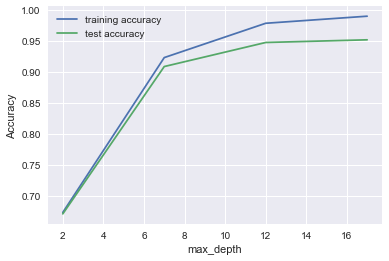

In [221]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


You can see that as we increase the value of max_depth, both train and test scores increase till a point, but after that test score starts to decrease. The ensemble tries to overfit as we increase the max_depth.

Thus, controlling the depth of the constituent trees will help reduce overfitting in the forest.

<hr>

### Tuning n_estimators

Let's try to find the optimum values for n_estimators and understand how the value of n_estimators impacts the overall accuracy. Notice that we'll specify an appropriately low value of max_depth, so that the trees do not overfit.
<br>


In [222]:
# GridSearchCV to find optimal n_estimators
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(20, 100, 20)}

# instantiate the model (note we are specifying a max_depth)
rf = RandomForestRegressor(max_depth=12)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="r2")
rf.fit(X_fifa_rf_train,y_fifa_rf_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=12,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': range(20, 100, 20)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='r2', verbose=0)

In [223]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,3.518707,0.053163,0.008976,0.004504,20,{'n_estimators': 20},0.951275,0.951778,0.952588,0.946615,0.952093,0.950870,0.002170,4,0.980556,0.980522,0.980721,0.980653,0.980195,0.980529,0.000181
1,7.084030,0.211104,0.020350,0.000484,40,{'n_estimators': 40},0.951945,0.952807,0.954131,0.949655,0.953830,0.952474,0.001607,3,0.981845,0.982441,0.981770,0.981626,0.981668,0.981870,0.000296
2,10.712699,0.212682,0.029726,0.000386,60,{'n_estimators': 60},0.952326,0.952958,0.955428,0.950011,0.955452,0.953235,0.002050,2,0.982286,0.982179,0.982054,0.982185,0.981934,0.982128,0.000122
3,13.977022,0.041177,0.040297,0.002551,80,{'n_estimators': 80},0.953328,0.953728,0.956336,0.950481,0.955380,0.953851,0.002008,1,0.982531,0.982590,0.982443,0.982350,0.982107,0.982404,0.000169


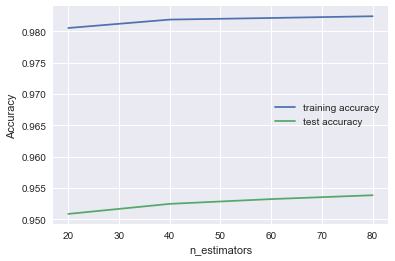

In [224]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


<hr>

### Tuning max_features

Let's see how the model performance varies with ```max_features```, which is the maximum numbre of features considered for splitting at a node.

In [225]:
# GridSearchCV to find optimal max_features
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_features': [4, 8, 14, 20, 24]}

# instantiate the model
rf = RandomForestRegressor(max_depth=12)


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="r2")
rf.fit(X_fifa_rf_train,y_fifa_rf_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=12,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_features': [4, 8, 14, 20, 24]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='r2', verbose=0)

In [226]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.139634,0.015726,0.006993,0.000879,4,{'max_features': 4},0.915791,0.917188,0.923922,0.916149,0.920969,0.918804,0.003150,5,0.952870,0.949490,0.953302,0.953204,0.953090,0.952391,0.001458
1,0.221027,0.004398,0.006582,0.000484,8,{'max_features': 8},0.941840,0.946718,0.947210,0.940528,0.943227,0.943905,0.002645,4,0.970586,0.972335,0.969507,0.969269,0.970781,0.970496,0.001092
2,0.369810,0.021818,0.007181,0.000977,14,{'max_features': 14},0.949054,0.950281,0.952856,0.948040,0.949462,0.949939,0.001628,3,0.977363,0.974696,0.975469,0.975381,0.975917,0.975765,0.000890
3,0.498023,0.028494,0.006393,0.000491,20,{'max_features': 20},0.949628,0.951150,0.952990,0.949621,0.953765,0.951431,0.001702,2,0.978083,0.977302,0.976114,0.977107,0.977719,0.977265,0.000667
4,0.544770,0.005952,0.006379,0.000490,24,{'max_features': 24},0.949267,0.951494,0.956021,0.951985,0.952227,0.952199,0.002180,1,0.978160,0.977517,0.978704,0.978051,0.976982,0.977883,0.000587


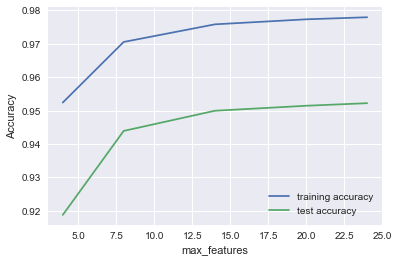

In [227]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


Apparently, the training and test scores *both* seem to increase as we increase max_features, and the model doesn't seem to overfit more with increasing max_features. Think about why that might be the case.

### Tuning min_samples_leaf

The hyperparameter **min_samples_leaf** is the minimum number of samples required to be at a leaf node:
- If int, then consider min_samples_leaf as the minimum number.
- If float, then min_samples_leaf is a percentage and ceil(min_samples_leaf * n_samples) are the minimum number of samples for each node.

Let's now check the optimum value for min samples leaf in our case.

In [228]:
# GridSearchCV to find optimal min_samples_leaf
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(25, 300, 50)}

# instantiate the model
rf = RandomForestRegressor()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="r2")
rf.fit(X_fifa_rf_train,y_fifa_rf_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_leaf': range(25, 300, 50)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='r2', verbose=0)

In [229]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.291148,0.025069,0.004997,0.000017,25,{'min_samples_leaf': 25},0.933235,0.937819,0.940224,0.929785,0.937933,0.935799,0.003767,1,0.950412,0.951833,0.950351,0.951624,0.950518,0.950947,0.000643
1,0.968441,0.006932,0.004582,0.000487,75,{'min_samples_leaf': 75},0.897489,0.899919,0.907488,0.889422,0.902635,0.899391,0.005989,2,0.911313,0.909296,0.908293,0.909141,0.908416,0.909292,0.001084
2,0.818986,0.010184,0.004388,0.000489,125,{'min_samples_leaf': 125},0.869357,0.875321,0.878573,0.859956,0.866954,0.870033,0.006517,3,0.883447,0.881565,0.877341,0.880166,0.869406,0.878385,0.004912
3,0.766351,0.030315,0.004599,0.001011,175,{'min_samples_leaf': 175},0.819620,0.844995,0.850813,0.819150,0.845536,0.836023,0.013737,4,0.837605,0.848700,0.848083,0.841536,0.845441,0.844273,0.004182
4,0.666446,0.011041,0.003799,0.000730,225,{'min_samples_leaf': 225},0.812695,0.820567,0.822815,0.808048,0.822972,0.817420,0.006000,5,0.828892,0.823007,0.817652,0.827083,0.819220,0.823171,0.004339


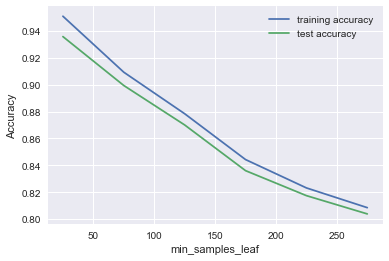

In [230]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

You can see that the model starts of overfit as you decrease the value of min_samples_leaf. 

### Tuning min_samples_split

Let's now look at the performance of the ensemble as we vary min_samples_split.

In [231]:
# GridSearchCV to find optimal min_samples_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(25, 300, 50)}

# instantiate the model
rf = RandomForestRegressor()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="r2")
rf.fit(X_fifa_rf_train,y_fifa_rf_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'min_samples_split': range(25, 300, 50)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='r2', verbose=0)

In [232]:
# scores of GridSearch CV
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.662249,0.029504,0.006188,0.000394,25,{'min_samples_split': 25},0.946362,0.951867,0.951731,0.945015,0.950698,0.949135,0.002874,1,0.974353,0.974992,0.974644,0.973854,0.973383,0.974245,0.000570
1,1.295156,0.033871,0.004600,0.000486,75,{'min_samples_split': 75},0.928402,0.933995,0.936036,0.927075,0.932155,0.931533,0.003359,2,0.947825,0.948130,0.948447,0.949295,0.945975,0.947934,0.001096
2,1.126389,0.005296,0.004207,0.000389,125,{'min_samples_split': 125},0.915780,0.920069,0.923525,0.912361,0.919186,0.918184,0.003815,3,0.931816,0.931744,0.931797,0.932766,0.927649,0.931154,0.001793
3,1.026134,0.005716,0.004790,0.000384,175,{'min_samples_split': 175},0.902264,0.913331,0.917849,0.902285,0.910861,0.909318,0.006172,4,0.917106,0.921653,0.921866,0.920235,0.916980,0.919568,0.002137
4,0.990176,0.065620,0.004384,0.000491,225,{'min_samples_split': 225},0.892720,0.899767,0.908664,0.889321,0.901166,0.898328,0.006775,5,0.907976,0.907580,0.910653,0.908480,0.904332,0.907804,0.002035


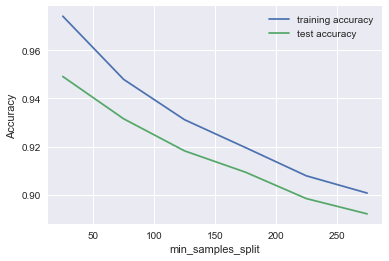

In [233]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

<hr>

## Grid Search to Find Optimal Hyperparameters

We can now find the optimal hyperparameters using GridSearchCV.

In [234]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [8,10,12],
    'min_samples_leaf': range(25, 125, 50),
    'min_samples_split': range(25, 125, 50),
    'n_estimators': [60,100,140], 
    'max_features': [10,14]
}
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 5, n_jobs = -1,verbose = 1)

In [235]:
# Fit the grid search to the data
grid_search.fit(X_fifa_rf_train,y_fifa_rf_train)

Fitting 5 folds for each of 72 candidates, totalling 360 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   27.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 360 out of 360 | elapsed:  4.2min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': [8, 10, 12], 'min_samples_leaf': range(25, 125, 50), 'min_samples_split': range(25, 125, 50), 'n_estimators': [60, 100, 140], 'max_features': [10, 14]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [236]:
# printing the optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.947566851322731 using {'max_depth': 12, 'max_features': 14, 'min_samples_leaf': 25, 'min_samples_split': 25, 'n_estimators': 140}


**Fitting the final model with the best parameters obtained from grid search.**

In [237]:
# model with the best hyperparameters
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestRegressor(bootstrap=True,
                             max_depth=12,
                             min_samples_leaf=25, 
                             min_samples_split=25,
                             max_features=14,
                             n_estimators=140)

In [238]:
# fit
rfc.fit(X_fifa_rf_train,y_fifa_rf_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=12,
           max_features=14, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=25,
           min_samples_split=25, min_weight_fraction_leaf=0.0,
           n_estimators=140, n_jobs=None, oob_score=False,
           random_state=None, verbose=0, warm_start=False)

In [239]:
# accuracy score
rfc.score(X_fifa_rf_test, y_fifa_rf_test)

0.9548934206554174

In [240]:
# Making predictions
y_pred_rf = rfc.predict(X_fifa_rf_test)

## Model Evaluation: Random Forest

#### Plotting the actual and predicted price values from the test dataset so check the likeness

Text(0,0.5,'Views')

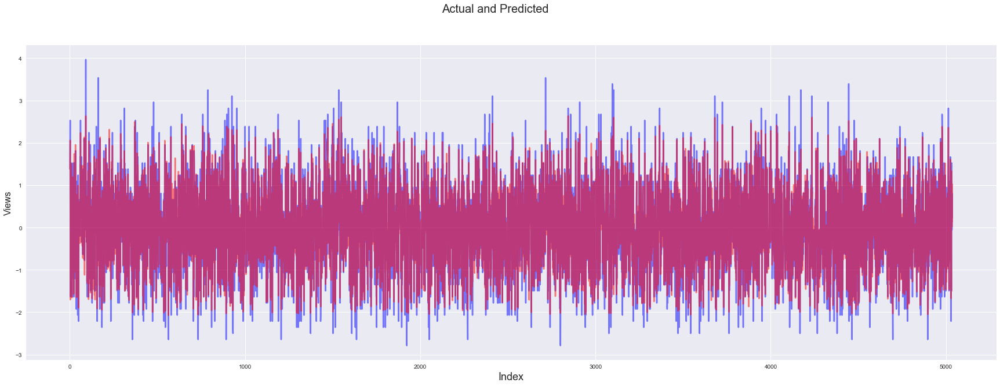

In [241]:
#Actual vs Predicted
c = [i for i in range(1,5037,1)]
fig = plt.figure(figsize=(30,10))
plt.plot(c,y_fifa_rf_test, color="blue", alpha = 0.5, linewidth=2.5, linestyle="-")
plt.plot(c,y_pred_rf, color="red",  alpha = 0.5, linewidth=2.5, linestyle="-")
fig.suptitle('Actual and Predicted', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                               # X-label
plt.ylabel('Views', fontsize=16)                               # Y-label

#### Drawing a scatter plot with actual and predicted price values from the test dataset to check the spread

Text(0,0.5,'y_pred')

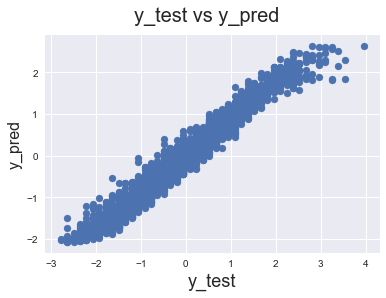

In [242]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_fifa_rf_test,y_pred_rf)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

#### Drawing a scatter plot of the error terms to check the spread to ensure that the error terms have constant variance (homoscedasticity). The variance doesn't increase (or decrease) or follow a pattern as the error values change.

Text(0,0.5,'ytest-ypred')

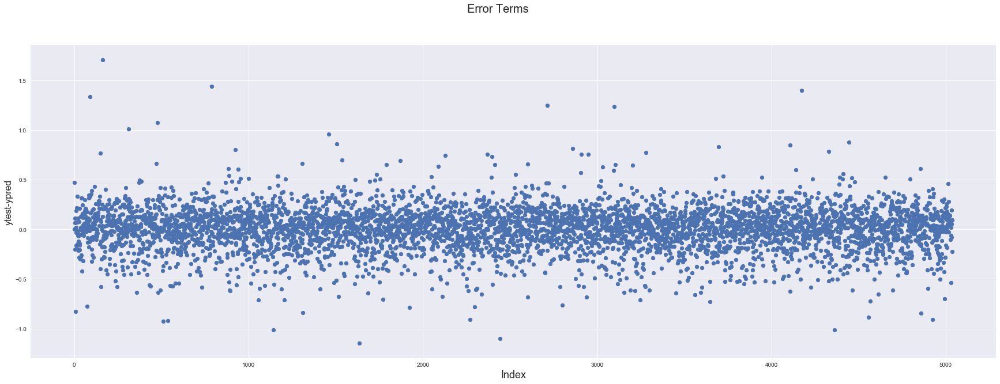

In [243]:
# Error terms
fig = plt.figure(figsize=(30,10))
c = [i for i in range(1,5037,1)]
plt.scatter(c,y_fifa_rf_test - y_pred_rf)

fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                      # X-label
plt.ylabel('ytest-ypred', fontsize=16)                # Y-label

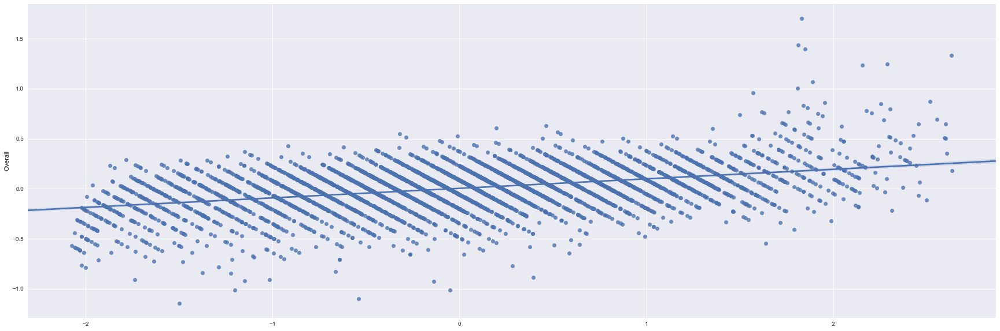

In [244]:
fig = plt.figure(figsize=(30,10))
sns.regplot(y_pred_rf, (y_fifa_rf_test - y_pred_rf))
plt.show()

#### Plotting the distribution of the error terms

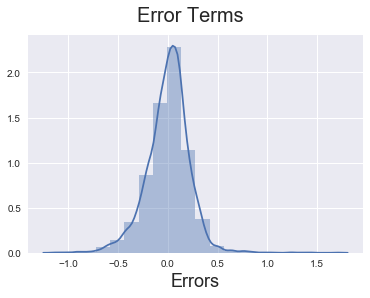

In [245]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_fifa_rf_test-y_pred_rf), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18)                         # X-label
plt.show()

#### Plotting a line for the scatter plot including actual and predicted prices from test dataset. Overall we have a pretty linear spread

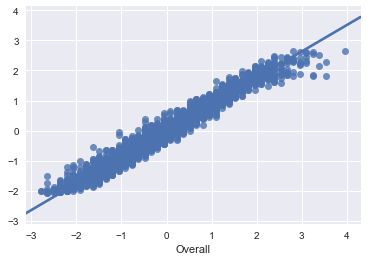

In [246]:
sns.regplot(y_fifa_rf_test, y_pred_rf)
plt.show()

#### Testing the r2 score and mse score of the model on the test dataset

In [247]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

print('R2 Score: {}'.format(r2_score(y_fifa_rf_test, y_pred_rf)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_fifa_rf_test, y_pred_rf)))

R2 Score: 0.9548934206554173
Mean Squared Error: 0.04704777512016145


### Determining Features Importance based on coefficients for Random Forest Model

In [248]:
feature_importances = pd.DataFrame(rfc.feature_importances_,
                                   index = X_fifa_rf_train.columns,
                                    columns=['importance']).sort_values('importance', 
                                                                        ascending=False).reset_index()
feature_importances

,index,importance
0,Reactions,1.614260e-01
1,Composure,1.170564e-01
2,BallControl,1.063693e-01
3,Special,9.193342e-02
4,ShortPassing,4.988782e-02
5,StandingTackle,3.847444e-02
6,Good_Yrs_left,3.824078e-02
7,Dribbling,3.446549e-02
8,Interceptions,2.972254e-02
9,ShotPower,2.913136e-02


### Plotting the Features in descending order of Importance based on coefficients for Ridge

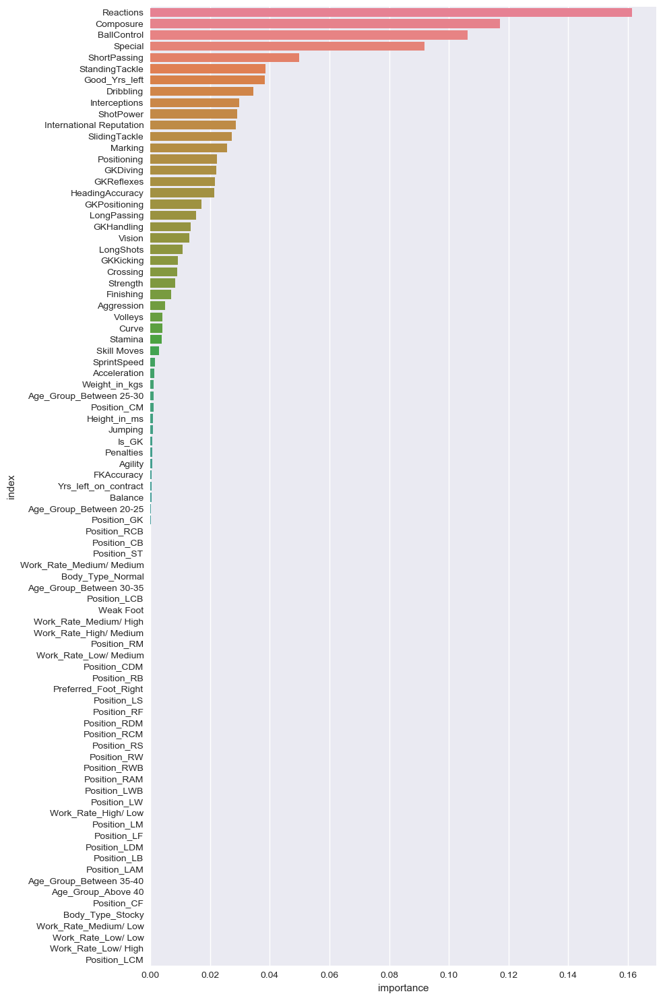

In [249]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='index', x='importance', palette='husl', data=feature_importances, estimator=np.sum)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

# Clustering Players of a kind

In [299]:
fifa_cls.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M,Is_GK,Player_Type
0,L. Messi,31,Between 30-35,4,Argentina,94,94,FC Barcelona,2202,Left,5.0,4.0,4.0,Medium/ Medium,Lean,RF,10.0,2004,2021,2.890372,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,6.338594,4.714025,5.427150,0,Forward
1,Cristiano Ronaldo,33,Between 30-35,2,Portugal,94,94,Juventus,2228,Right,5.0,4.0,5.0,High/ Low,Lean,ST,7.0,2018,2022,1.609438,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,6.006353,4.356709,4.852811,0,Forward
2,Neymar Jr,26,Between 25-30,9,Brazil,92,93,Paris Saint-Germain,2143,Right,5.0,5.0,5.0,High/ Medium,Lean,LW,10.0,2017,2022,1.791759,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,5.673323,4.783316,5.434159,0,Forward
3,De Gea,27,Between 25-30,8,Spain,91,93,Manchester United,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,2011,2020,2.302585,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,5.564520,4.290459,4.938781,1,Goalkeeper
4,K. De Bruyne,27,Between 25-30,8,Belgium,91,92,Manchester City,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,2015,2023,2.197225,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,5.874931,4.634729,5.285232,0,Midfielder


### Creating a column called `Player_Type`

*Possible values:*
 - Forward
 - Midfielder
 - Defender
 - Goalkeeper

In [300]:
fwd_pos = ['ST','RW','LW','RS','LS','CF','RF','LF']
gk_pos =  ['GK']
df_pos =  ['CB','LB','RB','RCB','LCB','RWB','LWB']
md_pos =  ['CM','RM','LM','CAM','CDM','LCM','RCM','RDM','LDM','RAM','LAM']

def player_type(pstn):
    if pstn in (fwd_pos):
        player_type = 'Forward'
    elif pstn in (df_pos):
        player_type = 'Defender'
    elif pstn in (md_pos):
        player_type = 'Midfielder'
    else:    
        player_type = 'Goalkeeper'
    return player_type

In [301]:
fifa_cls['Player_Type'] = fifa_cls['Position'].apply(lambda x:player_type(x))

fifa_cls.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M,Is_GK,Player_Type
0,L. Messi,31,Between 30-35,4,Argentina,94,94,FC Barcelona,2202,Left,5.0,4.0,4.0,Medium/ Medium,Lean,RF,10.0,2004,2021,2.890372,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,6.338594,4.714025,5.427150,0,Forward
1,Cristiano Ronaldo,33,Between 30-35,2,Portugal,94,94,Juventus,2228,Right,5.0,4.0,5.0,High/ Low,Lean,ST,7.0,2018,2022,1.609438,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,6.006353,4.356709,4.852811,0,Forward
2,Neymar Jr,26,Between 25-30,9,Brazil,92,93,Paris Saint-Germain,2143,Right,5.0,5.0,5.0,High/ Medium,Lean,LW,10.0,2017,2022,1.791759,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,5.673323,4.783316,5.434159,0,Forward
3,De Gea,27,Between 25-30,8,Spain,91,93,Manchester United,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,2011,2020,2.302585,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,5.564520,4.290459,4.938781,1,Goalkeeper
4,K. De Bruyne,27,Between 25-30,8,Belgium,91,92,Manchester City,2281,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,2015,2023,2.197225,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,5.874931,4.634729,5.285232,0,Midfielder


In [306]:
cluster_columns = ['Name', 'Player_Type', 'Overall', 'Good_Yrs_left', 'Skill Moves','Body Type']

fifa_cluster_df = fifa_cls[cluster_columns]
fifa_cluster_df.head()

,Name,Player_Type,Overall,Good_Yrs_left,Skill Moves,Body Type
0,L. Messi,Forward,94,4,4.0,Lean
1,Cristiano Ronaldo,Forward,94,2,5.0,Lean
2,Neymar Jr,Forward,92,9,5.0,Lean
3,De Gea,Goalkeeper,91,8,1.0,Lean
4,K. De Bruyne,Midfielder,91,8,4.0,Normal


### Converting some Body Type to Numeric

In [307]:
# Import label encoder 
from sklearn import preprocessing 
  
# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder() 
  
# Encode labels in column 'species'. 
fifa_cluster_df['Body Type']= label_encoder.fit_transform(fifa_cluster_df['Body Type']) 
  
fifa_cluster_df['Body Type'].unique()

array([0, 1, 2], dtype=int64)

In [308]:
fifa_cluster_df = fifa_cluster_df.loc[fifa_cluster_df['Overall'] >= 80]
fifa_cluster_df.head()

,Name,Player_Type,Overall,Good_Yrs_left,Skill Moves,Body Type
0,L. Messi,Forward,94,4,4.0,0
1,Cristiano Ronaldo,Forward,94,2,5.0,0
2,Neymar Jr,Forward,92,9,5.0,0
3,De Gea,Goalkeeper,91,8,1.0,0
4,K. De Bruyne,Midfielder,91,8,4.0,1


## Forming Clusters of Forwards

### Creating dataframes for different player types

In [366]:
fifa_cluster_fwd = fifa_cluster_df.loc[fifa_cluster_df['Player_Type'] == 'Forward'].reset_index()
# removing columns
fifa_cluster_fwd = fifa_cluster_fwd.drop(['Player_Type','index'], axis=1)
fifa_cluster_fwd.head()

,Name,Overall,Good_Yrs_left,Skill Moves,Body Type
0,L. Messi,94,4,4.0,0
1,Cristiano Ronaldo,94,2,5.0,0
2,Neymar Jr,92,9,5.0,0
3,E. Hazard,91,8,4.0,1
4,L. Suárez,91,4,3.0,1


### Scaling the RFM data

In [367]:
# Standardize all parameters
fifa_cluster_fwd_norm = fifa_cluster_fwd.drop("Name", axis =1)
fifa_cluster_fwd_norm.head()

,Overall,Good_Yrs_left,Skill Moves,Body Type
0,94,4,4.0,0
1,94,2,5.0,0
2,92,9,5.0,0
3,91,8,4.0,1
4,91,4,3.0,1


In [368]:
from sklearn.preprocessing import StandardScaler
Scaler = StandardScaler()

num_vars = ['Overall', 'Good_Yrs_left', 'Skill Moves', 'Body Type']

fifa_cluster_fwd_norm[num_vars] = Scaler.fit_transform(fifa_cluster_fwd_norm[num_vars])
fifa_cluster_fwd_norm.head()

,Overall,Good_Yrs_left,Skill Moves,Body Type
0,3.305098,-0.887640,0.439892,-1.227920
1,3.305098,-1.416545,1.927763,-1.227920
2,2.695008,0.434622,1.927763,-1.227920
3,2.389962,0.170169,0.439892,0.376748
4,2.389962,-0.887640,-1.047979,0.376748


## Hopkins Statistics:
The Hopkins statistic, is a statistic which gives a value which indicates the cluster tendency, in other words: how well the data can be clustered.

- If the value is between {0.01, ...,0.3}, the data is regularly spaced.

- If the value is around 0.5, it is random.

- If the value is between {0.7, ..., 0.99}, it has a high tendency to cluster.

In [369]:
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
import numpy as np
from math import isnan
 
def hopkins(X):
    d = X.shape[1]
    #d = len(vars) # columns
    n = len(X) # rows
    m = int(0.1 * n) 
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print(ujd, wjd)
        H = 0
 
    return H

In [372]:
hopkins(fifa_cluster_fwd_norm)

0.7511823045309344

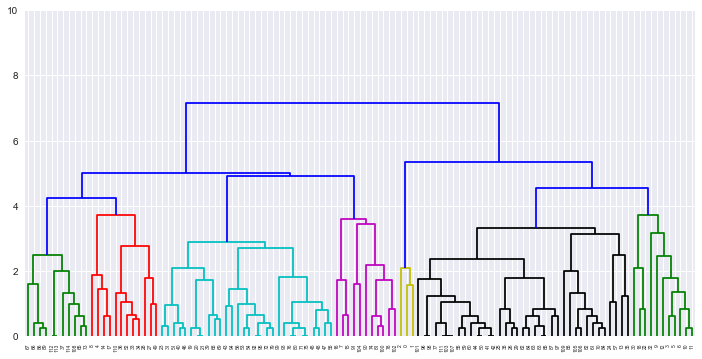

In [373]:
# with complete linkage
fig = plt.figure(figsize=(12,6))
mergings = linkage(fifa_cluster_fwd_norm, method = "complete", metric = "euclidean")
dendrogram(mergings, color_threshold = 4)
plt.ylim([0,10])
plt.show()

In [374]:
clusterCut

0      0
1      0
2      0
3      1
4      2
5      1
6      1
7      3
8      2
9      1
10     1
11     1
12     1
13     4
14     2
15     3
16     3
17     2
18     1
19     5
20     5
21     5
22     1
23     5
24     4
25     4
26     4
27     2
28     2
29     4
30     1
31     5
32     1
33     2
34     2
35     4
36     2
37     6
38     4
39     5
40     5
41     4
42     4
43     5
44     4
45     5
46     5
47     5
48     5
49     2
50     4
51     5
52     2
53     5
54     5
55     4
56     5
57     4
58     5
59     4
60     4
61     4
62     4
63     4
64     4
65     6
66     6
67     6
68     5
69     5
70     4
71     5
72     5
73     6
74     3
75     5
76     5
77     4
78     3
79     5
80     5
81     3
82     4
83     4
84     4
85     4
86     6
87     4
88     4
89     6
90     3
91     3
92     5
93     5
94     5
95     5
96     4
97     4
98     4
99     5
100    3
101    4
102    3
103    4
104    3
105    4
106    4
107    4
108    6
109    4
110    2
1

In [375]:
clusterCut = pd.Series(cut_tree(mergings, n_clusters = 7).reshape(-1,))
fwd_hc = pd.concat([fifa_cluster_fwd, clusterCut], axis=1)
fwd_hc.columns = ['Name', 'Overall', 'Good_Yrs_left', 'Skill Moves', 'Body Type', 'ClusterID']
fwd_hc.head()

,Name,Overall,Good_Yrs_left,Skill Moves,Body Type,ClusterID
0,L. Messi,94,4,4.0,0,0
1,Cristiano Ronaldo,94,2,5.0,0,0
2,Neymar Jr,92,9,5.0,0,0
3,E. Hazard,91,8,4.0,1,1
4,L. Suárez,91,4,3.0,1,2


In [378]:
#exporting into csv
#fwd_hc.to_csv("fwd_hc.csv", sep=',')

In [415]:
#summarise
fwd_hc_overall = pd.DataFrame(fwd_hc.groupby(["ClusterID"])['Overall'].mean())
fwd_hc_Good_Yrs_left = pd.DataFrame(fwd_hc.groupby(["ClusterID"])['Good_Yrs_left'].median())
fwd_hc_Skill_Moves = pd.DataFrame(fwd_hc.groupby(["ClusterID"])['Skill Moves'].median())
fwd_hc_Body_Type = pd.DataFrame(fwd_hc.groupby(["ClusterID"])['Body Type'].median())

In [420]:
df_fwd = pd.concat([pd.Series([0,1,2,3,4,5,6]), fwd_hc_overall, fwd_hc_Good_Yrs_left, fwd_hc_Skill_Moves, fwd_hc_Body_Type], axis=1)
df_fwd.columns = ["ClusterID", "Cluster_Overall", "Cluster_Good_Yrs_left", "Cluster_Skill_Moves", "Cluster_Body_Type"]
df_fwd

,ClusterID,Cluster_Overall,Cluster_Good_Yrs_left,Cluster_Skill_Moves,Cluster_Body_Type
0,0,93.333333,4,5.0,0
1,1,87.727273,8,4.0,1
2,2,85.166667,4,3.0,0
3,3,82.363636,10,3.0,2
4,4,81.945946,7,4.0,1
5,5,82.200000,11,4.0,0
6,6,81.181818,3,3.0,1


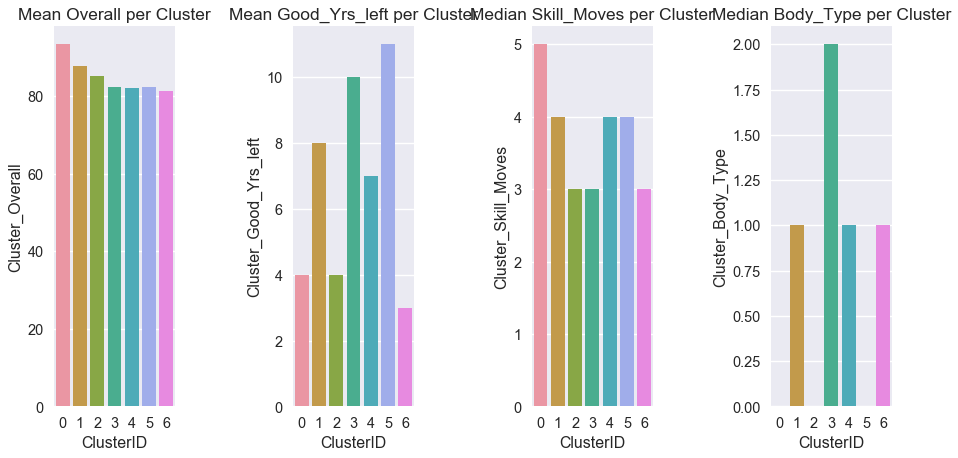

In [422]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("darkgrid") # white/whitegrid/dark/darkgrid/ticks
sns.set_context("talk") # talk/poster/paper

# subplot 1
plt.subplot(1, 4, 1)
sns.barplot(x=df_fwd.ClusterID, y=df_fwd.Cluster_Overall)
# plot title
plt.title("Mean Overall per Cluster")

# subplot 2
plt.subplot(1, 4, 2)
sns.barplot(x=df_fwd.ClusterID, y=df_fwd.Cluster_Good_Yrs_left)
# plot title
plt.title("Mean Good_Yrs_left per Cluster")

# subplot 2
plt.subplot(1, 4, 3)
sns.barplot(x=df_fwd.ClusterID, y=df_fwd.Cluster_Skill_Moves)
# plot title
plt.title("Median Skill_Moves per Cluster")

# subplot 2
plt.subplot(1, 4, 4)
sns.barplot(x=df_fwd.ClusterID, y=df_fwd.Cluster_Body_Type)
# plot title
plt.title("Median Body_Type per Cluster")

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()


In [429]:
fwd_final_cluster = pd.merge(fwd_hc,df_fwd, how='inner', on='ClusterID')
fwd_final_cluster = fwd_final_cluster[['Name','Overall','Cluster_Overall','Good_Yrs_left','Cluster_Good_Yrs_left','Skill Moves', \
                                      'Cluster_Skill_Moves','Body Type','Cluster_Body_Type','ClusterID']]
fwd_final_cluster.head()

,Name,Overall,Cluster_Overall,Good_Yrs_left,Cluster_Good_Yrs_left,Skill Moves,Cluster_Skill_Moves,Body Type,Cluster_Body_Type,ClusterID
0,L. Messi,94,93.333333,4,4,4.0,5.0,0,0,0
1,Cristiano Ronaldo,94,93.333333,2,4,5.0,5.0,0,0,0
2,Neymar Jr,92,93.333333,9,4,5.0,5.0,0,0,0
3,E. Hazard,91,87.727273,8,8,4.0,4.0,1,1,1
4,R. Lewandowski,90,87.727273,6,8,4.0,4.0,1,1,1


In [430]:
#exporting into csv
fwd_final_cluster.to_csv("fwd_final_cluster.csv", sep=',')

## Forming Clusters of Midfielders

### Creating dataframes for different player types

In [389]:
fifa_cluster_mdf = fifa_cluster_df.loc[fifa_cluster_df['Player_Type'] == 'Midfielder'].reset_index()
# removing columns
fifa_cluster_mdf = fifa_cluster_mdf.drop(['Player_Type','index'], axis=1)
fifa_cluster_mdf.head()

,Name,Overall,Good_Yrs_left,Skill Moves,Body Type
0,K. De Bruyne,91,8,4.0,1
1,L. Modrić,91,3,4.0,0
2,T. Kroos,90,7,3.0,1
3,David Silva,90,3,4.0,1
4,N. Kanté,89,8,2.0,0


### Scaling the RFM data

In [390]:
# Standardize all parameters
fifa_cluster_mdf_norm = fifa_cluster_mdf.drop("Name", axis =1)
fifa_cluster_mdf_norm.head()

,Overall,Good_Yrs_left,Skill Moves,Body Type
0,91,8,4.0,1
1,91,3,4.0,0
2,90,7,3.0,1
3,90,3,4.0,1
4,89,8,2.0,0


In [391]:
from sklearn.preprocessing import StandardScaler
Scaler = StandardScaler()

num_vars = ['Overall', 'Good_Yrs_left', 'Skill Moves', 'Body Type']

fifa_cluster_mdf_norm[num_vars] = Scaler.fit_transform(fifa_cluster_mdf_norm[num_vars])
fifa_cluster_mdf_norm.head()

,Overall,Good_Yrs_left,Skill Moves,Body Type
0,3.473123,0.001312,0.531853,0.718795
1,3.473123,-1.422249,0.531853,-0.958394
2,3.063966,-0.283400,-0.825936,0.718795
3,3.063966,-1.422249,0.531853,0.718795
4,2.654809,0.001312,-2.183725,-0.958394


## Hopkins Statistics:
The Hopkins statistic, is a statistic which gives a value which indicates the cluster tendency, in other words: how well the data can be clustered.

- If the value is between {0.01, ...,0.3}, the data is regularly spaced.

- If the value is around 0.5, it is random.

- If the value is between {0.7, ..., 0.99}, it has a high tendency to cluster.

In [392]:
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
import numpy as np
from math import isnan
 
def hopkins(X):
    d = X.shape[1]
    #d = len(vars) # columns
    n = len(X) # rows
    m = int(0.1 * n) 
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print(ujd, wjd)
        H = 0
 
    return H

In [393]:
hopkins(fifa_cluster_mdf_norm)

0.748371579468552

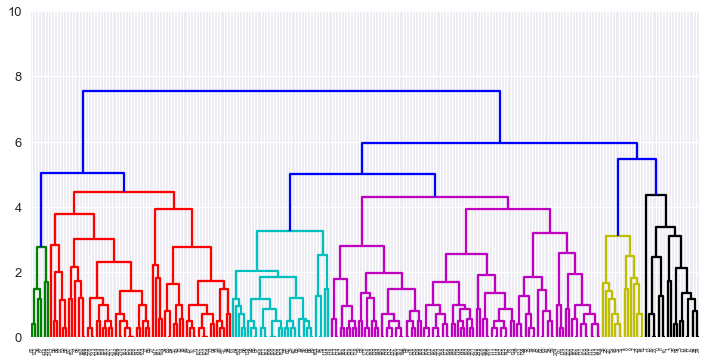

In [408]:
# with complete linkage
fig = plt.figure(figsize=(12,6))
mergings = linkage(fifa_cluster_mdf_norm, method = "complete", metric = "euclidean")
dendrogram(mergings, color_threshold = 5)
plt.ylim([0,10])
plt.show()

In [409]:
clusterCut = pd.Series(cut_tree(mergings, n_clusters = 6).reshape(-1,))
mdf_hc = pd.concat([fifa_cluster_mdf, clusterCut], axis=1)
mdf_hc.columns = ['Name', 'Overall', 'Good_Yrs_left', 'Skill Moves', 'Body Type', 'ClusterID']
mdf_hc.head()

,Name,Overall,Good_Yrs_left,Skill Moves,Body Type,ClusterID
0,K. De Bruyne,91,8,4.0,1,0
1,L. Modrić,91,3,4.0,0,0
2,T. Kroos,90,7,3.0,1,1
3,David Silva,90,3,4.0,1,0
4,N. Kanté,89,8,2.0,0,1


In [431]:
#summarise
mdf_hc_overall = pd.DataFrame(mdf_hc.groupby(["ClusterID"])['Overall'].mean())
mdf_hc_Good_Yrs_left = pd.DataFrame(mdf_hc.groupby(["ClusterID"])['Good_Yrs_left'].median())
mdf_hc_Skill_Moves = pd.DataFrame(mdf_hc.groupby(["ClusterID"])['Skill Moves'].median())
mdf_hc_Body_Type = pd.DataFrame(mdf_hc.groupby(["ClusterID"])['Body Type'].median())

In [432]:
df_mdf = pd.concat([pd.Series([0,1,2,3,4,5]), mdf_hc_overall, mdf_hc_Good_Yrs_left, mdf_hc_Skill_Moves, mdf_hc_Body_Type], axis=1)
df_mdf.columns = ["ClusterID", "Cluster_Overall", "Cluster_Good_Yrs_left", "Cluster_Skill_Moves", "Cluster_Body_Type"]
df_mdf

,ClusterID,Cluster_Overall,Cluster_Good_Yrs_left,Cluster_Skill_Moves,Cluster_Body_Type
0,0,87.388889,8.0,4.0,0
1,1,86.500000,6.0,3.0,0
2,2,82.271186,5.0,4.0,1
3,3,81.170455,9.0,3.0,0
4,4,82.166667,2.5,2.0,1
5,5,82.218750,10.5,4.0,0


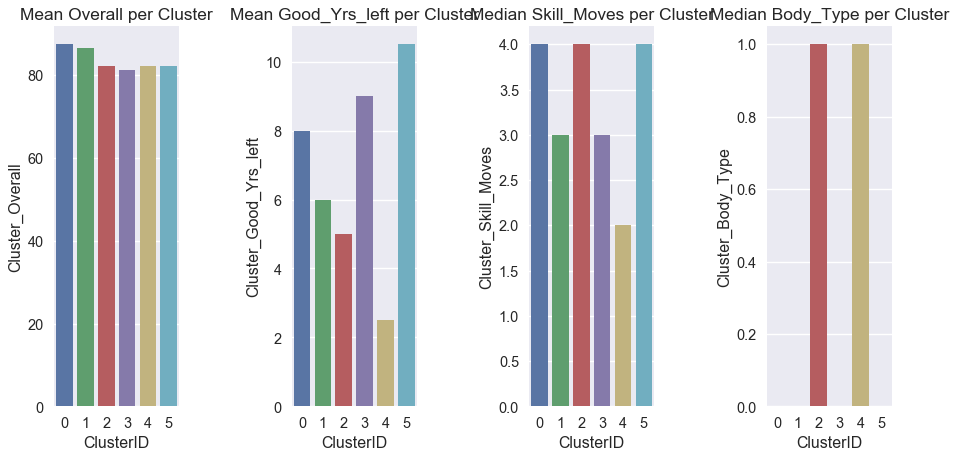

In [433]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("darkgrid") # white/whitegrid/dark/darkgrid/ticks
sns.set_context("talk") # talk/poster/paper

# subplot 1
plt.subplot(1, 4, 1)
sns.barplot(x=df_mdf.ClusterID, y=df_mdf.Cluster_Overall)
# plot title
plt.title("Mean Overall per Cluster")

# subplot 2
plt.subplot(1, 4, 2)
sns.barplot(x=df_mdf.ClusterID, y=df_mdf.Cluster_Good_Yrs_left)
# plot title
plt.title("Mean Good_Yrs_left per Cluster")

# subplot 2
plt.subplot(1, 4, 3)
sns.barplot(x=df_mdf.ClusterID, y=df_mdf.Cluster_Skill_Moves)
# plot title
plt.title("Median Skill_Moves per Cluster")

# subplot 2
plt.subplot(1, 4, 4)
sns.barplot(x=df_mdf.ClusterID, y=df_mdf.Cluster_Body_Type)
# plot title
plt.title("Median Body_Type per Cluster")

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

In [435]:
mdf_final_cluster = pd.merge(mdf_hc,df_mdf, how='inner', on='ClusterID')
mdf_final_cluster = mdf_final_cluster[['Name','Overall','Cluster_Overall','Good_Yrs_left','Cluster_Good_Yrs_left','Skill Moves', \
                                      'Cluster_Skill_Moves','Body Type','Cluster_Body_Type','ClusterID']]
mdf_final_cluster.head()

,Name,Overall,Cluster_Overall,Good_Yrs_left,Cluster_Good_Yrs_left,Skill Moves,Cluster_Skill_Moves,Body Type,Cluster_Body_Type,ClusterID
0,K. De Bruyne,91,87.388889,8,8.0,4.0,4.0,1,0,0
1,L. Modrić,91,87.388889,3,8.0,4.0,4.0,0,0,0
2,David Silva,90,87.388889,3,8.0,4.0,4.0,1,0,0
3,A. Griezmann,89,87.388889,8,8.0,4.0,4.0,0,0,0
4,K. Mbappé,88,87.388889,16,8.0,5.0,4.0,0,0,0


In [437]:
#exporting into csv
mdf_final_cluster.to_csv("mdf_final_cluster.csv", sep=',')

## Forming Clusters of Defenders

### Creating dataframes for different player types

In [438]:
fifa_cluster_dfd = fifa_cluster_df.loc[fifa_cluster_df['Player_Type'] == 'Defender'].reset_index()
# removing columns
fifa_cluster_dfd = fifa_cluster_dfd.drop(['Player_Type','index'], axis=1)
fifa_cluster_dfd.head()

,Name,Overall,Good_Yrs_left,Skill Moves,Body Type
0,Sergio Ramos,91,3,3.0,1
1,D. Godín,90,3,2.0,0
2,G. Chiellini,89,2,2.0,1
3,M. Hummels,88,6,3.0,1
4,Marcelo,88,5,5.0,1


### Scaling the RFM data

In [439]:
# Standardize all parameters
fifa_cluster_dfd_norm = fifa_cluster_dfd.drop("Name", axis =1)
fifa_cluster_dfd_norm.head()

,Overall,Good_Yrs_left,Skill Moves,Body Type
0,91,3,3.0,1
1,90,3,2.0,0
2,89,2,2.0,1
3,88,6,3.0,1
4,88,5,5.0,1


In [440]:
from sklearn.preprocessing import StandardScaler
Scaler = StandardScaler()

num_vars = ['Overall', 'Good_Yrs_left', 'Skill Moves', 'Body Type']

fifa_cluster_dfd_norm[num_vars] = Scaler.fit_transform(fifa_cluster_dfd_norm[num_vars])
fifa_cluster_dfd_norm.head()

,Overall,Good_Yrs_left,Skill Moves,Body Type
0,3.601419,-1.176012,0.693967,0.463302
1,3.187558,-1.176012,-0.824714,-1.330508
2,2.773696,-1.450900,-0.824714,0.463302
3,2.359834,-0.351347,0.693967,0.463302
4,2.359834,-0.626235,3.731330,0.463302


## Hopkins Statistics:
The Hopkins statistic, is a statistic which gives a value which indicates the cluster tendency, in other words: how well the data can be clustered.

- If the value is between {0.01, ...,0.3}, the data is regularly spaced.

- If the value is around 0.5, it is random.

- If the value is between {0.7, ..., 0.99}, it has a high tendency to cluster.

In [441]:
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
import numpy as np
from math import isnan
 
def hopkins(X):
    d = X.shape[1]
    #d = len(vars) # columns
    n = len(X) # rows
    m = int(0.1 * n) 
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print(ujd, wjd)
        H = 0
 
    return H

In [442]:
hopkins(fifa_cluster_dfd_norm)

0.8501828687926142

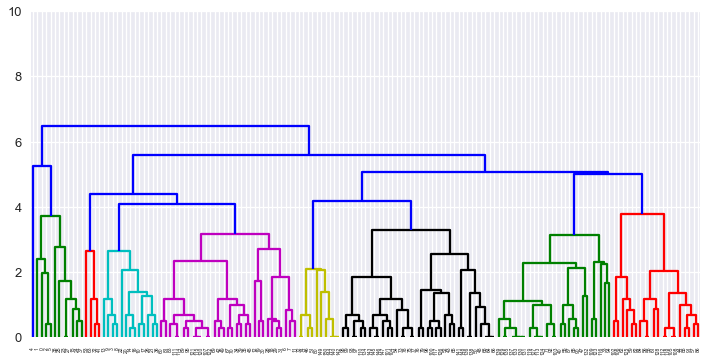

In [447]:
# with complete linkage
fig = plt.figure(figsize=(12,6))
mergings = linkage(fifa_cluster_dfd_norm, method = "complete", metric = "euclidean")
dendrogram(mergings, color_threshold = 4.01)
plt.ylim([0,10])
plt.show()

In [448]:
clusterCut = pd.Series(cut_tree(mergings, n_clusters = 8).reshape(-1,))
dfd_hc = pd.concat([fifa_cluster_dfd, clusterCut], axis=1)
dfd_hc.columns = ['Name', 'Overall', 'Good_Yrs_left', 'Skill Moves', 'Body Type', 'ClusterID']
dfd_hc.head()

,Name,Overall,Good_Yrs_left,Skill Moves,Body Type,ClusterID
0,Sergio Ramos,91,3,3.0,1,0
1,D. Godín,90,3,2.0,0,0
2,G. Chiellini,89,2,2.0,1,0
3,M. Hummels,88,6,3.0,1,1
4,Marcelo,88,5,5.0,1,2


In [449]:
#summarise
dfd_hc_overall = pd.DataFrame(dfd_hc.groupby(["ClusterID"])['Overall'].mean())
dfd_hc_Good_Yrs_left = pd.DataFrame(dfd_hc.groupby(["ClusterID"])['Good_Yrs_left'].median())
dfd_hc_Skill_Moves = pd.DataFrame(dfd_hc.groupby(["ClusterID"])['Skill Moves'].median())
dfd_hc_Body_Type = pd.DataFrame(dfd_hc.groupby(["ClusterID"])['Body Type'].median())

In [450]:
df_dfd = pd.concat([pd.Series([0,1,2,3,4,5,6,7]), dfd_hc_overall, dfd_hc_Good_Yrs_left, dfd_hc_Skill_Moves, dfd_hc_Body_Type], axis=1)
df_dfd.columns = ["ClusterID", "Cluster_Overall", "Cluster_Good_Yrs_left", "Cluster_Skill_Moves", "Cluster_Body_Type"]
df_dfd

,ClusterID,Cluster_Overall,Cluster_Good_Yrs_left,Cluster_Skill_Moves,Cluster_Body_Type
0,0,86.545455,2.0,2.0,0
1,1,83.659091,9.0,2.0,1
2,2,88.000000,5.0,5.0,1
3,3,82.750000,13.0,2.0,2
4,4,80.769231,9.0,3.0,1
5,5,81.200000,6.0,2.0,0
6,6,81.050000,11.0,3.0,0
7,7,81.200000,3.5,3.0,1


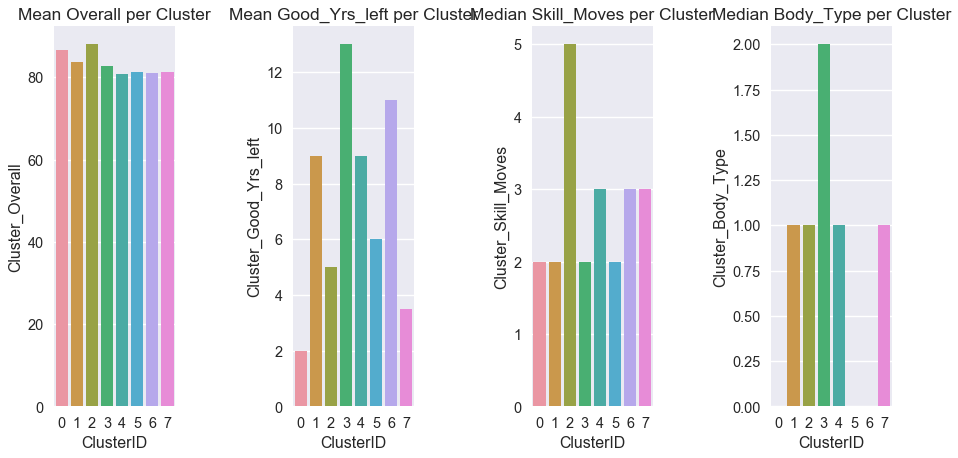

In [451]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("darkgrid") # white/whitegrid/dark/darkgrid/ticks
sns.set_context("talk") # talk/poster/paper

# subplot 1
plt.subplot(1, 4, 1)
sns.barplot(x=df_dfd.ClusterID, y=df_dfd.Cluster_Overall)
# plot title
plt.title("Mean Overall per Cluster")

# subplot 2
plt.subplot(1, 4, 2)
sns.barplot(x=df_dfd.ClusterID, y=df_dfd.Cluster_Good_Yrs_left)
# plot title
plt.title("Mean Good_Yrs_left per Cluster")

# subplot 2
plt.subplot(1, 4, 3)
sns.barplot(x=df_dfd.ClusterID, y=df_dfd.Cluster_Skill_Moves)
# plot title
plt.title("Median Skill_Moves per Cluster")

# subplot 2
plt.subplot(1, 4, 4)
sns.barplot(x=df_dfd.ClusterID, y=df_dfd.Cluster_Body_Type)
# plot title
plt.title("Median Body_Type per Cluster")

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

In [452]:
dfd_final_cluster = pd.merge(dfd_hc,df_dfd, how='inner', on='ClusterID')
dfd_final_cluster = dfd_final_cluster[['Name','Overall','Cluster_Overall','Good_Yrs_left','Cluster_Good_Yrs_left','Skill Moves', \
                                      'Cluster_Skill_Moves','Body Type','Cluster_Body_Type','ClusterID']]
dfd_final_cluster.head()

,Name,Overall,Cluster_Overall,Good_Yrs_left,Cluster_Good_Yrs_left,Skill Moves,Cluster_Skill_Moves,Body Type,Cluster_Body_Type,ClusterID
0,Sergio Ramos,91,86.545455,3,2.0,3.0,2.0,1,0,0
1,D. Godín,90,86.545455,3,2.0,2.0,2.0,0,0,0
2,G. Chiellini,89,86.545455,2,2.0,2.0,2.0,1,0,0
3,Thiago Silva,88,86.545455,2,2.0,2.0,2.0,1,0,0
4,L. Bonucci,86,86.545455,4,2.0,2.0,2.0,0,0,0


In [453]:
#exporting into csv
dfd_final_cluster.to_csv("dfd_final_cluster.csv", sep=',')

## Forming Clusters of Goalkeepers

### Creating dataframes for different player types

In [455]:
fifa_cluster_gk = fifa_cluster_df.loc[fifa_cluster_df['Player_Type'] == 'Goalkeeper'].reset_index()
# removing columns
fifa_cluster_gk = fifa_cluster_gk.drop(['Player_Type','index'], axis=1)
fifa_cluster_gk.head()

,Name,Overall,Good_Yrs_left,Skill Moves,Body Type
0,De Gea,91,8,1.0,0
1,J. Oblak,90,10,1.0,1
2,M. ter Stegen,89,9,1.0,1
3,T. Courtois,89,9,1.0,0
4,M. Neuer,89,3,1.0,1


### Scaling the RFM data

In [456]:
# Standardize all parameters
fifa_cluster_gk_norm = fifa_cluster_gk.drop("Name", axis =1)
fifa_cluster_gk_norm.head()

,Overall,Good_Yrs_left,Skill Moves,Body Type
0,91,8,1.0,0
1,90,10,1.0,1
2,89,9,1.0,1
3,89,9,1.0,0
4,89,3,1.0,1


In [457]:
from sklearn.preprocessing import StandardScaler
Scaler = StandardScaler()

num_vars = ['Overall', 'Good_Yrs_left', 'Skill Moves', 'Body Type']

fifa_cluster_gk_norm[num_vars] = Scaler.fit_transform(fifa_cluster_gk_norm[num_vars])
fifa_cluster_gk_norm.head()

,Overall,Good_Yrs_left,Skill Moves,Body Type
0,2.901547,0.497711,0.0,-1.508123
1,2.545497,0.984524,0.0,0.329045
2,2.189446,0.741118,0.0,0.329045
3,2.189446,0.741118,0.0,-1.508123
4,2.189446,-0.719320,0.0,0.329045


## Hopkins Statistics:
The Hopkins statistic, is a statistic which gives a value which indicates the cluster tendency, in other words: how well the data can be clustered.

- If the value is between {0.01, ...,0.3}, the data is regularly spaced.

- If the value is around 0.5, it is random.

- If the value is between {0.7, ..., 0.99}, it has a high tendency to cluster.

In [458]:
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
import numpy as np
from math import isnan
 
def hopkins(X):
    d = X.shape[1]
    #d = len(vars) # columns
    n = len(X) # rows
    m = int(0.1 * n) 
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print(ujd, wjd)
        H = 0
 
    return H

In [459]:
hopkins(fifa_cluster_gk_norm)

0.8357836047405449

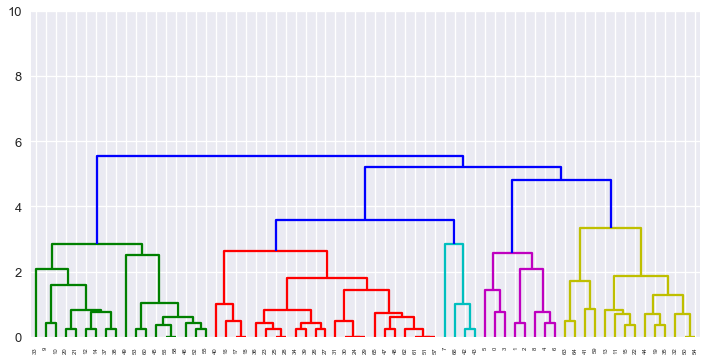

In [465]:
# with complete linkage
fig = plt.figure(figsize=(12,6))
mergings = linkage(fifa_cluster_gk_norm, method = "complete", metric = "euclidean")
dendrogram(mergings, color_threshold = 3.5)
plt.ylim([0,10])
plt.show()

In [466]:
clusterCut = pd.Series(cut_tree(mergings, n_clusters = 5).reshape(-1,))
gk_hc = pd.concat([fifa_cluster_gk, clusterCut], axis=1)
gk_hc.columns = ['Name', 'Overall', 'Good_Yrs_left', 'Skill Moves', 'Body Type', 'ClusterID']
gk_hc.head()

,Name,Overall,Good_Yrs_left,Skill Moves,Body Type,ClusterID
0,De Gea,91,8,1.0,0,0
1,J. Oblak,90,10,1.0,1,0
2,M. ter Stegen,89,9,1.0,1,0
3,T. Courtois,89,9,1.0,0,0
4,M. Neuer,89,3,1.0,1,0


In [467]:
#summarise
gk_hc_overall = pd.DataFrame(gk_hc.groupby(["ClusterID"])['Overall'].mean())
gk_hc_Good_Yrs_left = pd.DataFrame(gk_hc.groupby(["ClusterID"])['Good_Yrs_left'].median())
gk_hc_Skill_Moves = pd.DataFrame(gk_hc.groupby(["ClusterID"])['Skill Moves'].median())
gk_hc_Body_Type = pd.DataFrame(gk_hc.groupby(["ClusterID"])['Body Type'].median())

In [469]:
df_gk = pd.concat([pd.Series([0,1,2,3,4]), gk_hc_overall, gk_hc_Good_Yrs_left, gk_hc_Skill_Moves, gk_hc_Body_Type], axis=1)
df_gk.columns = ["ClusterID", "Cluster_Overall", "Cluster_Good_Yrs_left", "Cluster_Skill_Moves", "Cluster_Body_Type"]
df_gk

,ClusterID,Cluster_Overall,Cluster_Good_Yrs_left,Cluster_Skill_Moves,Cluster_Body_Type
0,0,88.875000,6,1.0,1
1,1,83.000000,-3,1.0,1
2,2,81.833333,9,1.0,1
3,3,81.857143,8,1.0,0
4,4,82.130435,4,1.0,1


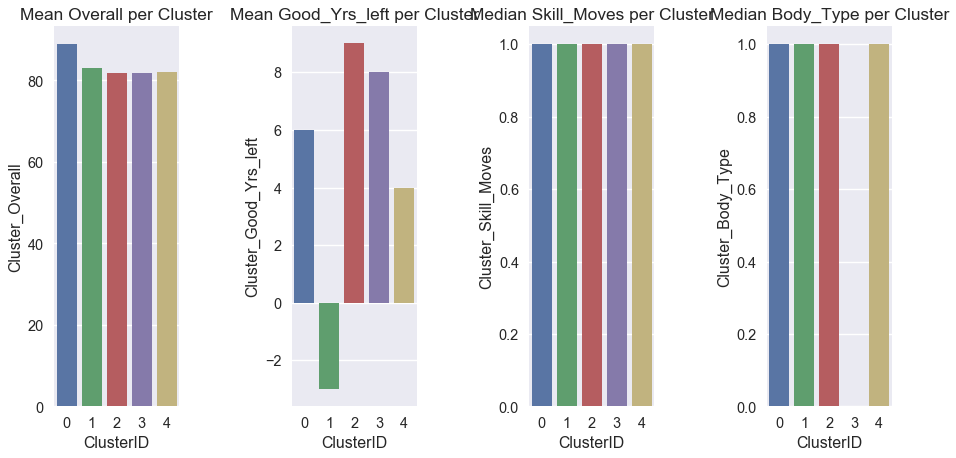

In [470]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k', frameon='True')
sns.set_style("darkgrid") # white/whitegrid/dark/darkgrid/ticks
sns.set_context("talk") # talk/poster/paper

# subplot 1
plt.subplot(1, 4, 1)
sns.barplot(x=df_gk.ClusterID, y=df_gk.Cluster_Overall)
# plot title
plt.title("Mean Overall per Cluster")

# subplot 2
plt.subplot(1, 4, 2)
sns.barplot(x=df_gk.ClusterID, y=df_gk.Cluster_Good_Yrs_left)
# plot title
plt.title("Mean Good_Yrs_left per Cluster")

# subplot 2
plt.subplot(1, 4, 3)
sns.barplot(x=df_gk.ClusterID, y=df_gk.Cluster_Skill_Moves)
# plot title
plt.title("Median Skill_Moves per Cluster")

# subplot 2
plt.subplot(1, 4, 4)
sns.barplot(x=df_gk.ClusterID, y=df_gk.Cluster_Body_Type)
# plot title
plt.title("Median Body_Type per Cluster")

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

In [471]:
gk_final_cluster = pd.merge(gk_hc,df_gk, how='inner', on='ClusterID')
gk_final_cluster = gk_final_cluster[['Name','Overall','Cluster_Overall','Good_Yrs_left','Cluster_Good_Yrs_left','Skill Moves', \
                                      'Cluster_Skill_Moves','Body Type','Cluster_Body_Type','ClusterID']]
gk_final_cluster.head()

,Name,Overall,Cluster_Overall,Good_Yrs_left,Cluster_Good_Yrs_left,Skill Moves,Cluster_Skill_Moves,Body Type,Cluster_Body_Type,ClusterID
0,De Gea,91,88.875,8,6,1.0,1.0,0,1,0
1,J. Oblak,90,88.875,10,6,1.0,1.0,1,1,0
2,M. ter Stegen,89,88.875,9,6,1.0,1.0,1,1,0
3,T. Courtois,89,88.875,9,6,1.0,1.0,0,1,0
4,M. Neuer,89,88.875,3,6,1.0,1.0,1,1,0


In [472]:
#exporting into csv
gk_final_cluster.to_csv("gk_final_cluster.csv", sep=',')